In [73]:
# read the data
import matplotlib.pyplot as plt
import numpy as np
#import pandas as pd
import matplotlib
import pandas as pd
import mne 
import os
from mne.preprocessing import ICA
from scipy.stats import pearsonr
import seaborn as sns
import sys
from mne.export import export_epochs
sys.path.append(os.path.abspath('..'))
from utils import identify_bad_channels,remove_epochs_with_bad_mmn_channels, Average_in_trials_in_time_window,remove_or_interpolate_epochs_with_n_bad_chn
from autoreject import AutoReject 



In [74]:
from mne.utils import set_config

from mne.utils import get_config
set_config('MNE_USE_CUDA', 'true')
mne.set_log_level('WARNING')  # Options: 'DEBUG', 'INFO', 'WARNING', 'ERROR', 'CRITICAL'
# Check that the config is set
print(get_config('MNE_USE_CUDA')) 
#mne.set_memmap_min_size('100M')

true


# Primary functions

### ERP Ploting function

In [3]:


def plot_erps(evoked_dict, picks, stylesdict, text_labels=None, title='', ylim=(-6.2, 6.2), time_range=(-0.1, 0.7), ylabel='Evoked Responses (µV)', dpi=100,ci=True,axs = None,color = None):
    """
    Plot personalized ERP comparisons using MNE's plot_compare_evokeds with consistent formatting.

    Parameters:
    - evoked_dict: dict, keys are condition names, values are lists of evoked objects
    - picks: list of channels (e.g., ['F3', 'Cz', 'F4']), only one pick will be used per plot
    - stylesdict: dict, keys must match evoked_dict keys; values are style dicts (linewidth, linestyle)
    - colors: list of colors for each condition (must match order of evoked_dict)
    - text_labels: list of (y_position, label_text), optional, for manual line legend
    - title: string, title of the plot
    - ylim: dict or tuple, y-axis limits
    - time_range: tuple, time cropping range (e.g., (-0.1, 0.7))
    - ylabel: string, y-axis label
    - dpi: int, resolution of figure

    Returns:
    - fig, axs: matplotlib Figure and Axes objects
    """

    # Crop each evoked list to specified time range
    evokeds_subset = {}
    for cond in evoked_dict:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
        evokeds_subset[cond]  =evoked_crop 
    
    # Plot
    
    if axs is None:
        fig, axs = plt.subplots(figsize=(6, 5), dpi=100)
        return_fig = True
    else:
        return_fig = False
    mne.viz.plot_compare_evokeds(
        evokeds_subset,
        picks=picks,  # Usually 'Cz'
        colors= color,
        show_sensors=False,
        legend=False,
        styles=stylesdict,
        combine='mean',
        axes=axs,
        ylim=dict(eeg=ylim),
        time_unit='ms',
        truncate_xaxis=False,
        truncate_yaxis=False,
        show=False,
        title=title,ci=ci,
    )

    # Optional manual line labels
    if text_labels:
        for y, txt,col in text_labels:
            axs.text(0.75, y, txt, transform=axs.transAxes, fontsize=10,color=col)

    axs.set_ylabel(ylabel)
    #axs.set_xticks(np.arange(0, time_range[1]*1000 + 100, 200))  # Ticks every 0.5 units
    #axs.set_yticks(np.arange(-1, 1.1, 0.2)) # Ticks every 0.2 units
    axs.grid(which='major', linestyle='-')

    # Enable minor ticks and grid
    axs.minorticks_on()
    axs.grid(which='minor', linestyle=':')
    # Set consistent font sizes
    """plt.rcParams.update({
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'axes.labelsize': 18,
        'axes.titlesize': 18,
        'legend.fontsize': 18,
    })"""

    plt.tight_layout()
    
    if return_fig:
        return fig, axs
    
    else:
        return axs


In [4]:
def df_convert(case1_amps, case2_amps, label=("Case1", "Case2"), title='', df_type = "Amplitude"):
    n_subjects, n_channels = case1_amps.shape
    data = pd.DataFrame({
        df_type: np.concatenate([case1_amps.flatten(), case2_amps.flatten()]),
        'Case': np.repeat([label[0], label[1]], n_subjects * n_channels),

    })
    
    return data

### Statistical function:- Mean Aplitude 

In [5]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

# Assuming your dictionaries are structured as:
# case1_dict = {'subject1': evoked_obj1, 'subject2': evoked_obj2, ...}
# case2_dict = {'subject1': evoked_obj1, 'subject2': evoked_obj2, ...}

def extract_mmn_amplitudes(case1_dict, case2_dict, time_window=(100, 250), channels=None):
    """Extract mean MMN amplitudes within the specified time window for each subject."""
    # Ensure both dictionaries have the same subjects
    common_subjects = sorted(set(case1_dict.keys()) & set(case2_dict.keys()))
    
    amplitudes_case1 = []
    amplitudes_case2 = []
    
    for subject in common_subjects:
        # Extract MMN data for the time window
        case1_data = case1_dict[subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000)
        case2_data = case2_dict[subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000)
        
        # Get mean amplitude for specific channels or all channels
        if channels:
            case1_amp = np.mean(case1_data.get_data(picks=channels), axis=1)
            case2_amp = np.mean(case2_data.get_data(picks=channels), axis=1)
        else:
            case1_amp = np.mean(case1_data.get_data(), axis=1)
            case2_amp = np.mean(case2_data.get_data(), axis=1)
        
        amplitudes_case1.append(case1_amp)
        amplitudes_case2.append(case2_amp)
    
    return np.array(amplitudes_case1), np.array(amplitudes_case2), common_subjects
def run_statistical_tests(case1_amps, case2_amps, channels=None):
    """Perform statistical tests on MMN amplitudes."""
    results = {}
    
    # If multiple channels, average across channels for overall test
    if case1_amps.shape[1] > 1:
        mean_case1 = np.mean(case1_amps, axis=1)
        mean_case2 = np.mean(case2_amps, axis=1)
        t_stat, p_value = stats.ttest_rel(mean_case1, mean_case2)
        results['overall'] = {'t_stat': t_stat, 'p_value': p_value}
    
    # Test each channel separately

    for i,ch in zip(range(case1_amps.shape[1]),channels):
        t_stat, p_value = stats.ttest_rel(case1_amps[:, i], case2_amps[:, i])
        results[f'channel_{ch}'] = {'t_stat': t_stat, 'p_value': p_value}
    
    return results
def visualize_results(case1_amps, case2_amps, subjects, channel_names=None,label = ("Case1",'Case2'), title = '',color = (None,None),ax = None):
    """Create visualizations to compare MMN amplitudes between cases."""
    # Calculate mean and standard error across subjects
    mean_case1 = np.mean(case1_amps, axis=0)
    mean_case2 = np.mean(case2_amps, axis=0)
    se_case1 = np.std(case1_amps, axis=0) / np.sqrt(len(subjects))
    se_case2 = np.std(case2_amps, axis=0) / np.sqrt(len(subjects))
    
    # Bar plot for each channel
    n_channels = case1_amps.shape[1]
    x = np.arange(n_channels)
    width = 0.35
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 6), dpi=100)  
        return_fig = True
    else:
        return_fig = False
    bars1 = ax.bar(x - width/2, mean_case1, width, yerr=se_case1, label=label[0],color  = color[0])
    bars2 = ax.bar(x + width/2, mean_case2, width, yerr=se_case2, label=label[1],color  = color[1])
    
    ax.set_ylabel('Mean Amplitude (µV)')
    ax.set_title(title)
    if channel_names:
        ax.set_xticks(x)
        ax.set_xticklabels(channel_names)
    else:
        ax.set_xlabel('Channel Index')
    
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
    if return_fig:
        return fig, ax
    
    else:
        return ax


### Peak Amplitude 

In [6]:
def extract_peak_amplitude(evoked_dict, time_window, polarity='negative', channels=None):
    """
    Extract peak amplitude from evoked responses.
    
    Parameters:
    -----------
    evoked_dict : dict
        Dictionary with subject IDs as keys and evoked objects as values
    time_window : tuple
        Time window to search for peak
    polarity : str
        'negative' for MMN, 'positive' for positive components
    channels : list or None
        Specific channels to analyze
        
    Returns:
    --------
    dict
        Dictionary with subject IDs and their peak amplitudes
    """
    amplitudes = {}
    
    for subject_id, evoked in evoked_dict.items():
        # Select channels if specified
        if channels:
            evoked_copy = evoked.copy().pick_channels(channels)
        else:
            evoked_copy = evoked.copy()
        
        # Crop to time window
        evoked_cropped = evoked_copy.crop(tmin=time_window[0], tmax=time_window[1])
        
        # Get data and find peak
        data = np.mean(evoked_cropped.data, axis=0)  # Average across channels
        
        if polarity == 'negative':
            peak_amp = np.min(data)
        else:
            peak_amp = np.max(data)
            
        amplitudes[subject_id] = peak_amp
    
    return amplitudes

### Statistical function:- Latency 

In [7]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

def extract_mmn_latencies(case1_dict, case2_dict, time_window=(100, 300), channels=None, 
                          method='peak', fractional_area=0.50):
    """Extract MMN latencies using specified method."""
    common_subjects = sorted(set(case1_dict.keys()) & set(case2_dict.keys()))
    time_axis = None  # Will be determined from the first subject's data
    
    latencies_case1 = []
    latencies_case2 = []
    
    for subject in common_subjects:
        # Get the MMN evoked data for selected channels
        if channels:
            case1_data = case1_dict[subject].copy().pick_channels(channels)
            case2_data = case2_dict[subject].copy().pick_channels(channels)
        else:
            case1_data = case1_dict[subject].copy()
            case2_data = case2_dict[subject].copy()
        
        # Extract the time axis if not yet done
        if time_axis is None:
            time_axis = case1_data.times
            
        # Crop to time window of interest
        case1_data = case1_data.copy().crop(tmin=time_window[0]/1000, tmax=time_window[1]/1000)
        case2_data = case2_dict[subject].copy().crop(tmin=time_window[0]/1000, tmax=time_window[1]/1000)
        
        # Get the data as numpy arrays - average across selected channels
        case1_avg = np.mean(case1_data.data, axis=0) if len(case1_data.data.shape) > 1 else case1_data.data
        case2_avg = np.mean(case2_data.data, axis=0) if len(case2_data.data.shape) > 1 else case2_data.data
        
        # Get the time axis for this window
        window_times = case1_data.times
        
        # Extract latency based on the selected method
        if method == 'peak':
            # Find the peak latency (time of max negative amplitude)
            peak_idx1 = np.argmin(case1_avg)
            peak_idx2 = np.argmin(case2_avg)
            lat1 = window_times[peak_idx1] * 1000  # Convert to ms
            lat2 = window_times[peak_idx2] * 1000
            
        elif method == 'fractional_area':
            # Fractional area latency (more robust against noise)
            lat1 = get_fractional_area_latency(case1_avg, window_times, fractional_area) * 1000
            lat2 = get_fractional_area_latency(case2_avg, window_times, fractional_area) * 1000
            
        elif method == 'onset':
            # Onset latency (when amplitude reaches a percentage of peak)
            percent_threshold = 0.50  # Typically 50% of peak amplitude
            lat1 = get_onset_latency(case1_avg, window_times, percent_threshold) * 1000
            lat2 = get_onset_latency(case2_avg, window_times, percent_threshold) * 1000
            
        latencies_case1.append(lat1)
        latencies_case2.append(lat2)
    
    return np.array(latencies_case1), np.array(latencies_case2), common_subjects

def get_fractional_area_latency(waveform, times, fraction=0.50):
    """Determine the latency at which a fraction of the area under the curve is reached."""
    # For MMN, we're interested in the negative area
    neg_waveform = np.minimum(waveform, 0)  # Keep only negative values, set positive to 0
    
    # Calculate cumulative area
    area = np.trapz(neg_waveform, times)
    if area >= 0:  # If no negative area (no clear MMN)
        return np.nan
        
    cumulative_area = np.zeros_like(times)
    for i in range(1, len(times)):
        cumulative_area[i] = np.trapz(neg_waveform[:i+1], times[:i+1])
    
    # Find the timepoint where the cumulative area reaches the target fraction
    threshold = fraction * area
    crossing_idx = np.argmin(np.abs(cumulative_area - threshold))
    
    return times[crossing_idx]

def get_onset_latency(waveform, times, percent_threshold=0.50):
    """Determine the onset latency when signal reaches percent_threshold of peak amplitude."""
    peak_idx = np.argmin(waveform)
    peak_amplitude = waveform[peak_idx]
    
    # Threshold is a percentage of peak amplitude
    threshold = peak_amplitude * percent_threshold
    
    # Find the first point where amplitude exceeds threshold
    for i in range(peak_idx):
        if waveform[i] <= threshold:  # For negative MMN, we use <= 
            return times[i]
    
    # If no crossing found, return NaN
    return np.nan
def run_latency_statistical_tests(case1_latencies, case2_latencies):
    """Perform statistical tests on MMN latencies."""
    # Remove any NaN values where latency couldn't be determined
    valid_indices = ~np.isnan(case1_latencies) & ~np.isnan(case2_latencies)
    valid_lat1 = case1_latencies[valid_indices]
    valid_lat2 = case2_latencies[valid_indices]
    
    # Calculate summary statistics
    mean_lat1 = np.mean(valid_lat1)
    mean_lat2 = np.mean(valid_lat2)
    std_lat1 = np.std(valid_lat1)
    std_lat2 = np.std(valid_lat2)
    
    # Paired t-test for latency differences
    t_stat, p_value = stats.ttest_rel(valid_lat1, valid_lat2)
    
    result = {
        'mean_latency_case1': mean_lat1,
        'mean_latency_case2': mean_lat2, 
        'std_latency_case1': std_lat1,
        'std_latency_case2': std_lat2,
        't_stat': t_stat,
        'p_value': p_value,
        'n_valid': len(valid_lat1)
    }
    
    return result
def visualize_latency_results(case1_latencies, case2_latencies, subjects, method_name,ax= None,color = None,label = ['','']):
    """Create visualizations to compare MMN latencies between cases."""
    valid_indices = ~np.isnan(case1_latencies) & ~np.isnan(case2_latencies)
    valid_lat1 = case1_latencies[valid_indices]
    valid_lat2 = case2_latencies[valid_indices]
    valid_subjects = [subjects[i] for i in range(len(subjects)) if valid_indices[i]]
    
    # Calculate mean and standard error
    mean_lat1 = np.mean(valid_lat1)
    mean_lat2 = np.mean(valid_lat2)
    se_lat1 = np.std(valid_lat1) / np.sqrt(len(valid_lat1))
    se_lat2 = np.std(valid_lat2) / np.sqrt(len(valid_lat2))
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,5), dpi=100)
        return_fig = True
    else: 
        return_fig = False
    x = [1, 2]
    means = [mean_lat1, mean_lat2]
    errors = [se_lat1, se_lat2]
    
    bars = ax.bar(x, means, width=0.6, yerr=errors, capsize=10,
                 color=color, alpha=0.7)
    
    ax.set_ylabel('Latency (ms)')
    ax.set_title(f'MMN {method_name} Latency ')
    ax.set_xticks(x)
    ax.set_xticklabels(label)
    ax.grid(True, linestyle='--', alpha=0.7, axis='y') 
    
    for i, (lat1, lat2) in enumerate(zip(valid_lat1, valid_lat2)):
        ax.plot([1, 2], [lat1, lat2], 'k-', alpha=0.2)
    
    # Add individual data points
    ax.scatter([1] * len(valid_lat1), valid_lat1, color=color[0], alpha=0.6)
    ax.scatter([2] * len(valid_lat2), valid_lat2, color=color[1], alpha=0.6)
    if return_fig:
        return fig, ax
    
    else:
        return ax


In [ ]:
import numpy as np
from autoreject import AutoReject

def optimize_autoreject(epochs, subset_size=500, downsample_to=None, random_state=42):
    """
    Optimize AutoReject performance with random subset training and reduced complexity.

    Parameters:
    - epochs: mne.Epochs object
    - subset_size: number of epochs to use for fitting (default=500)
    - downsample_to: resample data to this frequency (Hz), or None to skip
    - random_state: for reproducible sampling

    Returns:
    - cleaned_epochs: full dataset cleaned using optimized AutoReject
    - ar: fitted AutoReject instance
    """
    # Downsample if requested
    if downsample_to is not None:
        print(f" Downsampling to {downsample_to} Hz")
        epochs = epochs.copy().resample(downsample_to)

    # Random subset selection
    n_epochs = len(epochs)
    if subset_size > n_epochs:
        raise ValueError(f"subset_size={subset_size} exceeds total epochs ({n_epochs})")

    np.random.seed(random_state)
    random_indices = np.random.choice(n_epochs, size=subset_size, replace=False)
    subset = epochs[random_indices]

    # Configure optimized AutoReject
    print(" Fitting AutoReject on random subset...")
    ar = AutoReject(
        n_jobs=-1,
        cv=2,
        thresh_method='random_search',
        n_interpolate=[1, 4],
        consensus=[0.5],
        verbose=False
    )

    # Fit and transform subset, then apply to full dataset
    ar.fit(subset)
    print("Applying AutoReject transform to full dataset...")
    cleaned_epochs = ar.transform(epochs)

    return cleaned_epochs, ar


# Combined Block 1 and 2 results

['sub-sd011', 'sub-sd012', 'sub-sd013', 'sub-sd014', 'sub-sd015', 'sub-sd016', 'sub-sd017', 'sub-sd018', 'sub-sd019', 'sub-sd020', 'sub-sd021', 'sub-sd022', 'sub-sd023', 'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd027', 'sub-sd028', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd032', 'sub-sd033', 'sub-sd034', 'sub-sd035', 'sub-sd036', 'sub-sd037', 'sub-sd038', 'sub-sd039', 'sub-sd040', 'sub-sd041', 'sub-sd042', 'sub-sd043', 'sub-sd044', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd050', 'sub-sd051', 'sub-sd052', 'sub-sd053', 'sub-sd054', 'sub-sd055', 'sub-sd056', 'sub-sd057', 'sub-sd058', 'sub-sd059', 'sub-sd060', 'sub-sd061', 'sub-sd062', 'sub-sd063', 'sub-sd064', 'sub-sd065', 'sub-sd066', 'sub-sd067']
sub-sd011
sub-sd011
sub-sd011
sub-sd011
sub-sd011
sub-sd011
D:\Work_data\Notification_evoked_response\Data_at_IITD/bids_data/sub-sd011\eeg\sub-sd011_task-auditoryoddball_eeg.vhdr
ICA Completed ...


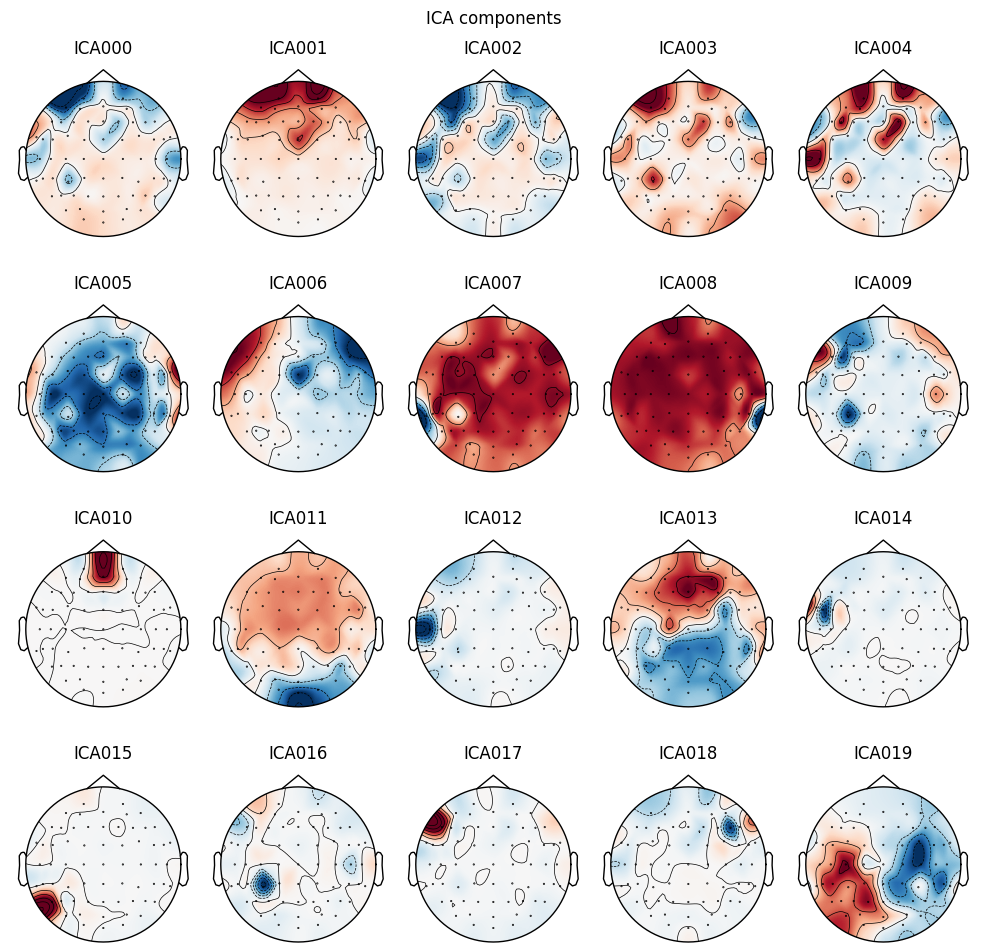

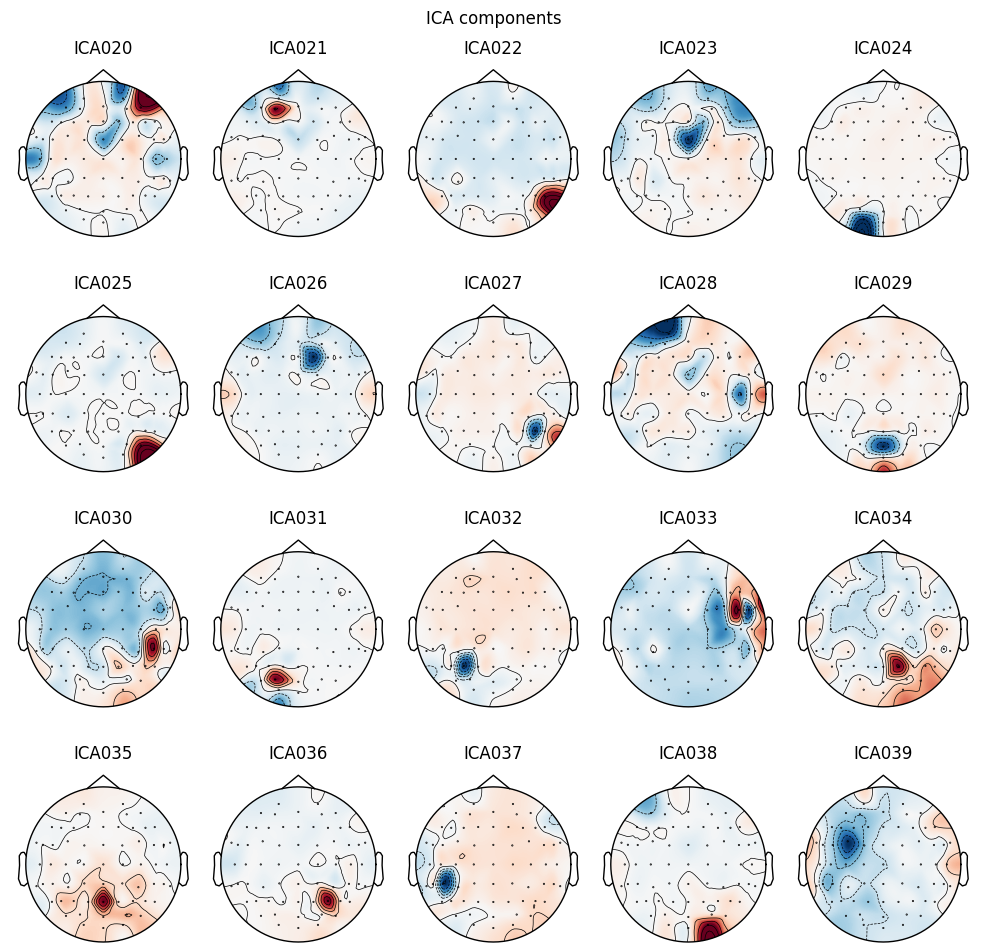

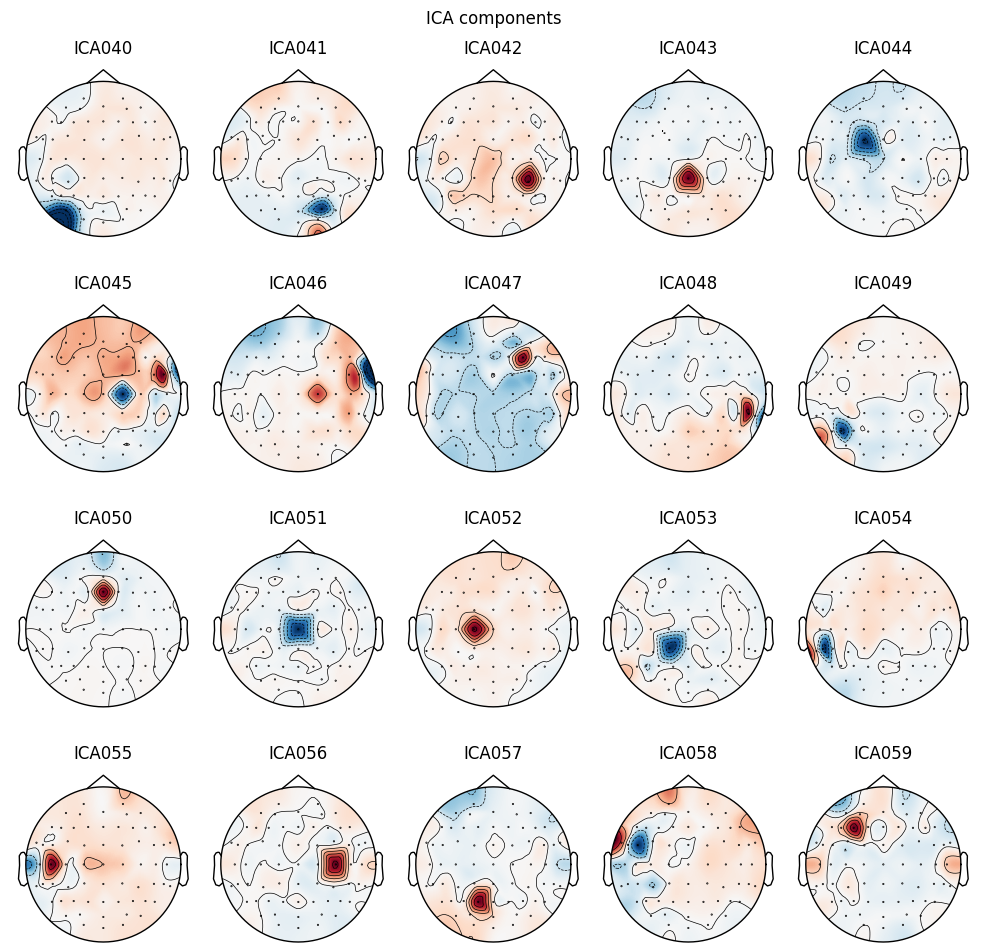

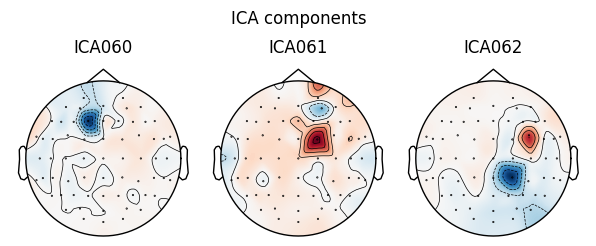

[0, 1, 17, 6, 2] [array([-9.51704319e-01,  2.58475123e-01, -4.01050037e-02, -2.63581211e-02,
        3.48019398e-02, -3.67922730e-02,  7.92567120e-03,  3.11173695e-02,
        3.71178680e-02, -8.02444929e-03,  3.83365504e-03,  2.71827548e-02,
        1.97889685e-02,  3.60702009e-02, -1.11017814e-02,  2.52764492e-02,
        5.45492646e-03,  1.33375104e-02,  2.57540772e-02, -1.08421021e-02,
        3.35884658e-02,  1.23751797e-02, -3.16694840e-02, -1.96336944e-04,
       -2.52494466e-03, -2.62671918e-02,  3.52803283e-04,  3.12526827e-03,
       -7.94986523e-03,  6.01052932e-03, -6.52404931e-02,  7.50745460e-03,
        3.41310713e-03, -1.46486489e-02, -4.79707856e-03,  3.31018323e-03,
       -4.29519225e-02,  3.60249959e-02, -1.86835483e-02, -1.18152958e-02,
        2.16924299e-02,  3.07909141e-02,  6.01732379e-03, -2.70145433e-02,
        9.11707744e-03,  1.91026604e-02, -1.11787930e-02,  8.44981710e-04,
        5.75385622e-03,  8.79434162e-03, -1.38488042e-02, -1.69681690e-03,
       

KeyboardInterrupt: 

In [75]:
from time import perf_counter
from pyprep.find_noisy_channels import NoisyChannels
data_folder = r"D:\Work_data\Notification_evoked_response\Data_at_IITD/bids_data/"
subjects = [sub for sub in os.listdir(data_folder) if (("sub-" in sub) & (os.path.isdir(os.path.join(data_folder,sub))))]
print(subjects)
folder =  r"E:\ecf-exp2-notif-mmn\data\Processed\\"
data_type = "eeg"
 # it is useful to scroll eeg data 
B1_MMN_erp_evoked_dict  = {} 
PN_devi_eps_evoked_dict  = {}
BN_sta_eps_evoked_dict  = {}
BN_devi_eps_evoked_dict = {}
PN_sta_eps_evoked_dict = {}
B2_MMN_erp_evoked_dict = {}
CN_devi_eps_evoked_dict = {}
CN_sta_eps_evoked_dict = {}
B1_sub_epoch_num = {}
B2_sub_epoch_num = {}

B3_sub_epoch_num = {}
epoch_per_num = {"subject Dropped":[]}
for sub in subjects:
    path = os.path.join(data_folder,sub,data_type)
    
    for eeg in os.listdir(path):
        print(sub)
        if eeg[-5:] == ".vhdr":
            if   sub   in  ['sub-sd041','sub-sd046','sub-sd058']:
                continue
               
            raw = mne.io.read_raw_brainvision(os.path.join(path,eeg), preload=True)
            print(os.path.join(path,eeg))
            #raw = mne.add_reference_channels(raw, ref_channels=["Cz"])
            raw.set_montage("easycap-M1")
            #raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue",event_color ='black',show_options=True )
            # Now re-reference the data :-n average reference 
            #raw.set_eeg_reference('average')
            raw.set_eeg_reference(ref_channels=['TP9', 'TP10'])
            raw.resample(512) 
            # filter 
            raw.filter(l_freq=0.5,h_freq=30,n_jobs='cuda') 
            #ICA 
            ica = ICA(n_components=None   )
            ica.fit(raw)
            print("ICA Completed ...")
            ica.plot_components()
            
            #removing Eye movement artifacts 
            eog_channels = ['Fp1', 'Fp2',"AF7","AF8",'F7', 'F8']  # Adjust these to match your channel names
            eog_indices, eog_scores = ica.find_bads_eog(raw, ch_name=eog_channels)
            print(eog_indices, eog_scores)
            ica.exclude = eog_indices
            ica.apply(raw)
            nd = NoisyChannels(raw, random_state=1337)
            start_time = perf_counter()
            nd.find_bad_by_ransac(channel_wise=True)
            print("--- %s seconds ---" % (perf_counter() - start_time))
            print(nd.bad_by_ransac,nd.find_all_bads(),nd.get_bads())
            raw.export(f'{os.path.join(folder,sub)}-preprocessed.set', overwrite=True, fmt='eeglab')
            #raw.plot(scalings=dict(eeg=40e-6),clipping='transparent',duration=30.0, start=690.0, n_channels=63,color = "Blue" )
            """events,event_dict = mne.events_from_annotations(raw)
            #   print(events,event_dict)
            # Create Epochs without droping the eye blink event
            event_id = {
                'S14': event_dict['Stimulus/S   14'],
                'S15': event_dict['Stimulus/S   15'],
                'S24': event_dict['Stimulus/S   24'],
                'S25': event_dict['Stimulus/S   25'],}
            epochs = mne.Epochs(raw, events, event_id=event_id,baseline=(None, 0) ,detrend = 1, tmin=-0.300, tmax=0.900, preload=True,event_repeated='merge')
            # Define your MMN channels

            mmn_channels = [ 'Fz', 'Cz','Pz']  #Example MMN channels, adjust as needed
            try:
                epochs.drop_channels(['GSR', 'PPG'])
                S34 = event_dict['Stimulus/S   34']
                S35 = event_dict['Stimulus/S   35']
                
                CN_epochs = mne.Epochs(raw, events, event_id=[S34,S35],baseline=(None, 0), tmin=-0.300, tmax=0.900,detrend = 1, preload=True,event_repeated='merge')
                CN_epochs.drop_channels(['GSR', 'PPG'])
                CN_cleaned_epochs, ar_model = optimize_autoreject(CN_epochs, subset_size=250)
                # ar = AutoReject(n_jobs=-1, cv=3, thresh_method='random_search',verbose=False)
                # CN_cleaned_epochs = ar.fit_transform(epochs)
                #CN_cleaned_epochs = remove_or_interpolate_epochs_with_n_bad_chn(CN_epochs,  bad_chn_threshold = 6, amplitude_threshold=75e-6)
                #CN_cleaned_epochs = remove_epochs_with_bad_mmn_channels(CN_epochs, mmn_channels, amplitude_threshold=80e-6)
                CN_devi_eps = CN_cleaned_epochs[str(S35)].average()
                CN_sta_eps = CN_cleaned_epochs[str(S34)].average()
                CN_devi_eps_evoked_dict[sub] = CN_devi_eps
                CN_sta_eps_evoked_dict[sub] = CN_sta_eps
                B3_sub_epoch_num[sub] =len(cleaned_epochs[str(S34),str(S35)]) 
            except:                                  
                print("NO PPG sensor")
                pass
            cleaned_epochs, ar_model = optimize_autoreject(epochs, subset_size=500)
            
            # ar = AutoReject(n_jobs = -1,  cv=3, thresh_method='random_search', verbose=False)
            # cleaned_epochs = ar.fit_transform(epochs)
            
            
            #cleaned_epochs = remove_or_interpolate_epochs_with_n_bad_chn(epochs,  bad_chn_threshold = 6, amplitude_threshold=80e-6)
            #cleaned_epochs = remove_epochs_with_n_bad_channels(epochs, bad_chn_thresold = 8, amplitude_threshold=80e-6)
            #cleaned_epochs = remove_epochs_with_bad_mmn_channels(epochs, mmn_channels, amplitude_threshold=80e-6)
            # if len(cleaned_epochs[str(S14),str(S15)]) < 450 or  len(cleaned_epochs[str(S24),str(S25)]) < 450 :
            #     epoch_per_num["subject Dropped"].append(sub)  
            #     print("B1 len :",len(cleaned_epochs[str(S14),str(S15)]),"B2 len :",len(cleaned_epochs[str(S24),str(S25)]))
            #     continue
            cleaned_epochs.save(f'{os.path.join(folder,sub)}-epo.fif', overwrite=True)
            export_epochs(f'{os.path.join(folder,sub)}.set',cleaned_epochs, overwrite=True)
            print(f"Original number of epochs: {len(epochs)}")
            print(f"Number of epochs after removal: {len(cleaned_epochs)}")
            try:
                PN_devi_eps = cleaned_epochs['S15'].average()
                BN_sta_eps = cleaned_epochs['S14'].average()
                B1_MMN_erp = mne.combine_evoked([ PN_devi_eps,BN_sta_eps], weights=[1,-1])
            
                PN_devi_eps_evoked_dict[sub] = PN_devi_eps 
                BN_sta_eps_evoked_dict[sub] = BN_sta_eps
                B1_MMN_erp_evoked_dict[sub] = B1_MMN_erp
                B1_sub_epoch_num[sub] = {"BN_std":len(cleaned_epochs['S14']) , "PN_deviant": len(cleaned_epochs['S15'])}
                #mne.viz.plot_compare_evokeds(evokeds, picks=picks,title  = str (sub) + " BLock1 avaerage 'F3', 'Fz', 'F4'", combine="mean")

                # Block 2 

                BN_devi_eps = cleaned_epochs['S25'].average()
                PN_sta_eps = cleaned_epochs['S24'].average()    
                B2_MMN_erp = mne.combine_evoked( [ BN_devi_eps,PN_sta_eps], weights=[1,-1]) 
            
                BN_devi_eps_evoked_dict[sub] = BN_devi_eps
                PN_sta_eps_evoked_dict[sub] = PN_sta_eps  
                B2_MMN_erp_evoked_dict[sub] = B2_MMN_erp
                B2_sub_epoch_num[sub] = {"PN_std":len(cleaned_epochs['S24']) , "BN_deviant": len(cleaned_epochs['S15'])}
            except:   
                print("ERRor FOr epoching ")    """
            

In [78]:
def quantitative_ransac_analysis(nc, custom_corr_thresh=0.8, custom_frac_thresh=0.3):
    """
    Apply custom quantitative thresholds to RANSAC results
    """
    ransac_info = nc._extra_info['bad_by_ransac']
    correlations = ransac_info['ransac_correlations']
    
    # Calculate custom metrics
    mean_correlations = np.mean(correlations, axis=0)
    min_correlations = np.min(correlations, axis=0)
    std_correlations = np.std(correlations, axis=0)
    
    # Apply custom thresholds
    bad_by_custom_corr = correlations < custom_corr_thresh
    custom_bad_fractions = np.mean(bad_by_custom_corr, axis=0)
    
    # Identify channels exceeding custom threshold
    bad_channels_custom = []
    for i, frac in enumerate(custom_bad_fractions):
        if frac > custom_frac_thresh:
            bad_channels_custom.append(nc.ch_names_original[i])
    
    return {
        'bad_channels': bad_channels_custom,
        'mean_correlations': mean_correlations,
        'min_correlations': min_correlations,
        'std_correlations': std_correlations,
        'bad_window_fractions': custom_bad_fractions
    }

# Apply custom analysis
custom_results = quantitative_ransac_analysis(nd, custom_corr_thresh=0.9, custom_frac_thresh=0.2)
custom_results


{'bad_channels': ['Fp1',
  'Fz',
  'F3',
  'F7',
  'FC5',
  'T7',
  'CP5',
  'Pz',
  'P3',
  'P4',
  'TP10',
  'CP6',
  'T8',
  'FT10',
  'FC6',
  'F4',
  'F8',
  'Fp2',
  'AF7',
  'AF3',
  'F5',
  'FT7',
  'TP7',
  'CP3',
  'P5',
  'PO3',
  'POz',
  'PO4',
  'PO8',
  'P6',
  'P2',
  'CPz',
  'CP4',
  'TP8',
  'C6',
  'C2',
  'FC4',
  'FT8',
  'F6',
  'AF8',
  'AF4',
  'F2',
  'FCz',
  'Cz'],
 'mean_correlations': array([0.92302632, 0.88462157, 0.90061003, 0.83944553, 0.93124416,
        0.89979026, 0.93652768, 0.96265718, 0.55811904, 0.95543125,
        0.88106203, 0.93584335, 0.91069434, 0.89214948, 1.        ,
        1.        , 0.94070848, 0.94695245, 0.87109674, 1.        ,
        0.7126999 , 0.90248353, 0.95417229, 0.94439825, 0.79291684,
        0.88977766, 0.89472815, 0.95052363, 0.91300212, 0.88137953,
        0.85932701, 0.91395265, 0.90691012, 1.        , 0.94088102,
        0.89224715, 0.81730095, 0.96318198, 0.92563877, 0.93551053,
        0.91370405, 0.49728593, 0.92049

In [66]:
raw.info['bads']

[]

In [ ]:
epochs.event_id 

{'S14': 10002, 'S15': 10003, 'S24': 10005, 'S25': 10006}

In [11]:
cleaned_epochs.event_id

{'S14': 10002, 'S15': 10003, 'S24': 10005, 'S25': 10006}

In [12]:
B1_sub_epoch_num, B2_sub_epoch_num

({'sub-sd011': {'BN_std': 748, 'PN_deviant': 150},
  'sub-sd012': {'BN_std': 743, 'PN_deviant': 148},
  'sub-sd013': {'BN_std': 743, 'PN_deviant': 148},
  'sub-sd014': {'BN_std': 682, 'PN_deviant': 139},
  'sub-sd015': {'BN_std': 748, 'PN_deviant': 150},
  'sub-sd016': {'BN_std': 746, 'PN_deviant': 148},
  'sub-sd017': {'BN_std': 725, 'PN_deviant': 147},
  'sub-sd018': {'BN_std': 743, 'PN_deviant': 148},
  'sub-sd019': {'BN_std': 610, 'PN_deviant': 121},
  'sub-sd020': {'BN_std': 709, 'PN_deviant': 143},
  'sub-sd021': {'BN_std': 726, 'PN_deviant': 145},
  'sub-sd022': {'BN_std': 743, 'PN_deviant': 150},
  'sub-sd023': {'BN_std': 749, 'PN_deviant': 150},
  'sub-sd024': {'BN_std': 743, 'PN_deviant': 149},
  'sub-sd025': {'BN_std': 731, 'PN_deviant': 149},
  'sub-sd026': {'BN_std': 723, 'PN_deviant': 146},
  'sub-sd027': {'BN_std': 747, 'PN_deviant': 150},
  'sub-sd028': {'BN_std': 738, 'PN_deviant': 147},
  'sub-sd029': {'BN_std': 749, 'PN_deviant': 149},
  'sub-sd030': {'BN_std': 743, 

In [13]:
len(B2_MMN_erp_evoked_dict.keys())

54

In [14]:
sum(B1_sub_epoch_num[sub].values())

899

### identify the bad subjects based on the Epoch

In [15]:
B1_sub = [sub for  sub in  B1_sub_epoch_num if sum(B1_sub_epoch_num[sub].values()) <450]
B2_sub = [sub for  sub in  B2_sub_epoch_num if sum(B2_sub_epoch_num[sub].values()) <450]
B1_sub.extend(B2_sub)
bad_subs  = list(set(B1_sub))

In [16]:
bad_subs

[]

In [17]:
#bads = ['sub-sd051',  'sub-sd065']
def remove_bad_sub(evoked_dict, bad_sub):
    subjects = list(evoked_dict.keys())
    for sub in subjects:
        if sub in bad_sub:
            del evoked_dict[sub]
    return evoked_dict  
#bad_subs.extend(bads)
PN_sta_eps_evoked_dict = remove_bad_sub(PN_sta_eps_evoked_dict ,bad_subs)
PN_devi_eps_evoked_dict = remove_bad_sub(PN_devi_eps_evoked_dict ,bad_subs)

BN_sta_eps_evoked_dict = remove_bad_sub(BN_sta_eps_evoked_dict ,bad_subs)
BN_devi_eps_evoked_dict = remove_bad_sub(BN_devi_eps_evoked_dict ,bad_subs)

CN_sta_eps_evoked_dict = remove_bad_sub(CN_sta_eps_evoked_dict ,bad_subs)
CN_devi_eps_evoked_dict = remove_bad_sub(CN_devi_eps_evoked_dict ,bad_subs)

In [18]:
len(PN_sta_eps_evoked_dict.keys())

54

### Collecting all ERps 


In [19]:
PN_MMN_evokeds_dict = {sub1:mne.combine_evoked([PN_devi_eps_evoked_dict[sub1], PN_sta_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(PN_devi_eps_evoked_dict,PN_sta_eps_evoked_dict) if sub1== sub2 and sub1 not in bad_subs}  
BN_MMN_evokeds_dict = {sub1:mne.combine_evoked([BN_devi_eps_evoked_dict[sub1], BN_sta_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(BN_devi_eps_evoked_dict,BN_sta_eps_evoked_dict) if sub1== sub2 and sub1 not in bad_subs}  
CN_MMN_evokeds_dict = {sub1:mne.combine_evoked([CN_devi_eps_evoked_dict[sub1], CN_sta_eps_evoked_dict[sub1]], weights=[1, -1])
    for sub1,sub2 in zip(CN_devi_eps_evoked_dict,CN_sta_eps_evoked_dict) if sub1== sub2 and sub1 not in bad_subs}  

In [20]:
len(PN_devi_eps_evoked_dict), len(PN_MMN_evokeds_dict),len(CN_MMN_evokeds_dict)

(54, 54, 24)

# MMN Plots for total subjects 

In [21]:
"""folder =  r"E:\ecf-exp2-notif-mmn\data\Processed\\"
SN_deviant_file = "SN_deviant_evoked_dict.pkl"
SN_std_file = "SN_standard_evoked_dict.pkl"
BN_deviant_file = "BN_deviant_evoked_dict.pkl"
BN_std_file = "BN_standard_evoked_dict.pkl"
CN_deviant_file = "CN_deviant_evoked_dict.pkl"
CN_std_file = "CN_standard_evoked_dict.pkl"
import pickle


# Save each to its own file
with open(os.path.join(folder,SN_deviant_file), 'wb') as f:
    pickle.dump(PN_devi_eps_evoked_dict, f)

with open(os.path.join(folder,SN_std_file), 'wb') as f:
    pickle.dump(PN_sta_eps_evoked_dict, f)

with open(os.path.join(folder,BN_deviant_file), 'wb') as f:
    pickle.dump(BN_devi_eps_evoked_dict, f)

with open(os.path.join(folder,BN_std_file), 'wb') as f:
    pickle.dump(BN_sta_eps_evoked_dict, f)

with open(os.path.join(folder,CN_deviant_file), 'wb') as f:
    pickle.dump(CN_devi_eps_evoked_dict, f)

with open(os.path.join(folder,CN_std_file), 'wb') as f:
    pickle.dump(CN_sta_eps_evoked_dict, f)
"""

<>:1: SyntaxWarning: invalid escape sequence '\e'
<>:1: SyntaxWarning: invalid escape sequence '\e'
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_47228\2362196200.py:1: SyntaxWarning: invalid escape sequence '\e'
  """folder =  r"E:\ecf-exp2-notif-mmn\data\Processed\\"


'folder =  r"E:\\ecf-exp2-notif-mmn\\data\\Processed\\"\nSN_deviant_file = "SN_deviant_evoked_dict.pkl"\nSN_std_file = "SN_standard_evoked_dict.pkl"\nBN_deviant_file = "BN_deviant_evoked_dict.pkl"\nBN_std_file = "BN_standard_evoked_dict.pkl"\nCN_deviant_file = "CN_deviant_evoked_dict.pkl"\nCN_std_file = "CN_standard_evoked_dict.pkl"\nimport pickle\n\n\n# Save each to its own file\nwith open(os.path.join(folder,SN_deviant_file), \'wb\') as f:\n    pickle.dump(PN_devi_eps_evoked_dict, f)\n\nwith open(os.path.join(folder,SN_std_file), \'wb\') as f:\n    pickle.dump(PN_sta_eps_evoked_dict, f)\n\nwith open(os.path.join(folder,BN_deviant_file), \'wb\') as f:\n    pickle.dump(BN_devi_eps_evoked_dict, f)\n\nwith open(os.path.join(folder,BN_std_file), \'wb\') as f:\n    pickle.dump(BN_sta_eps_evoked_dict, f)\n\nwith open(os.path.join(folder,CN_deviant_file), \'wb\') as f:\n    pickle.dump(CN_devi_eps_evoked_dict, f)\n\nwith open(os.path.join(folder,CN_std_file), \'wb\') as f:\n    pickle.dump(C

In [22]:
bads = []
['sub-sd041','sub-sd046','sub-sd058']

['sub-sd041', 'sub-sd046', 'sub-sd058']

In [23]:
len(BN_sta_eps_evoked_dict.keys())

54

In [24]:
len([evk for sub,evk in BN_sta_eps_evoked_dict.items() if sub not in bads]),bad_subs

(54, [])

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_47228\872330679.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_47228\872330679.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_47228\872330679.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


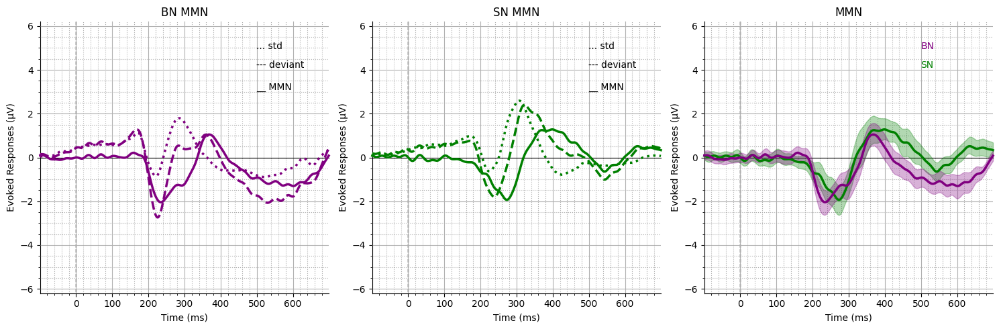

In [25]:


stylesdict ={"std": {"linewidth": 2.5,"linestyle":'dotted'},
             'deviant' : {"linewidth": 2.5,"linestyle":'--'},
             'MMN': {"linewidth": 2.5,"linestyle":'solid'},
             }
text_labels = [
    (0.90, "... std",'black'),
    (0.83, f"--- deviant",'black'),
    (0.75, f"__ MMN ",'black'),
]


#picks = ["Fz", 'FCz', 'Cz' ,'F1', 'F2', 'C1', 'C2', 'FC1','FC2','F3', 'F4', 'C3', 'C4', 'FC3','FC4']

picks = ['Cz' ]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 5), dpi=100)

# Define BN ERPs comparison
BN_evokeds = {
           'std': [evk for sub,evk in BN_sta_eps_evoked_dict.items() if sub not in bads],
           'deviant':[evk for  sub,evk in BN_devi_eps_evoked_dict.items() if sub not in bads],
           'MMN': [evk for  sub,evk in BN_MMN_evokeds_dict.items()  if sub not in bads ] ,
                      }
 
plot_erps(BN_evokeds, picks=picks ,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="BN MMN",axs=axs[0],color=['purple']*3)

# Define PN ERPs comparison
PN_evokeds = {
           'std': [evk for sub,evk in PN_sta_eps_evoked_dict.items() if sub not in bads],
           'deviant':[evk for  sub,evk in PN_devi_eps_evoked_dict.items() if sub not in bads],
           'MMN': [evk for  sub,evk in PN_MMN_evokeds_dict.items()  if sub not in bads] ,
                      }
 
plot_erps(PN_evokeds, picks=picks ,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="SN MMN",axs=axs[1],color=['green']*3)
# Define BN vs PN ERPs comparison
MMN_evokeds = {
           'PN': [evk for  sub,evk in PN_MMN_evokeds_dict.items() if sub not in bads] ,
           'BN':[evk for  sub,evk in BN_MMN_evokeds_dict.items() if sub not in bads] ,
                      }
stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [ 
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
plot_erps(MMN_evokeds, picks=picks ,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="MMN",axs=axs[2])
plt.tight_layout()
plt.show()

In [26]:
len([evk for  sub,evk in PN_MMN_evokeds_dict.items() if sub not in bads])

54

In [27]:
len([evk for  sub,evk in PN_MMN_evokeds_dict.items() if sub not in bads])

54

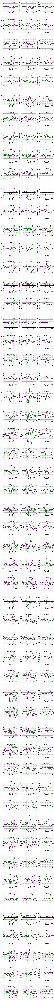

In [28]:
stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
]
plt.rcParams.update({
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'axes.labelsize': 10,
        'axes.titlesize': 10,
        'legend.fontsize': 10,
    })
picks= ['Fz','Cz',"FCz"]
bads = ["sub-sd034",'sub-sd050','sub-sd051', 'sub-sd055','sub-sd056', 'sub-sd056','sub-sd059','sub-sd067','sub-sd063']
fig, axs = plt.subplots(len(PN_MMN_evokeds_dict), 3, figsize=(9  , 3*len(PN_MMN_evokeds_dict)), dpi=100)
for i, subject in enumerate(PN_MMN_evokeds_dict):
    # Define BN vs PN ERPs comparison
    #fig, axs = plt.subplots(1, 3, figsize=(15, 5), dpi=100)
    MMN_evokeds = {
           'PN': [PN_sta_eps_evoked_dict[subject]] ,
           'BN':[BN_sta_eps_evoked_dict[subject] ] ,
                      }
    plot_erps(MMN_evokeds, picks=picks ,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="stad",axs=axs[i,2])
    
    MMN_evokeds = {
           'PN': [PN_devi_eps_evoked_dict[subject] ] ,
           'BN':[BN_devi_eps_evoked_dict[subject] ] ,
                      }
    plot_erps(MMN_evokeds, picks=picks ,
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f"deviant",axs=axs[i,1])
    MMN_evokeds = { 
           'PN': [PN_MMN_evokeds_dict[subject]] ,
           'BN':[BN_MMN_evokeds_dict[subject] ] ,
                      }
    plot_erps(MMN_evokeds, picks=picks , 
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title=f" {subject}",axs=axs[i,0])
plt.tight_layout()
plt.show()  

In [29]:
len([evk for  sub,evk in PN_MMN_evokeds_dict.items() if sub  not in bads])

46

c:\Users\PRAKASH\AppData\Local\anaconda3\envs\EEG_analysis\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


First significant MMN onset: 0.199 s


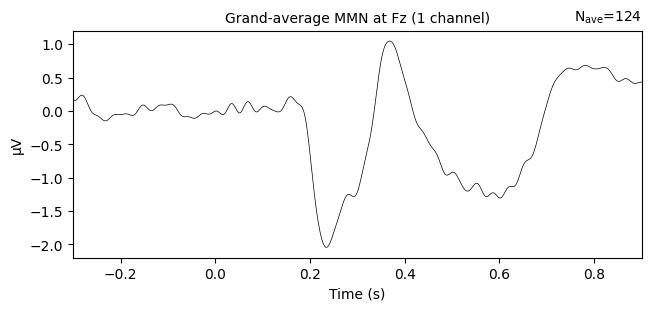

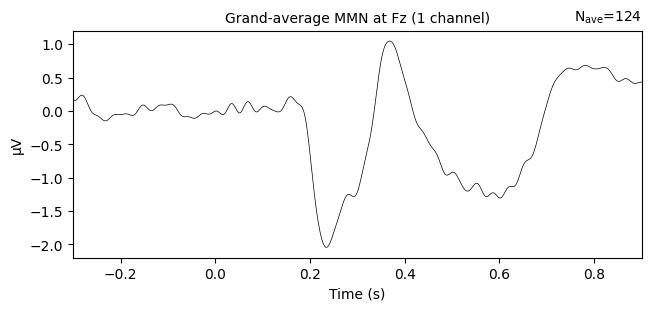

In [30]:
from mne.stats import permutation_cluster_1samp_test
X = np.array([evk.data for evk in BN_MMN_evokeds_dict.values()])  # list of Evoked → 3D array

# Get info and times from one Evoked (they are all aligned)
info = list(PN_MMN_evokeds_dict.values())[0].info
times = list(PN_MMN_evokeds_dict.values())[0].times
ch_names = list(PN_MMN_evokeds_dict.values())[0].ch_names

# Run cluster-based permutation test
T_obs, clusters, p_values, H0 = permutation_cluster_1samp_test(
    X,                                # shape: (n_subjects, n_channels, n_times)
    n_permutations=1000,
    threshold=None,                   # use default t-threshold
    tail=-1,                          # MMN is usually negative
    out_type='mask',
    seed=42
)

# Report significant clusters
significant_clusters = [clu for clu, p in zip(clusters, p_values) if p < 0.05]
if significant_clusters:
    first_clu = significant_clusters[0]
    times_in_cluster = np.where(first_clu)[1]
    first_onset_time = times[times_in_cluster[0]]
    print(f"First significant MMN onset: {first_onset_time:.3f} s")
else:
    print("No significant MMN cluster found.")

# Optional: Plot grand-average MMN for a key channel (e.g., Fz)
mean_evoked = list(BN_MMN_evokeds_dict.values())[0].copy()
mean_evoked.data = X.mean(axis=0)

mean_evoked.plot(picks="Cz", titles="Grand-average MMN at Fz")

In [31]:
import numpy as np
from scipy.stats import ttest_ind
import mne

# Example input:
evoked_dict = PN_MMN_evokeds_dict

# Config
channel_of_interest = 'Fz'  # or average multiple channels
baseline_interval = (-0.1, 0.0)  # in seconds
test_interval = (0.0, 0.4)  # test post-stim up to 400 ms
alpha = 0.05  # significance level

first_sig_times = {}  # To store results per subject

for subj_id, evoked in evoked_dict.items():
    times = evoked.times
    ch_idx = evoked.ch_names.index(channel_of_interest)
    data = evoked.data[ch_idx]  # shape: (n_times,)

    # Baseline indices
    baseline_mask = (times >= baseline_interval[0]) & (times <= baseline_interval[1])
    baseline_data = data[baseline_mask]

    # Post-stim test window
    test_mask = (times >= test_interval[0]) & (times <= test_interval[1])
    test_times = times[test_mask]
    test_data = data[test_mask]

    # Run one-sided t-test at each time point (signal < baseline)
    sig_found = False
    for i, val in enumerate(test_data):
        t_stat, p_val = ttest_ind([val], baseline_data, alternative='less')
        if p_val < alpha:
            first_sig_times[subj_id] = test_times[i]
            first_sig_times[subj_id]= {'beep': {'time': test_times[i]},
                                       'sn': {'time': test_times[i]}}
            sig_found = True
            break

    if not sig_found:
        first_sig_times[subj_id]= {'beep': {'time': None},
                                       'sn': {'time': None}}  # No significant deviation found

# # Print results
# for subj, time in first_sig_times.items():
#     print(f"Subject {subj}: First significant MMN at {time * 1000:.1f} ms" if time else f"Subject {subj}: No significant MMN found")
first_sig_times

{'sub-sd011': {'beep': {'time': 0.1953125}, 'sn': {'time': 0.1953125}},
 'sub-sd012': {'beep': {'time': 0.263671875}, 'sn': {'time': 0.263671875}},
 'sub-sd013': {'beep': {'time': 0.111328125}, 'sn': {'time': 0.111328125}},
 'sub-sd014': {'beep': {'time': 0.23046875}, 'sn': {'time': 0.23046875}},
 'sub-sd015': {'beep': {'time': 0.02734375}, 'sn': {'time': 0.02734375}},
 'sub-sd016': {'beep': {'time': 0.015625}, 'sn': {'time': 0.015625}},
 'sub-sd017': {'beep': {'time': 0.0078125}, 'sn': {'time': 0.0078125}},
 'sub-sd018': {'beep': {'time': 0.0}, 'sn': {'time': 0.0}},
 'sub-sd019': {'beep': {'time': 0.05859375}, 'sn': {'time': 0.05859375}},
 'sub-sd020': {'beep': {'time': 0.07421875}, 'sn': {'time': 0.07421875}},
 'sub-sd021': {'beep': {'time': 0.01171875}, 'sn': {'time': 0.01171875}},
 'sub-sd022': {'beep': {'time': 0.27734375}, 'sn': {'time': 0.27734375}},
 'sub-sd023': {'beep': {'time': 0.232421875}, 'sn': {'time': 0.232421875}},
 'sub-sd024': {'beep': {'time': 0.037109375}, 'sn': {'

### Topo Plots

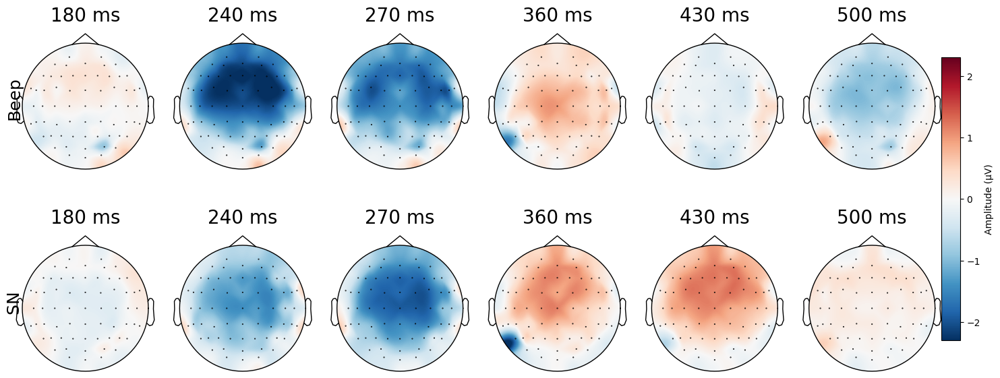

In [32]:
import matplotlib as mpl
# Define time points
time_points = [.180,.240, .270,.360,.430,.5,]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average([evk for  sub,evk in BN_MMN_evokeds_dict.items() ]).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average([evk for  sub,evk in PN_MMN_evokeds_dict.items() ]).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'Beep', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'SN ', fontsize=18   , rotation=90, va='center')

plt.show()

### Statistical test 

In [33]:
plt.rcParams.update({
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'axes.labelsize': 18,
        'axes.titlesize': 18,
        'legend.fontsize': 18,
    })

Statistical test results:
overall: t=1.104, p=0.275
channel_Fz: t=1.773, p=0.082
channel_Cz: t=0.563, p=0.576
channel_FCz: t=0.840, p=0.405
Statistical test results:
overall: t=2.909, p=0.005
channel_Fz: t=3.101, p=0.003
channel_Cz: t=2.978, p=0.004
channel_FCz: t=2.515, p=0.015


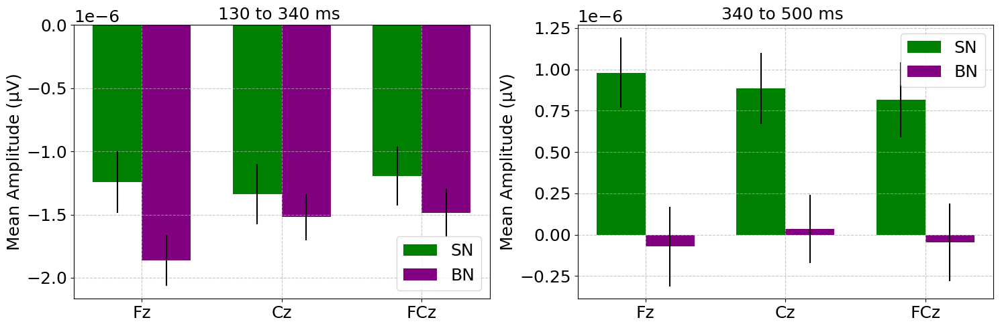

In [34]:
time_window = (200, 300)  # MMN typically 100-250ms
channels = picks  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=time_window, channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")

# Visualize
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[0],title= '130 to 340 ms ')

PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=(340,500), channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[1],title= '340 to 500 ms ')
plt.tight_layout()
plt.show()


 Mean  Amplitude : t_stat [0.56290723] with , p_value [0.57587167]
 Peak Amplitude : t_stat 0.4924113488315014 with , p_value 0.6244622737994432


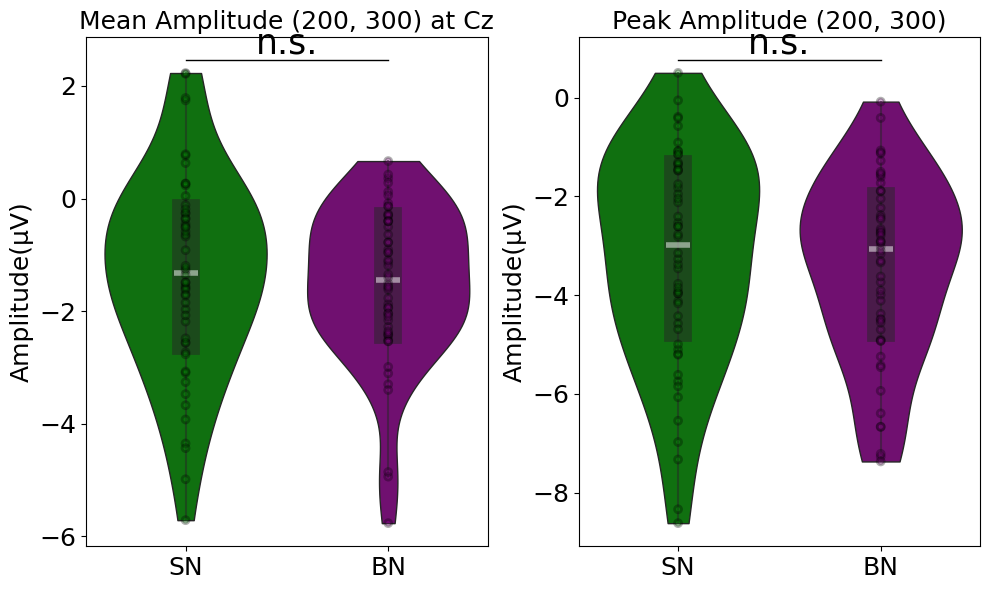

In [35]:
df_type = "Amplitude"
label=("SN", "BN")
time_window = (200,300)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels


# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=time_window, channels=channels
)



#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df = df_convert(PN_amps*1e+6, BN_amps*1e+6,label=("SN", "BN") ,df_type = df_type)
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)

sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(PN_amps, BN_amps)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])
PN_amps_peak = np.array(list(extract_peak_amplitude(PN_MMN_evokeds_dict,time_window = (.180, .300),channels=["Cz"]).values()))*1e+6
BN_amps_peak =np.array(list(extract_peak_amplitude(BN_MMN_evokeds_dict,time_window = (.180, .300),channels=["Cz"]).values()))*1e+6


# Fraction area plot 
df=df_convert(PN_amps_peak.reshape(-1, 1), BN_amps_peak.reshape(-1, 1),label=("SN", "BN") ,df_type = df_type)

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_rel(PN_amps_peak, BN_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

Peak Latency Results:
PN: 265.0 ± 34.8 ms
BN: 261.9 ± 35.3 ms
t(53) = 0.469, p = 0.641

Fractional Area Latency Results:
SN: 264.2 ± 23.1 ms
BN: 260.9 ± 22.6 ms
t(52) = 0.691, p = 0.493


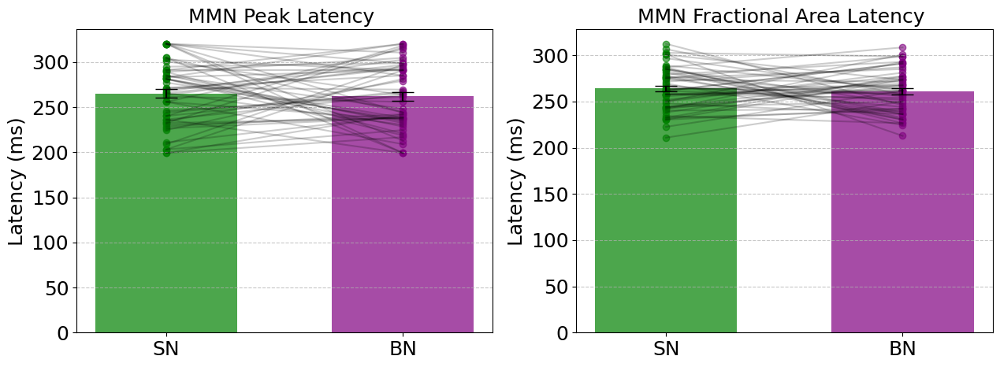

In [36]:
# Define parameters based on MMN literature
time_window = (200, 320)  # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

# 1. Peak latency analysis
peak_lat1, peak_lat2, subjects = extract_mmn_latencies(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=time_window, 
    channels=channels, method='peak')
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
peak_results = run_latency_statistical_tests(peak_lat1, peak_lat2)
print("Peak Latency Results:") 
print(f"PN: {peak_results['mean_latency_case1']:.1f} ± {peak_results['std_latency_case1']:.1f} ms")
print(f"BN: {peak_results['mean_latency_case2']:.1f} ± {peak_results['std_latency_case2']:.1f} ms")
print(f"t({peak_results['n_valid']-1}) = {peak_results['t_stat']:.3f}, p = {peak_results['p_value']:.3f}")

# Visualize
peak_fig = visualize_latency_results(peak_lat1, peak_lat2, subjects, "Peak",ax = axs[0],color=["green",'purple'],label=["SN",'BN'])


# 2. Fractional area latency analysis (50%) - more robust to noise
area_lat1, area_lat2, subjects = extract_mmn_latencies(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict, time_window=time_window, 
    channels=channels, method='fractional_area', fractional_area=0.50)

area_results = run_latency_statistical_tests(area_lat1, area_lat2)
print("\nFractional Area Latency Results:")
print(f"SN: {area_results['mean_latency_case1']:.1f} ± {area_results['std_latency_case1']:.1f} ms")
print(f"BN: {area_results['mean_latency_case2']:.1f} ± {area_results['std_latency_case2']:.1f} ms")
print(f"t({area_results['n_valid']-1}) = {area_results['t_stat']:.3f}, p = {area_results['p_value']:.3f}")

# Visualize
area_fig = visualize_latency_results(area_lat1, area_lat2, subjects, "Fractional Area",ax = axs[1],color=["green",'purple'],label=["SN",'BN'])
plt.show()

Peak latency ;- t_stat [0.46904574] with , p_value [0.64096071]
Fractional area (50 %) latency ;- t_stat 0.7898573327226607 with , p_value 0.4313912308406811


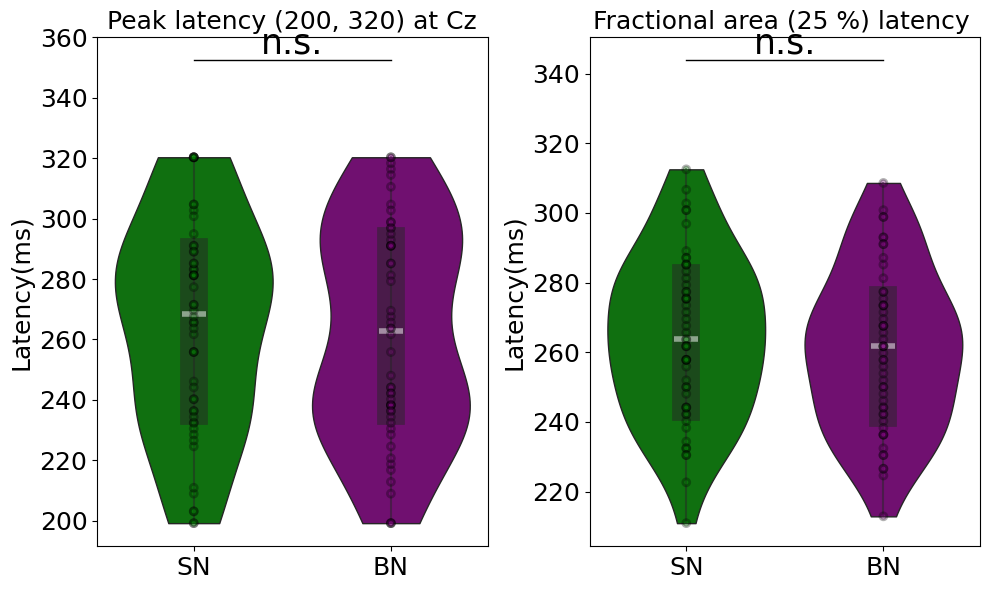

In [37]:
# Extract Latency
df_type = "Latency"
label=("SN", "BN")
time_window = (200, 320)  # ms - typical MMN window
channels =["Cz"]
# Set up the plot
df = df_convert(peak_lat1.reshape(-1,1), peak_lat2.reshape(-1,1) ,label=("SN", "BN"),df_type = df_type)


df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(peak_lat1.reshape(-1,1), peak_lat2.reshape(-1,1))
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df = df_convert(area_lat1.reshape(-1,1), area_lat2.reshape(-1,1) ,label=("SN", "BN"),df_type = df_type)
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind( area_lat1[~np.isnan(area_lat1)], area_lat2[~np.isnan(area_lat2)])
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (25 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

In [38]:
area_lat1, area_lat2

(array([263.671875, 296.875   , 244.140625, 273.4375  , 300.78125 ,
        263.671875, 242.1875  , 238.28125 , 240.234375, 275.390625,
        250.      , 279.296875, 232.421875, 257.8125  , 244.140625,
        261.71875 , 302.734375, 255.859375, 232.421875, 265.625   ,
        234.375   , 257.8125  , 250.      ,        nan, 230.46875 ,
        267.578125, 251.953125, 261.71875 , 275.390625, 271.484375,
        257.8125  , 222.65625 , 242.1875  , 244.140625, 261.71875 ,
        230.46875 , 248.046875, 269.53125 , 312.5     , 285.15625 ,
        277.34375 , 277.34375 , 306.640625, 281.25    , 257.8125  ,
        210.9375  , 287.109375, 285.15625 , 289.0625  , 283.203125,
        287.109375, 285.15625 , 275.390625, 300.78125 ]),
 array([267.578125, 261.71875 , 265.625   , 271.484375, 273.4375  ,
        261.71875 , 292.96875 , 275.390625, 242.1875  , 285.15625 ,
        281.25    , 292.96875 , 277.34375 , 259.765625, 273.4375  ,
        291.015625, 298.828125, 269.53125 , 240.234375, 25

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_47228\146990385.py:6: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
  t_vals, clusters, p_vals, h0 = mne.stats.permutation_cluster_test([condition1, condition2], out_type='mask', seed=111)


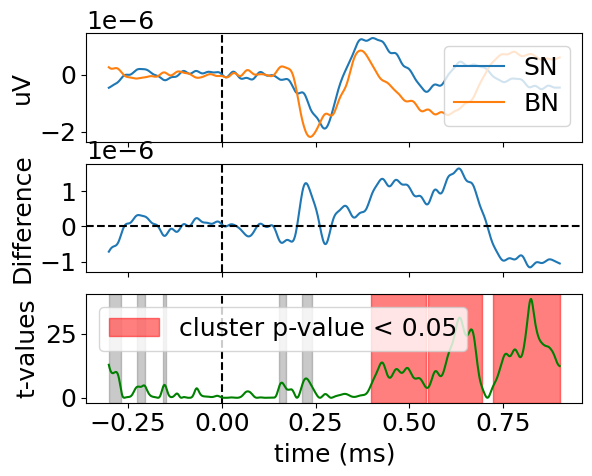

In [39]:
# Transform each condition to array
condition1 = np.mean([v.get_data(picks = ['Cz','Fz',"FCz"]) for k,v in PN_MMN_evokeds_dict.items()],axis = 1)
condition2 = np.mean([v.get_data(picks = ['Cz','Fz',"FCz"]) for k,v in BN_MMN_evokeds_dict.items()],axis = 1)

# Permutation test to find significant cluster of differences
t_vals, clusters, p_vals, h0 = mne.stats.permutation_cluster_test([condition1, condition2], out_type='mask', seed=111)

# Visualize
## <string>:1: RuntimeWarning: Ignoring argument "tail", performing 1-tailed F-test
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, sharex=True)

times = epochs.times
ax0.axvline(x=0, linestyle="--", color="black")
## <matplotlib.lines.Line2D object at 0x00000000BFAE7640>
ax0.plot(times, np.mean(condition1, axis=0), label="SN")
## [<matplotlib.lines.Line2D object at 0x00000000BFAF3D30>]
ax0.plot(times, np.mean(condition2, axis=0), label="BN")
## [<matplotlib.lines.Line2D object at 0x00000000BFAF3F40>]
ax0.legend(loc="upper right")
## <matplotlib.legend.Legend object at 0x00000000BFAF3EE0>
ax0.set_ylabel("uV")

# Difference
ax1.axvline(x=0, linestyle="--", color="black")
ax1.plot(times, condition1.mean(axis=0) - condition2.mean(axis=0))
## [<matplotlib.lines.Line2D object at 0x00000000BFB07B20>]
ax1.axhline(y=0, linestyle="--", color="black")
## <matplotlib.lines.Line2D object at 0x00000000BFB07CD0>
ax1.set_ylabel("Difference")

# T-values
ax2.axvline(x=0, linestyle="--", color="black")
h = None
for i, c in enumerate(clusters):
    c = c[0]
    if p_vals[i] <= 0.05:
        h = ax2.axvspan(times[c.start],
                        times[c.stop - 1],
                        color='red',
                        alpha=0.5)
    else:
        ax2.axvspan(times[c.start],
                    times[c.stop - 1],
                    color=(0.3, 0.3, 0.3),
                    alpha=0.3)
## <matplotlib.patches.Polygon object at 0x00000000BFB16550>
## <matplotlib.patches.Polygon object at 0x00000000BFB16BE0>
hf = ax2.plot(times, t_vals, 'g')
if h is not None:
    plt.legend((h, ), ('cluster p-value < 0.05', ))
## <matplotlib.legend.Legend object at 0x00000000BFB16D00>
plt.xlabel("time (ms)")
## Text(0.5, 0, 'time (ms)')
plt.ylabel("t-values")
## Text(0, 0.5, 't-values') b 
#plt.savefig("figures/fig2.png")

plt.show()

In [40]:
import mne
import numpy as np
import matplotlib.pyplot as plt
from mne.stats import permutation_cluster_1samp_test

# Assume your data is organized as:
# subject_data = {'subj_01': evoked_obj1, 'subj_02': evoked_obj2, ...}

def perform_permutation_test_per_subject(subject_data, channels_of_interest, 
                                       baseline_tmin=-0.1, baseline_tmax=0.0,
                                       roi_tmin=0.15, roi_tmax=0.25):
    """
    Perform permutation clustering test between baseline and ROI periods
    for each subject and channel separately.
    """
    results = {}
    
    for subject_id, evoked in subject_data.items():
        subject_results = {}
        
        for ch_name in channels_of_interest:
            # Get channel index
            ch_idx = evoked.ch_names.index(ch_name)
            
            # Extract baseline period data
            baseline_times = (evoked.times >= baseline_tmin) & (evoked.times <= baseline_tmax)
            baseline_data = evoked.data[ch_idx, baseline_times]
            
            # Extract ROI period data  
            roi_times = (evoked.times >= roi_tmin) & (evoked.times <= roi_tmax)
            roi_data = evoked.data[ch_idx, roi_times]
            
            # Calculate difference (ROI - baseline mean for each trial)
            baseline_mean = np.mean(baseline_data)
            difference_data = roi_data - baseline_mean
            
            # Perform one-sample permutation test on the difference
            T_obs, clusters, cluster_p_values, H0 = permutation_cluster_1samp_test(
                difference_data[np.newaxis, :],  # Add trial dimension
                n_permutations=1000,
                tail=0,  # two-tailed test
                threshold=None,  # Use default threshold
                verbose=False
            )
            
            subject_results[ch_name] = {
                'T_obs': T_obs,
                'clusters': clusters,
                'cluster_p_values': cluster_p_values,
                'roi_times': evoked.times[roi_times],
                'roi_data': roi_data,
                'baseline_mean': baseline_mean
            }
        
        results[subject_id] = subject_results
    
    return results

# Run the analysis
channels_of_interest = ['Fz', 'FCz', 'Cz']  # Adjust to your channel names
results = perform_permutation_test_per_subject(PN_MMN_evokeds_dict, channels_of_interest, baseline_tmin=-0.250, baseline_tmax=0.0,
                                       roi_tmin=0.200, roi_tmax=0.350)


c:\Users\PRAKASH\AppData\Local\anaconda3\envs\EEG_analysis\Lib\site-packages\numpy\core\fromnumeric.py:3787: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\PRAKASH\AppData\Local\anaconda3\envs\EEG_analysis\Lib\site-packages\numpy\core\_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_47228\2756012857.py:38: RuntimeWarning: Provided stat_fun does not treat variables independently. Setting buffer_size to None.
  T_obs, clusters, cluster_p_values, H0 = permutation_cluster_1samp_test(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_47228\2756012857.py:38: RuntimeWarning: No clusters found, returning empty H0, clusters, and cluster_pv
  T_obs, clusters, cluster_p_values, H0 = permutation_cluster_1samp_test(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_47228\2756012857.py:38: RuntimeWarning: Provided stat_fun does not treat 

# Ploting all subjects erp with latency peak

In [41]:
def plot_subject_erp_with_latency(subject_id, case1_dict, case2_dict, 
                                 time_window=(100, 300), channels=None,
                                 method='peak', fractional_area=0.50,
                                 case1_label='Beep MMN', case2_label='SN MMN',
                                 figsize=(10, 6)):
    """
    Plot ERPs for a single subject with latency markers.
    
    Parameters:
    -----------
    subject_id : str
        Subject identifier (e.g., 'sub-sd011')
    case1_dict, case2_dict : dict
        Dictionaries containing the evoked objects for each condition
    time_window : tuple
        Time window for latency detection (in ms)
    channels : list or None
        Channels to include in analysis
    method : str
        Latency detection method ('peak', 'fractional_area', 'onset')
    fractional_area : float
        Fraction value for fractional area method
    case1_label, case2_label : str
        Labels for the legend
    figsize : tuple
        Figure dimensions
        
    Returns:
    --------
    fig, ax : matplotlib figure and axis objects
    """
    # Get the evoked data
    evoked1 = case1_dict[subject_id].copy()
    evoked2 = case2_dict[subject_id].copy()
    
    # Pick channels if specified
    if channels:
        evoked1 = evoked1.pick_channels(channels)
        evoked2 = evoked2.pick_channels(channels)
    
    # Get full time range data
    times = evoked1.times * 1000  # Convert to ms
    data1 = np.mean(evoked1.data, axis=0) if len(evoked1.data.shape) > 1 else evoked1.data
    data2 = np.mean(evoked2.data, axis=0) if len(evoked2.data.shape) > 1 else evoked2.data
    
    # Create figure
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot ERPs
    ax.plot(times, data1, color='purple', label=case1_label)
    ax.plot(times, data2, color='green', label=case2_label)
    
    # Calculate latencies for this single subject
    # Create temporary single-subject dictionaries
    temp_case1 = {subject_id: evoked1}
    temp_case2 = {subject_id: evoked2}
    
    # Use your existing function for latency extraction
    case1_lats, case2_lats, subjs = extract_mmn_latencies(
        temp_case1, temp_case2, 
        time_window=time_window, 
        channels=channels,
        method=method, 
        fractional_area=fractional_area
    )
    
    # Mark latencies with vertical lines
    if not np.isnan(case1_lats[0]):
        ax.axvline(x=case1_lats[0], color='purple', linestyle='--', 
                  label=f'{case1_label} latency: {case1_lats[0]:.1f} ms')
    
    if not np.isnan(case2_lats[0]):
        ax.axvline(x=case2_lats[0], color='green', linestyle='--',
                  label=f'{case2_label} latency: {case2_lats[0]:.1f} ms')
    
    # Highlight the analysis time window
    ax.axvspan(time_window[0], time_window[1], alpha=0.1, color='gray', 
              label=f'Analysis window: {time_window[0]}-{time_window[1]} ms')
    
    # Format plot
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Amplitude (μV)')
    ax.set_title(f'{subject_id}: {method.capitalize()} Latency')
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(loc='best')
    
    plt.tight_layout()
    return fig, ax


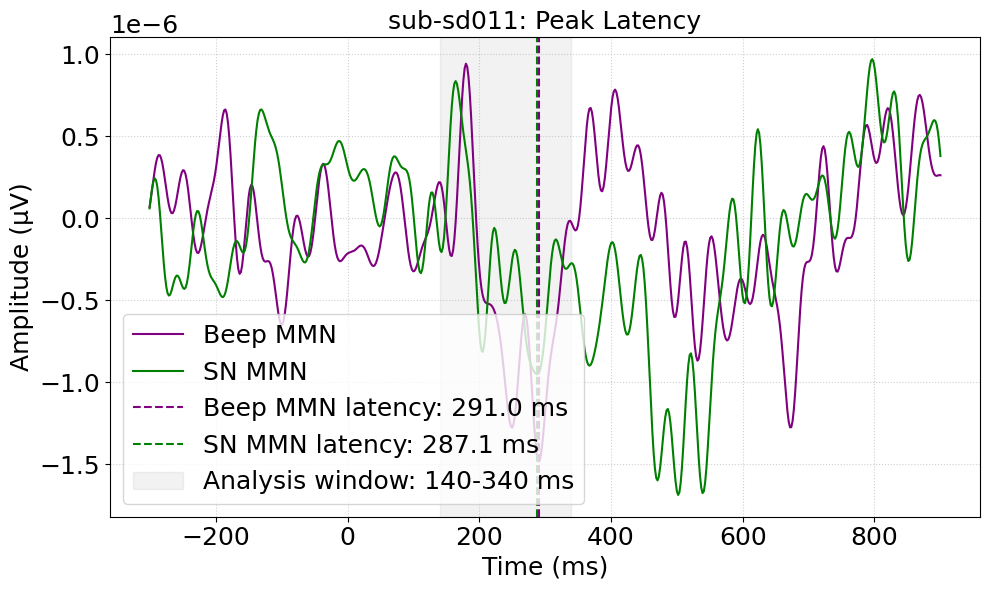

In [42]:
# Example: Plot single subject ERP with peak latency markers
subj_id = 'sub-sd011'
fig, ax = plot_subject_erp_with_latency(
    subj_id, 
    case1_dict=BN_MMN_evokeds_dict, 
    case2_dict=PN_MMN_evokeds_dict,
    time_window=(140, 340),  # Adjusted based on your shared images
    case1_label='Beep MMN', 
    case2_label='SN MMN',
    method='peak'
)
plt.show()



In [43]:
def plot_all_subjects_erps_with_latency(case1_dict, case2_dict, 
                                       time_window=(100, 300), channels=None,
                                       method='peak', fractional_area=0.50,
                                       case1_label='Beep MMN', case2_label='SN MMN',
                                       ncols=2, figsize=(15, 12)):
    """
    Plot ERPs with latency markers for all subjects.
    
    Parameters:
    -----------
    case1_dict, case2_dict : dict
        Dictionaries containing the evoked objects for each condition
    time_window : tuple
        Time window for latency detection (in ms)
    channels : list or None
        Channels to include in analysis
    method : str
        Latency detection method ('peak', 'fractional_area', 'onset')
    fractional_area : float
        Fraction value for fractional area method
    case1_label, case2_label : str
        Labels for the legend
    ncols : int
        Number of columns in the subplot grid
    figsize : tuple
        Figure dimensions
        
    Returns:
    --------
    fig : matplotlib figure object
    """
    # Get common subjects
    common_subjects = sorted(set(case1_dict.keys()) & set(case2_dict.keys()))
    
    # Calculate number of rows needed
    nrows = (len(common_subjects) + ncols - 1) // ncols
    
    # Create figure
    fig = plt.figure(figsize=figsize)
    
    # Extract latencies for all subjects at once
    case1_latencies, case2_latencies, subjects = extract_mmn_latencies(
        case1_dict, case2_dict, 
        time_window=time_window, 
        channels=channels,
        method=method, 
        fractional_area=fractional_area
    )
    
    # Create a plot for each subject
    for i, subject_id in enumerate(subjects):
        ax = fig.add_subplot(nrows, ncols, i+1)
        
        # Get the evoked data
        evoked1 = case1_dict[subject_id].copy()
        evoked2 = case2_dict[subject_id].copy()
        
        # Pick channels if specified
        if channels:
            evoked1 = evoked1.pick_channels(channels)
            evoked2 = evoked2.pick_channels(channels)
        
        # Get the data and time axis
        times = evoked1.times * 1000  # Convert to ms
        data1 = np.mean(evoked1.data, axis=0) if len(evoked1.data.shape) > 1 else evoked1.data
        data2 = np.mean(evoked2.data, axis=0) if len(evoked2.data.shape) > 1 else evoked2.data
        
        # Plot ERPs
        ax.plot(times, data1, color='purple', label=case1_label)
        ax.plot(times, data2, color='green', label=case2_label)
        
        # Mark latencies with vertical lines
        if not np.isnan(case1_latencies[i]):
            ax.axvline(x=case1_latencies[i], color='purple', linestyle='--')
        
        if not np.isnan(case2_latencies[i]):
            ax.axvline(x=case2_latencies[i], color='green', linestyle='--')
        
        # Highlight the analysis time window
        ax.axvspan(time_window[0], time_window[1], alpha=0.1, color='gray')
        
        # Format plot
        ax.set_xlabel('Time (ms)')
        ax.set_ylabel('μV')
        ax.set_title(f'{subject_id}', fontsize=10, pad=2)
        ax.grid(True, linestyle=':', alpha=0.5)
        
        # Add legend to first subplot only to avoid clutter
        if i == 0:
            ax.legend(loc='best')
    
    plt.tight_layout()
    fig.suptitle(f'{method.capitalize()} Latency Detection {time_window} ms', fontsize=16)
    plt.subplots_adjust(top=.96)
    
    return fig


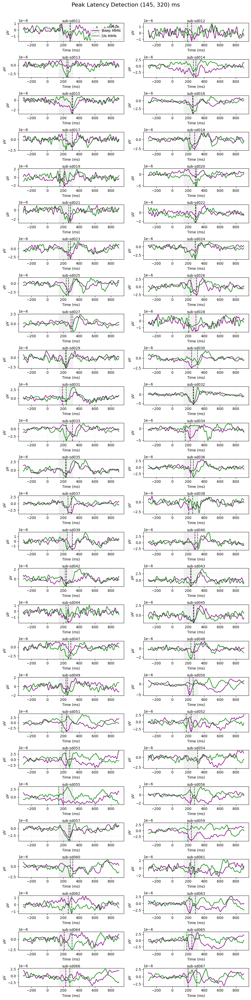

In [44]:
# Plot all subjects in a grid
plt.rcParams.update({
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'axes.labelsize': 10,
        'axes.titlesize': 10,
        'legend.fontsize': 10,
    })
fig = plot_all_subjects_erps_with_latency(
    case1_dict=BN_MMN_evokeds_dict, 
    case2_dict=PN_MMN_evokeds_dict,
    time_window=(145, 320),  # Adjusted based on your shared images where MMN is visible
    method='peak',
    case1_label='Beep MMN', 
    case2_label='SN MMN',
    ncols=2,
    figsize=(10, 40)
)

plt.show()


Statistical test results:
overall: t=0.712, p=0.479
channel_Fz: t=1.408, p=0.165
channel_Cz: t=0.385, p=0.702
channel_Pz: t=0.036, p=0.972
Statistical test results:
overall: t=3.027, p=0.004
channel_Fz: t=3.101, p=0.003
channel_Cz: t=2.978, p=0.004
channel_Pz: t=2.165, p=0.035


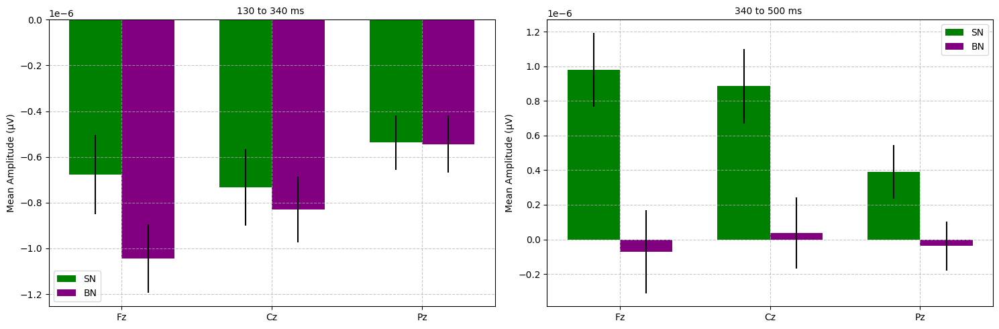

In [45]:
time_window = (130, 340)  # MMN typically 100-250ms
channels = [ 'Fz','Cz','Pz']  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=time_window, channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")

# Visualize
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[0],title= '130 to 340 ms ')

PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=(340,500), channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[1],title= '340 to 500 ms ')
plt.tight_layout()
plt.show()


# Epoch shift and analysis 

### Mismatch Negativity (MMN) ERP signal first deviates below baseline significantly

In [46]:
def visualize_threshold_points(subject_id, beep_mmn_dict, sn_mmn_dict, 
                              threshold_results, time_range=None):
    """
    Visualize the ERPs with marked threshold points.
    
    Parameters:
    -----------
    subject_id : str
        Subject ID to visualize
    beep_mmn_dict, sn_mmn_dict : dict
        Dictionaries with evoked objects
    threshold_results : dict
        Results from process_all_subjects
    time_range : tuple or None
        Optional time range (min, max) in seconds to display
    """
    # Get the evoked data
    beep_evoked = beep_mmn_dict[subject_id].pick(['Fz','Cz','FCz']).copy()
    sn_evoked = sn_mmn_dict[subject_id].pick(['Fz','Cz','FCz']).copy()
    
    # Get the threshold times
    beep_time = threshold_results[subject_id]['beep']['time']
    sn_time = threshold_results[subject_id]['sn']['time']
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 6))
    
    # Apply time range if specified
    if time_range:
        beep_evoked = beep_evoked.copy().crop(*time_range)
        sn_evoked = sn_evoked.copy().crop(*time_range)
    
    # Get times and data
    times = beep_evoked.times * 1000  # Convert to ms
    beep_data = np.mean(beep_evoked.data, axis=0) if len(beep_evoked.data.shape) > 1 else beep_evoked.data
    sn_data = np.mean(sn_evoked.data, axis=0) if len(sn_evoked.data.shape) > 1 else sn_evoked.data
    
    # Plot ERPs
    ax.plot(times, beep_data, 'purple', label='Beep MMN')
    ax.plot(times, sn_data, 'green', label='SN MMN')
    
    # Mark threshold points
    if beep_time is not None:
        beep_time_ms = beep_time * 1000  # Convert to ms
        ax.axvline(x=beep_time_ms, color='purple', linestyle='--',
                  label=f'Beep 95% threshold: {beep_time_ms:.1f} ms')
    
    if sn_time is not None:
        sn_time_ms = sn_time * 1000  # Convert to ms
        ax.axvline(x=sn_time_ms, color='green', linestyle='--',
                  label=f'SN 95% threshold: {sn_time_ms:.1f} ms')
    
    # Format plot
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Amplitude (μV)')
    ax.set_title(f'{subject_id}: 95% Amplitude Threshold')
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.legend(loc='best')
    
    plt.tight_layout()
    return fig, ax


{'sub-sd011': {'beep': {'time': 0.22265625}, 'sn': {'time': None}},
 'sub-sd012': {'beep': {'time': 0.150390625}, 'sn': {'time': None}},
 'sub-sd013': {'beep': {'time': 0.248046875}, 'sn': {'time': 0.19921875}},
 'sub-sd014': {'beep': {'time': 0.150390625}, 'sn': {'time': 0.248046875}},
 'sub-sd015': {'beep': {'time': 0.154296875}, 'sn': {'time': 0.267578125}},
 'sub-sd016': {'beep': {'time': 0.21484375}, 'sn': {'time': 0.150390625}},
 'sub-sd017': {'beep': {'time': 0.29296875}, 'sn': {'time': 0.19921875}},
 'sub-sd018': {'beep': {'time': 0.228515625}, 'sn': {'time': 0.19921875}},
 'sub-sd019': {'beep': {'time': 0.203125}, 'sn': {'time': 0.15234375}},
 'sub-sd020': {'beep': {'time': 0.267578125}, 'sn': {'time': 0.23046875}},
 'sub-sd021': {'beep': {'time': 0.20703125}, 'sn': {'time': 0.1953125}},
 'sub-sd022': {'beep': {'time': 0.166015625}, 'sn': {'time': 0.275390625}},
 'sub-sd023': {'beep': {'time': 0.251953125}, 'sn': {'time': None}},
 'sub-sd024': {'beep': {'time': 0.185546875}, '

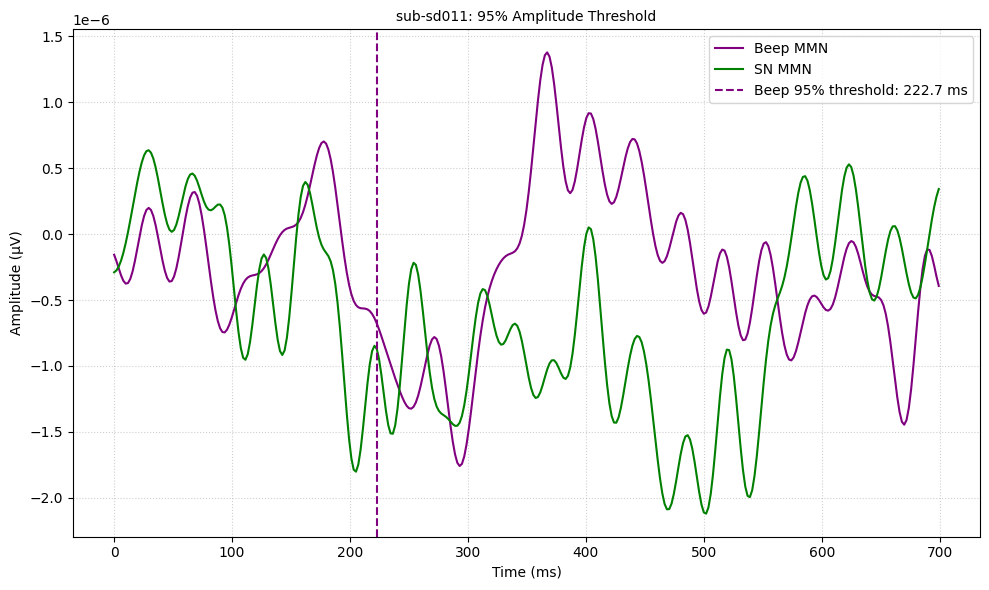

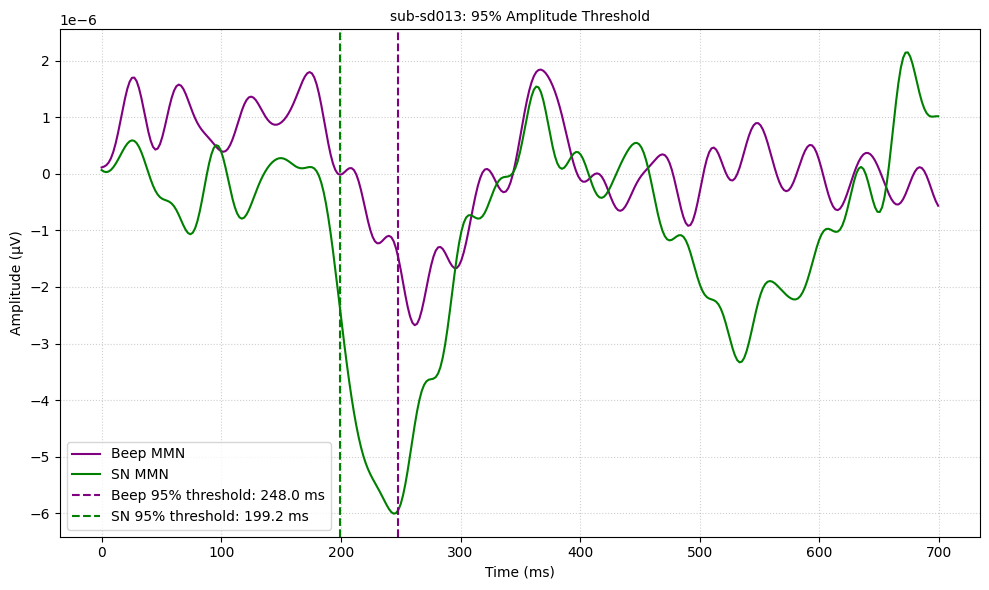

In [47]:
# Example usage
# First, process all subjects to find threshold timepoints
time_window=(150, 350)
from scipy.stats import ttest_ind,permutation_test
import numpy as np

def find_first_significant(evoked_dict, channel='Fz', baseline_interval=(-0.3, 0.12), test_interval=(0.12, 0.4), alpha=0.05):
    result = {}
    for subj_id, evoked in evoked_dict.items():
        times = evoked.times
        ch_idx = evoked.ch_names.index(channel)
        data = evoked.data[ch_idx]

        # Define baseline
        baseline_mask = (times >= baseline_interval[0]) & (times <= baseline_interval[1])
        baseline_data = data[baseline_mask]

        # Define test interval
        test_mask = (times >= test_interval[0]) & (times <= test_interval[1])
        test_times = times[test_mask]
        test_data = data[test_mask]

        # Test each time point
        sig_time = None
        for i, val in enumerate(test_data):
            t_stat, p_val = ttest_ind([val], baseline_data, alternative='less')
            if p_val < alpha:
                sig_time = test_times[i]
                break  
  
        result[subj_id] = sig_time
    return result

def find_first_significant_multi_channel(
    evoked_dict,
    channels=['Fz', 'Cz', 'FCz'],
    baseline_interval=(-0.3, 0.12),
    test_interval=(0.12, 0.4),
    alpha=0.05
):
    result = {}

    for subj_id, evoked in evoked_dict.items():
        times = evoked.times

        # Get indices for the desired channels
        try:
            ch_idxs = [evoked.ch_names.index(ch) for ch in channels]
        except ValueError as e:
            print(f"Channel missing in subject {subj_id}: {e}")
            result[subj_id] = None
            continue

        # Extract data: shape (n_channels, n_times) → average over channels
        data = evoked.data[ch_idxs, :].mean(axis=0)

        # Define baseline
        baseline_mask = (times >= baseline_interval[0]) & (times <= baseline_interval[1])
        baseline_data = data[baseline_mask]

        # Define test interval
        test_mask = (times >= test_interval[0]) & (times <= test_interval[1])
        test_times = times[test_mask]
        test_data = data[test_mask]

        # Test each time point
        sig_time = None
        for i, val in enumerate(test_data):
            t_stat, p_val = ttest_ind([val], baseline_data, alternative='less')
            if p_val < alpha:
                sig_time = test_times[i]
                break

        result[subj_id] = sig_time

    return result

sig_times_A = find_first_significant(BN_MMN_evokeds_dict, channel='Cz', baseline_interval=(-0.20, 0.100), test_interval=(0.150, 0.350),alpha=0.01)
sig_times_B = find_first_significant(PN_MMN_evokeds_dict, channel='Cz', baseline_interval=(-0.20, 0.100), test_interval=(0.150, 0.350),alpha=0.01)


# sig_times_A =find_first_significant_multi_channel(BN_MMN_evokeds_dict, channels=['Fz', 'Cz', 'FCz'], baseline_interval=(-0.20, 0.100), test_interval=(0.150, 0.350),alpha=0.01)
# sig_times_B = find_first_significant_multi_channel(PN_MMN_evokeds_dict, channels=['Fz', 'Cz', 'FCz'], baseline_interval=(-0.20, 0.100), test_interval=(0.150, 0.350),alpha=0.01)
# Combine into desired output format
combined_result = {}
for subj in sig_times_A.keys():
    combined_result[subj] = {
        'beep': {'time': sig_times_A[subj]},
        'sn': {'time': sig_times_B[subj]}
    }

# Example print
import pprint
pprint.pprint(combined_result)

# Visualize results for specific subjects
for subject_id in ['sub-sd011', 'sub-sd013']:
    fig, ax = visualize_threshold_points(
        subject_id,
        BN_MMN_evokeds_dict,
        PN_MMN_evokeds_dict,
        combined_result,
        time_range=(0.0, 0.7)  # 0-700 ms
    )
    plt.show()

# Create epochs around these threshold points
# NOTE: This requires raw data for each subject
# epochs_dict = create_epochs_around_threshold(raw_data, threshold_results)


First significant deviation at -0.301 s


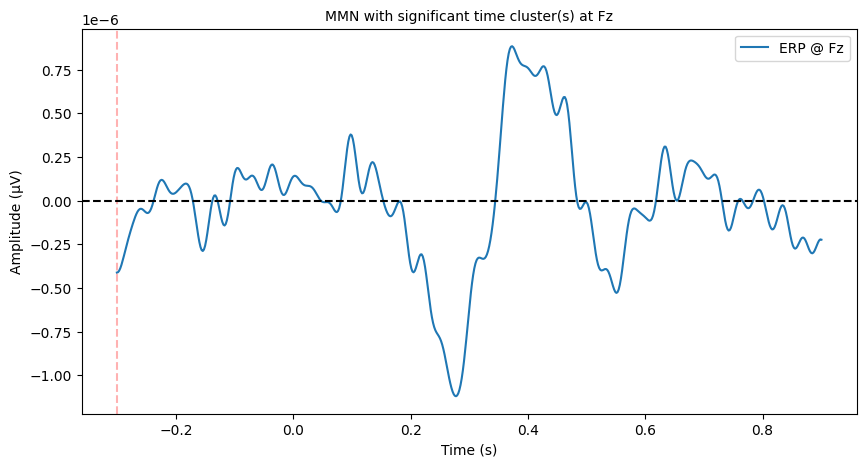

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from mne.stats import permutation_cluster_1samp_test

# --- Step 1: extract data ---
# Dict of subject_id -> Evoked
# Example: subject_evokeds = {'subj01': evoked1, 'subj02': evoked2, ...}
# Pick one channel for analysis (e.g., Fz)
channel = 'Fz'
evokeds = list(PN_MMN_evokeds_dict.values())
sfreq = evokeds[0].info['sfreq']
times = evokeds[0].times
ch_idx = evokeds[0].ch_names.index(channel)

# Extract data: shape (n_subjects, n_times)
data = np.array([evk.data[ch_idx] for evk in evokeds])

# --- Step 2: run cluster-based permutation test ---
T_obs, clusters, p_values, H0 = permutation_cluster_1samp_test(
    data, n_permutations=1000, threshold=None, tail=-1,
    out_type='mask', seed=42
)

# --- Step 3: interpret results ---
significant_clusters = [clu for clu, p in zip(clusters, p_values) if p < 0.05]

if significant_clusters:
    first_clu = significant_clusters[0]
    first_sig_idx = np.where(first_clu)[0][0]
    first_sig_time = times[first_sig_idx]
    print(f"First significant deviation at {first_sig_time:.3f} s")
else:
    print("No significant MMN cluster found.")

# --- Step 4: plot ---
plt.figure(figsize=(10, 5))
plt.plot(times, data.mean(axis=0), label=f'ERP @ {channel}')
for clu in significant_clusters:
    sig_time_idxs = np.where(clu)[0]
    for idx in sig_time_idxs:
        plt.axvline(times[idx], color='red', alpha=0.3, linestyle='--')

plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (µV)')
plt.title(f'MMN with significant time cluster(s) at {channel}')
plt.legend()
plt.show()



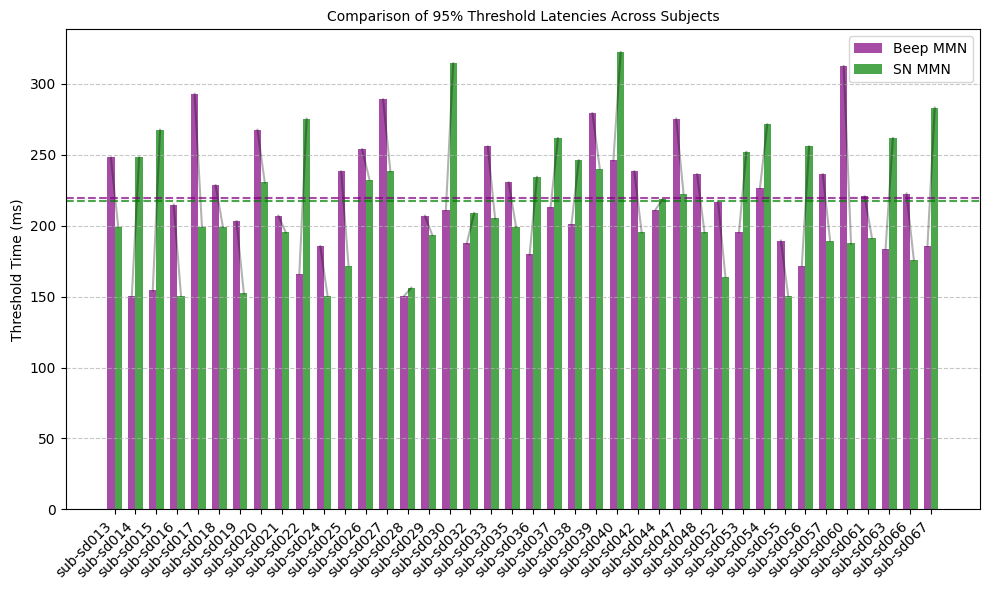

In [49]:
plt.rcParams.update({
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'axes.labelsize': 10,
        'axes.titlesize': 10,
        'legend.fontsize': 10,
    })
def plot_threshold_comparison(threshold_results, figsize=(10, 6)):
    """
    Create a summary plot comparing threshold times across subjects.
    
    Parameters:
    -----------
    threshold_results : dict
        Results from process_all_subjects function
    figsize : tuple
        Figure dimensions
    
    Returns:
    --------
    fig : matplotlib figure
    """
    subjects = []
    beep_times = []
    sn_times = []
    
    for subject_id, data in threshold_results.items():
        beep_time = data['beep']['time']
        sn_time = data['sn']['time']
        
        if beep_time is not None and sn_time is not None:
            subjects.append(subject_id)
            beep_times.append(beep_time * 1000)  # Convert to ms
            sn_times.append(sn_time * 1000)      # Convert to ms
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Plot paired points for each subject
    x = np.arange(len(subjects))
    width = 0.35
    
    ax.bar(x - width/2, beep_times, width, label='Beep MMN', color='purple', alpha=0.7)
    ax.bar(x + width/2, sn_times, width, label='SN MMN', color='green', alpha=0.7)
    
    # Connect paired points
    for i in range(len(subjects)):
        ax.plot([i - width/2, i + width/2], [beep_times[i], sn_times[i]], 'k-', alpha=0.3)
    
    # Add labels and formatting
    ax.set_ylabel('Threshold Time (ms)')
    ax.set_title('Comparison of 95% Threshold Latencies Across Subjects')
    ax.set_xticks(x)
    ax.set_xticklabels(subjects, rotation=45, ha='right')
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7, axis='y')
    
    # Calculate average for each condition
    avg_beep = np.mean(beep_times)
    avg_sn = np.mean(sn_times)
    
    # Add horizontal lines for averages
    ax.axhline(y=avg_beep, color='purple', linestyle='--', alpha=0.7, 
              label=f'Avg Beep: {avg_beep:.1f} ms')
    ax.axhline(y=avg_sn, color='green', linestyle='--', alpha=0.7,
              label=f'Avg SN: {avg_sn:.1f} ms')
    
    plt.tight_layout()
    return fig

plot_threshold_comparison(combined_result, figsize=(10, 6))
plt.show()

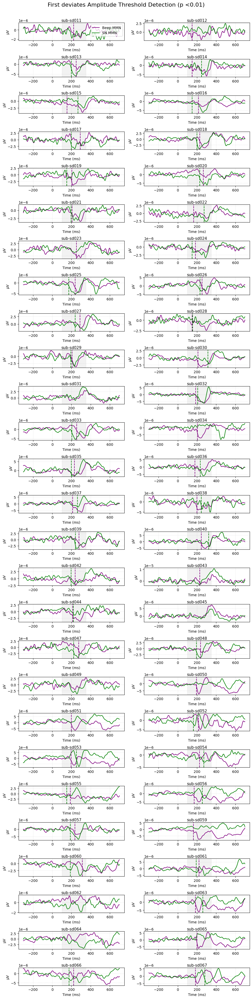

In [50]:
def plot_all_subjects_threshold_points(beep_mmn_dict, sn_mmn_dict, 
                                     threshold_results, percentile=95,
                                     time_window=(200, 500),
                                     time_range=(0, 700),
                                     ncols=2, figsize=(16, 12)):
    """
    Plot ERPs with threshold points for all subjects in a grid.
    
    Parameters:
    -----------
    beep_mmn_dict, sn_mmn_dict : dict
        Dictionaries with subject IDs as keys and evoked objects as values
    threshold_results : dict
        Results from process_all_subjects function
    percentile : int
        Percentile threshold used (for title and legend)
    time_window : tuple
        Time window in ms used for threshold detection
    time_range : tuple
        Time range in ms to display in the plots
    ncols : int
        Number of columns in the grid
    figsize : tuple
        Figure size
        
    Returns:
    --------
    fig : matplotlib figure object
    """
    # Get common subjects
    common_subjects = sorted(set(beep_mmn_dict.keys()) & set(sn_mmn_dict.keys()))
    
    # Calculate rows needed based on number of subjects and columns
    nrows = (len(common_subjects) + ncols - 1) // ncols
    
    # Create figure with extra spacing
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    if nrows == 1 and ncols == 1:
        axes = np.array([axes])
    axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    
    # For each subject
    for i, subject_id in enumerate(common_subjects):
        if i < len(axes): 
            ax = axes[i]
            
            # Get the evoked data for this subject
            beep_evoked = beep_mmn_dict[subject_id].copy()
            sn_evoked = sn_mmn_dict[subject_id].copy()
            
            # Convert time range to seconds for cropping
            tmin, tmax = time_range[0]/1000, time_range[1]/1000
            beep_evoked = beep_evoked.copy().pick(['Cz','Fz','FCz']).crop(tmin=tmin, tmax=tmax)
            sn_evoked = sn_evoked.copy().pick(['Cz','Fz','FCz']).crop(tmin=tmin, tmax=tmax)
            
            # Get times and data
            times = beep_evoked.times * 1000  # Convert to ms
            beep_data = np.mean(beep_evoked.data, axis=0) if len(beep_evoked.data.shape) > 1 else beep_evoked.data
            sn_data = np.mean(sn_evoked.data, axis=0) if len(sn_evoked.data.shape) > 1 else sn_evoked.data
            
            # Plot ERPs
            ax.plot(times, beep_data, 'purple', label='Beep MMN')
            ax.plot(times, sn_data, 'green', label='SN MMN')
            
            # Get threshold times for this subject if available
            if subject_id in threshold_results and threshold_results[subject_id]['beep']['time'] is not None:
                # Mark threshold points with vertical lines
                beep_time = threshold_results[subject_id]['beep']['time']
                sn_time = threshold_results[subject_id]['sn']['time']
                
                if beep_time is not None:
                    beep_time_ms = beep_time * 1000  # Convert to ms
                    ax.axvline(x=beep_time_ms, color='purple', linestyle='--')
                
                if sn_time is not None:
                    sn_time_ms = sn_time * 1000  # Convert to ms
                    ax.axvline(x=sn_time_ms, color='green', linestyle='--')
            
            # Highlight the analysis time window
            ax.axvspan(time_window[0], time_window[1], alpha=0.1, color='gray')
            
            # Format plot
            ax.set_xlabel('Time (ms)')
            ax.set_ylabel('μV')
            ax.set_title(f'{subject_id}', pad=3, fontsize=11)
            ax.grid(True, linestyle=':', alpha=0.5)
            
            # Add legend to first subplot only
            if i == 0:
                ax.legend(loc='best')
    
    # Hide any unused subplots
    for j in range(len(common_subjects), len(axes)):
        axes[j].set_visible(False)
    
    # Add overall title
    fig.suptitle(f'First deviates Amplitude Threshold Detection (p <0.01)', fontsize=16, y=0.98)
    
    # Apply improved spacing to avoid title overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.96)
    
    return fig

# Plot all subjects in a grid
plt.rcParams.update({
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'axes.labelsize': 10,
        'axes.titlesize': 10,
        'legend.fontsize': 10,
    })
# Then create the multi-subject plot
fig = plot_all_subjects_threshold_points(
    BN_MMN_evokeds_dict,
    PN_MMN_evokeds_dict,
    combined_result,
    percentile=95,
    time_window=(100, 350),
    time_range=(-300, 700),
    ncols=2,
    figsize=(10, 40)
)

plt.show()


In [51]:
sub_ls =[]
for sub in combined_result:
    if combined_result[sub]['beep']['time'] is None or combined_result[sub]['sn']['time'] is None:
        sub_ls.append(sub)
print(len(combined_result),sub_ls)
for sub in list(combined_result):
    if sub in sub_ls:
        del combined_result[sub]  
print(len(combined_result))

54 ['sub-sd011', 'sub-sd012', 'sub-sd023', 'sub-sd031', 'sub-sd034', 'sub-sd043', 'sub-sd045', 'sub-sd049', 'sub-sd050', 'sub-sd051', 'sub-sd059', 'sub-sd062', 'sub-sd064', 'sub-sd065']
40


In [52]:
combined_result

{'sub-sd013': {'beep': {'time': 0.248046875}, 'sn': {'time': 0.19921875}},
 'sub-sd014': {'beep': {'time': 0.150390625}, 'sn': {'time': 0.248046875}},
 'sub-sd015': {'beep': {'time': 0.154296875}, 'sn': {'time': 0.267578125}},
 'sub-sd016': {'beep': {'time': 0.21484375}, 'sn': {'time': 0.150390625}},
 'sub-sd017': {'beep': {'time': 0.29296875}, 'sn': {'time': 0.19921875}},
 'sub-sd018': {'beep': {'time': 0.228515625}, 'sn': {'time': 0.19921875}},
 'sub-sd019': {'beep': {'time': 0.203125}, 'sn': {'time': 0.15234375}},
 'sub-sd020': {'beep': {'time': 0.267578125}, 'sn': {'time': 0.23046875}},
 'sub-sd021': {'beep': {'time': 0.20703125}, 'sn': {'time': 0.1953125}},
 'sub-sd022': {'beep': {'time': 0.166015625}, 'sn': {'time': 0.275390625}},
 'sub-sd024': {'beep': {'time': 0.185546875}, 'sn': {'time': 0.150390625}},
 'sub-sd025': {'beep': {'time': 0.23828125}, 'sn': {'time': 0.171875}},
 'sub-sd026': {'beep': {'time': 0.25390625}, 'sn': {'time': 0.232421875}},
 'sub-sd027': {'beep': {'time'

#### Option 1: onset time as latency ;- Use the p<0.01 thresholds as the time of onset for SN and BN MMNs. Use the difference in the 

In [53]:

plt.rcParams.update({
        'xtick.labelsize': 18,
        'ytick.labelsize': 18,
        'axes.labelsize': 18,
        'axes.titlesize': 18,
        'legend.fontsize': 18,
    })

In [54]:
bn_onset_lat = np.array([[v["beep"]["time"]] for v in combined_result.values()])
sn_onset_lat = np.array([[v["sn"]["time"]] for v in combined_result.values()])

mean = np.mean(PN_amps_peak)
std = np.std(PN_amps_peak )

print(f"SN : {np.mean(sn_onset_lat*1000):.2f} ± {np.std(sn_onset_lat*1000 ):.2f}")
print(f"BN: {np.mean(bn_onset_lat*1000):.2f} ± {np.std(bn_onset_lat*1000 ):.2f}")


SN : 217.68 ± 44.05
BN: 219.58 ± 39.12


t_stat [-0.1927279] with , p_value [0.84817221]


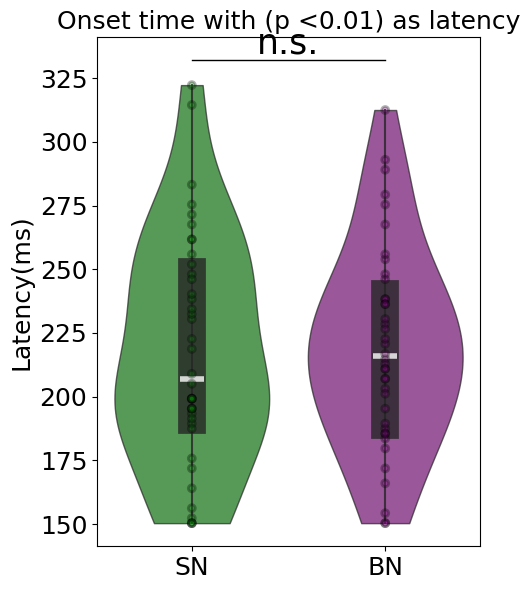

In [55]:


# Extract Latency
df_type = "Latency"
# Set up the plot
df = df_convert(sn_onset_lat,bn_onset_lat ,label=("SN", "BN"),df_type = df_type)

df[df_type] = df[df_type]*1000
fig, ax = plt.subplots(1,1 , figsize=(5,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],alpha = 0.7,
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.8),ax = ax ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax)

y_offset = 1.e-09
y_max = max(df[df_type]) *1.03
t_stat, p_value = stats.ttest_rel(sn_onset_lat , bn_onset_lat)
print(f't_stat {t_stat } with , p_value { p_value}')
ax.plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax.text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
plt.title(f"Onset time with (p <0.01) as latency", fontsize=18, )
plt.xlabel("")
plt.ylabel(df_type+"(ms)")
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

### Aligning the thresold at zero point and Grand ERP

In [56]:
from mne import EvokedArray
def align_and_standardize_evokeds(evoked_dict, threshold_results, condition_key):
    """
    Align evoked responses to threshold points and standardize time ranges.
    
    Parameters:
    -----------
    evoked_dict : dict
        Dictionary with subject IDs as keys and evoked objects as values
    threshold_results : dict
        Pre-calculated results from process_all_subjects
    condition_key : str
        Key to access condition-specific threshold times ('beep' or 'sn')
    tmin, tmax : float
        Standardized time range in seconds, relative to threshold point
        
    Returns:
    --------
    dict
        Dictionary with subject IDs as keys and standardized evoked objects
    """
    aligned_dict = {}
    
    # Use only subjects that exist in both dictionaries and have valid thresholds
    common_subjects = set(evoked_dict.keys()) & set(threshold_results.keys())
    
    valid_subjects = []
    
    for subject_id in common_subjects:
        # Get the pre-calculated threshold time
        threshold_time = threshold_results[subject_id][condition_key]['time']
        
        if threshold_time is not None:
            # Make a copy to avoid modifying the original
            evoked_copy = evoked_dict[subject_id].copy()
            
            # Shift time to center at the threshold point
            evoked_copy.shift_time(-threshold_time)
            
            
            # Store the aligned and cropped evoked object
            aligned_dict[subject_id] = evoked_copy
            valid_subjects.append(subject_id)
    
    print(f"Successfully aligned {len(valid_subjects)} subjects: {valid_subjects}")
    return aligned_dict


def update_evoked_times(aligned_dict, atol: float = 1e-8) :
    """
    Return a new list of EvokedArray objects where:
      - The time point closest to zero is set to 0.0,
      - Time points after it are recomputed using sampling rate,
      - Time points before it are unchanged.
    
    Parameters
    ----------
    evokeds : list of mne.Evoked
        List of Evoked objects to update.
    atol : float
        Tolerance to consider a time point effectively zero.

    Returns
    -------
    updated_evokeds : list of mne.EvokedArray
        List of EvokedArray objects with updated timing.
    """
    evoked_list = list(aligned_dict.values())
    updated_evokeds = []
    
    for evoked in evoked_list:
        times = evoked.times
        sfreq = evoked.info['sfreq']
        dt = 1.0 / sfreq

        zero_idx = np.argmin(np.abs(times))
        if not np.isclose(times[zero_idx], 0.0, atol=atol):
            print(f"Warning: Closest to zero is {times[zero_idx]:.6f}, not within atol={atol}")

        # Calculate new tmin such that time at zero_idx becomes 0
        new_tmin = -zero_idx * dt

        # Create new evoked with same data, info, and updated tmin
        new_evoked = EvokedArray(evoked.data, evoked.info, tmin=new_tmin, nave=evoked.nave,
                                 comment=evoked.comment, kind=evoked.kind)
        updated_evokeds.append(new_evoked)

    return updated_evokeds


In [57]:
combined_result

{'sub-sd013': {'beep': {'time': 0.248046875}, 'sn': {'time': 0.19921875}},
 'sub-sd014': {'beep': {'time': 0.150390625}, 'sn': {'time': 0.248046875}},
 'sub-sd015': {'beep': {'time': 0.154296875}, 'sn': {'time': 0.267578125}},
 'sub-sd016': {'beep': {'time': 0.21484375}, 'sn': {'time': 0.150390625}},
 'sub-sd017': {'beep': {'time': 0.29296875}, 'sn': {'time': 0.19921875}},
 'sub-sd018': {'beep': {'time': 0.228515625}, 'sn': {'time': 0.19921875}},
 'sub-sd019': {'beep': {'time': 0.203125}, 'sn': {'time': 0.15234375}},
 'sub-sd020': {'beep': {'time': 0.267578125}, 'sn': {'time': 0.23046875}},
 'sub-sd021': {'beep': {'time': 0.20703125}, 'sn': {'time': 0.1953125}},
 'sub-sd022': {'beep': {'time': 0.166015625}, 'sn': {'time': 0.275390625}},
 'sub-sd024': {'beep': {'time': 0.185546875}, 'sn': {'time': 0.150390625}},
 'sub-sd025': {'beep': {'time': 0.23828125}, 'sn': {'time': 0.171875}},
 'sub-sd026': {'beep': {'time': 0.25390625}, 'sn': {'time': 0.232421875}},
 'sub-sd027': {'beep': {'time'

#### Plot separate time for beep and SN first time above thresold 

In [58]:

# Step 1: Align evoked data to threshold times
beep_aligned = align_and_standardize_evokeds(
    BN_MMN_evokeds_dict, 
    combined_result, 
    condition_key='beep'
)

sn_aligned = align_and_standardize_evokeds(
    PN_MMN_evokeds_dict, 
    combined_result, 
    condition_key='sn'
)



# Visualize the results
time_range=(-.200,.350)
MMN_evokeds = {
           'PN': sn_aligned.values() ,
           'BN':beep_aligned.values()  ,
                      }

stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
plot_erps(MMN_evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="MMN (Separate time align, p<0.01)",time_range=(-.200,.350))
plt.tight_layout()
plt.show()


evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 

# Define time points
time_points = [-.08, -.020,.0,.020,.12,]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["BN"]).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average(evokeds_subset["PN"]).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'Beep', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'PN ', fontsize=18   , rotation=90, va='center')

fig.text(0.5, 0.00001, ' "MMN (Separate time align, p<0.01)" ', fontsize=18   )
plt.show()

Successfully aligned 40 subjects: ['sub-sd038', 'sub-sd037', 'sub-sd024', 'sub-sd029', 'sub-sd013', 'sub-sd020', 'sub-sd025', 'sub-sd022', 'sub-sd048', 'sub-sd026', 'sub-sd057', 'sub-sd055', 'sub-sd040', 'sub-sd044', 'sub-sd016', 'sub-sd066', 'sub-sd039', 'sub-sd028', 'sub-sd063', 'sub-sd030', 'sub-sd054', 'sub-sd060', 'sub-sd047', 'sub-sd027', 'sub-sd014', 'sub-sd019', 'sub-sd033', 'sub-sd018', 'sub-sd017', 'sub-sd067', 'sub-sd032', 'sub-sd021', 'sub-sd061', 'sub-sd035', 'sub-sd042', 'sub-sd036', 'sub-sd053', 'sub-sd015', 'sub-sd052', 'sub-sd056']
Successfully aligned 40 subjects: ['sub-sd038', 'sub-sd037', 'sub-sd024', 'sub-sd029', 'sub-sd013', 'sub-sd020', 'sub-sd025', 'sub-sd022', 'sub-sd048', 'sub-sd026', 'sub-sd057', 'sub-sd055', 'sub-sd040', 'sub-sd044', 'sub-sd016', 'sub-sd066', 'sub-sd039', 'sub-sd028', 'sub-sd063', 'sub-sd030', 'sub-sd054', 'sub-sd060', 'sub-sd047', 'sub-sd027', 'sub-sd014', 'sub-sd019', 'sub-sd033', 'sub-sd018', 'sub-sd017', 'sub-sd067', 'sub-sd032', 'sub-sd

ValueError: <Evoked | 'S15 - S24' (average, N=124.13793103448276), -0.19922 – 0.34961 s, baseline -0.300781 – 0 s (baseline period was cropped after baseline correction), 64 ch, ~220 kB> and <Evoked | 'S15 - S24' (average, N=123.36107986501686), -0.19922 – 0.34961 s, baseline -0.300781 – 0 s (baseline period was cropped after baseline correction), 3 ch, ~38 kB> do not contain the same channels.

In [ ]:
sn_aligned

{'sub-sd019': <Evoked | '10005 - 10007' (average, N=100.38979118329466), -0.45312 – 0.74805 s, baseline -0.300781 – 0 s, 64 ch, ~387 kB>,
 'sub-sd033': <Evoked | '10005 - 10007' (average, N=125.0), -0.45312 – 0.74805 s, baseline -0.300781 – 0 s, 64 ch, ~387 kB>,
 'sub-sd029': <Evoked | '10005 - 10007' (average, N=123.49888143176732), -0.42773 – 0.77344 s, baseline -0.300781 – 0 s, 64 ch, ~387 kB>,
 'sub-sd011': <Evoked | '10005 - 10007' (average, N=115.83990980834272), -0.50195 – 0.69922 s, baseline -0.300781 – 0 s, 64 ch, ~387 kB>,
 'sub-sd037': <Evoked | '10005 - 10007' (average, N=124.13885778275477), -0.56055 – 0.64062 s, baseline -0.300781 – 0 s, 64 ch, ~387 kB>,
 'sub-sd063': <Evoked | '10003 - 10005' (average, N=124.40273037542663), -0.58203 – 0.61914 s, baseline -0.300781 – 0 s, 64 ch, ~387 kB>,
 'sub-sd022': <Evoked | '10005 - 10007' (average, N=124.94432071269489), -0.57422 – 0.62695 s, baseline -0.300781 – 0 s, 64 ch, ~387 kB>,
 'sub-sd039': <Evoked | '10005 - 10007' (averag

##### Amplitude Statisical test

Statistical test results:
channel_Cz: t=-1.291, p=0.204


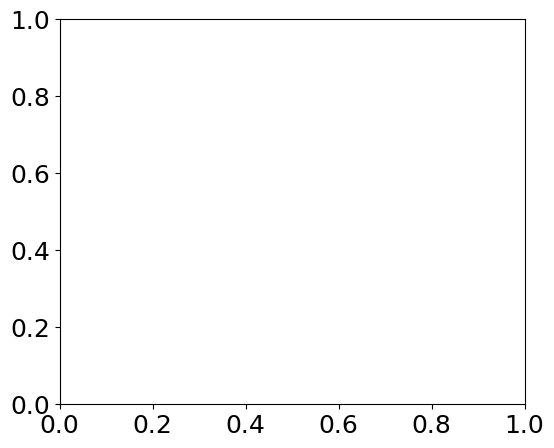

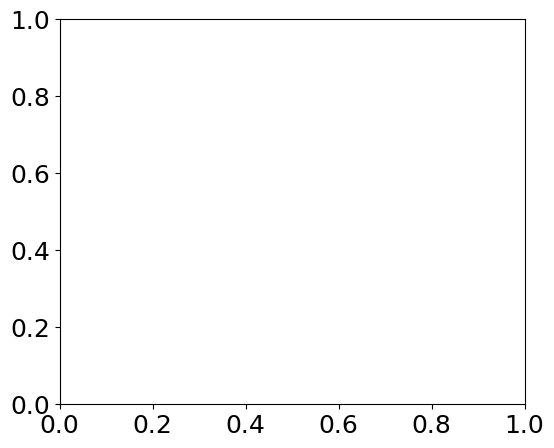

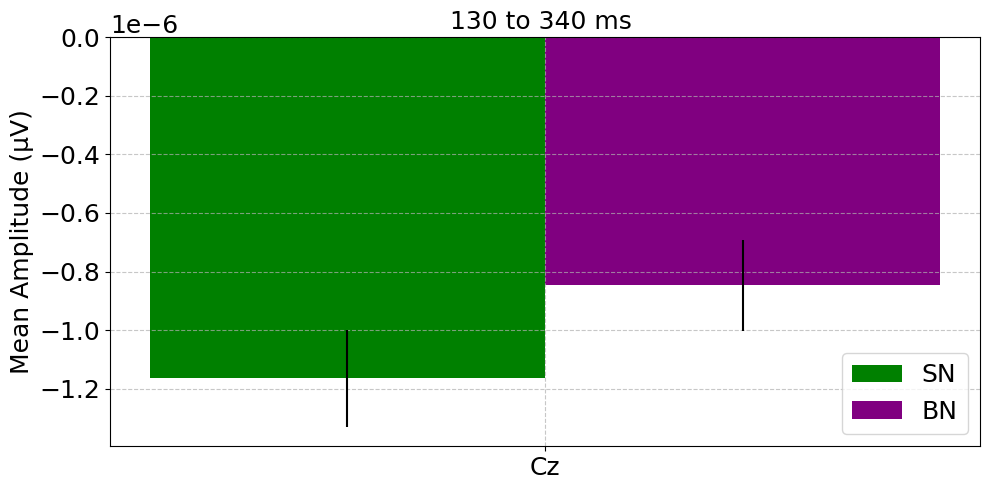

In [ ]:
time_window = (-60, 100)  # MMN typically 100-250ms
channels = picks  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    sn_aligned ,beep_aligned , time_window=time_window, channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")

# Visualize
fig, axs = plt.subplots(1, 1, figsize=(10, 5), dpi=100)
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs,title= '130 to 340 ms ')



plt.tight_layout()
plt.show()


t_stat [-1.29133233] with , p_value [0.20400126]


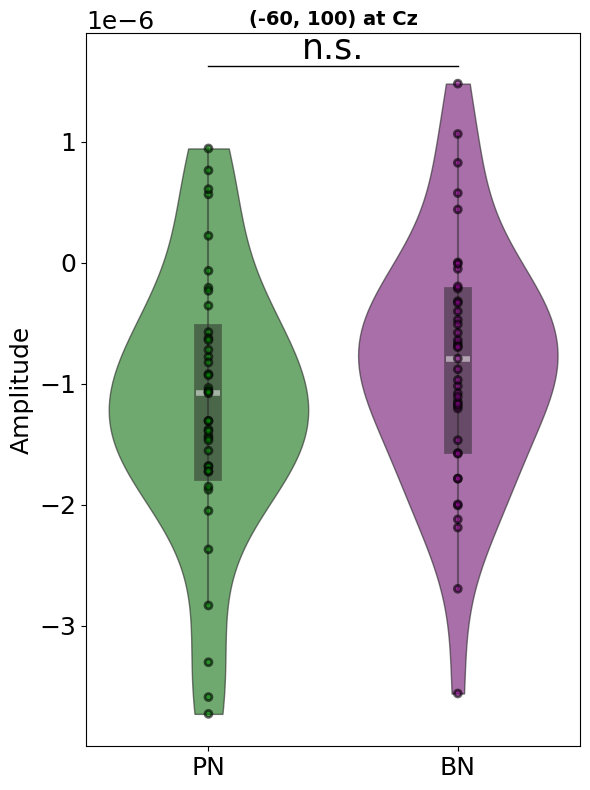

In [ ]:
# Extract Latency
df_type = "Amplitude"
# Set up the plot
channels = ['Cz']  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    sn_aligned ,beep_aligned , time_window=time_window, channels=channels
)
df = df_convert(PN_amps, BN_amps,label=("PN", "BN") ,df_type = df_type)


fig, ax = plt.subplots(1,1 , figsize=(6,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],alpha=0.6,
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.6, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax)

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(PN_amps, BN_amps)
print(f't_stat {t_stat } with , p_value { p_value}')
ax.plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax.text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
plt.title(f"{time_window} at {channels[0]}", fontsize=14, weight='bold')
plt.xlabel("")
plt.ylabel(df_type)
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()



 Mean  Amplitude : t_stat [-1.29133233] with , p_value [0.20400126]
 Peak Amplitude : t_stat -1.952670917467741 with , p_value 0.05788101899178149


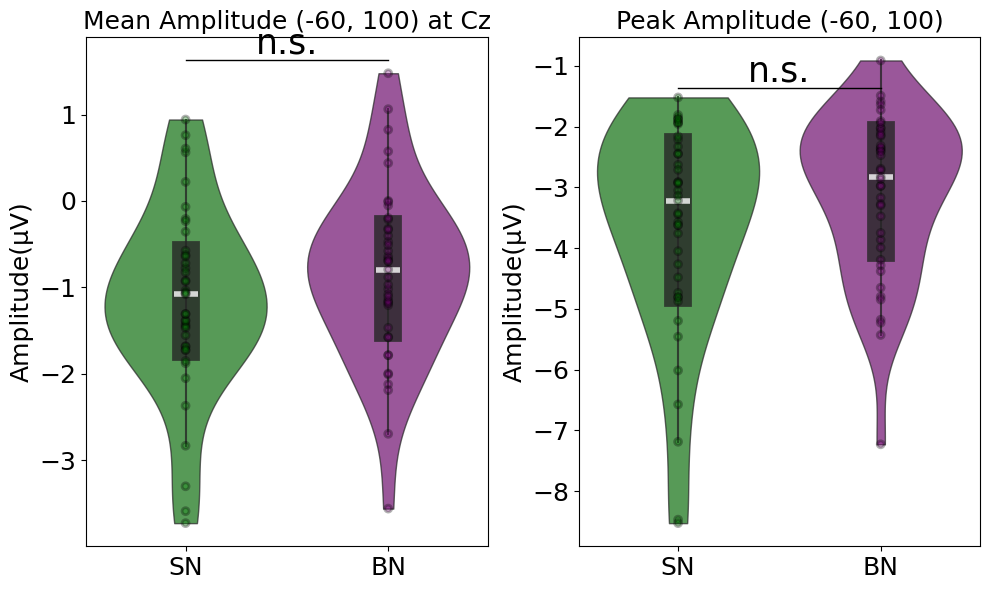

In [ ]:
df_type = "Amplitude"
label=("SN", "BN")
time_window = (-60,100)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels


# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    sn_aligned ,beep_aligned  , time_window=time_window, channels=channels
)



#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df = df_convert(PN_amps*1e+6, BN_amps*1e+6,label=("SN", "BN") ,df_type = df_type)
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],alpha = 0.7,
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.8),ax = ax[0] ,
               cut=0,)

sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(PN_amps, BN_amps)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])
PN_amps_peak = np.array(list(extract_peak_amplitude(sn_aligned ,time_window = (-.060, .10),channels=["Cz"]).values()))*1e+6
BN_amps_peak =np.array(list(extract_peak_amplitude(beep_aligned ,time_window = (-.060, .100),channels=["Cz"]).values()))*1e+6


# Fraction area plot 
df=df_convert(PN_amps_peak.reshape(-1, 1), BN_amps_peak.reshape(-1, 1),label=("SN", "BN") ,df_type = df_type)

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],alpha = 0.7,
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.8),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_rel(PN_amps_peak, BN_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

In [ ]:
BN_amps_peak
mean = np.mean(PN_amps_peak)
std = np.std(PN_amps_peak )

print(f"PN_amps_peak : {np.mean(PN_amps_peak):.2f} ± {np.std(PN_amps_peak ):.2f}")
print(f"BN_amps_peak : {np.mean(BN_amps_peak):.2f} ± {np.std(BN_amps_peak ):.2f}")
PN_amps
print(f"PN_amps_mean : {np.mean(PN_amps*1e+6):.5f} ± {np.std(PN_amps*1e+6 ):.5f}")
print(f"BN_amps_mean : {np.mean(BN_amps*1e+6):.5f} ± {np.std(BN_amps*1e+6 ):.5f}")

PN_amps_peak : -3.68 ± 1.75
BN_amps_peak : -3.12 ± 1.32
PN_amps_mean : -1.16483 ± 1.06077
BN_amps_mean : -0.84741 ± 0.99153


In [ ]:
#### Plot ERP   SN first time above thresold 

#### Plot ERP   SN-aligned MMNs; first time below thresold 

In [ ]:
# Step 1: Align evoked data to threshold times
sn_aligned_beep = align_and_standardize_evokeds(
    BN_MMN_evokeds_dict, 
    combined_result, 
    condition_key='sn'
)

sn_aligned_sn = align_and_standardize_evokeds(
    PN_MMN_evokeds_dict, 
    combined_result, 
    condition_key='sn'
)


#  Visualize the results
# Define BN vs PN ERPs comparison
MMN_evokeds = {
            'PN': sn_aligned_sn.values() ,
           'BN':sn_aligned_beep.values()  ,
                      }
stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
plot_erps(MMN_evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="MMN (SN time align, p<0.01)",time_range=(-.200,.350))
plt.tight_layout()
plt.show()



evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 

# Define time points
time_points = [-.08, -.020,.020,.100,.180]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["BN"]).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average(evokeds_subset["PN"]).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'Beep', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'PN ', fontsize=18   , rotation=90, va='center')

fig.text(0.5, 0.00001, 'MMN (SN time align, p<0.01)', fontsize=18   )
plt.show()

Successfully aligned 41 subjects: ['sub-sd019', 'sub-sd033', 'sub-sd029', 'sub-sd011', 'sub-sd037', 'sub-sd063', 'sub-sd022', 'sub-sd039', 'sub-sd035', 'sub-sd028', 'sub-sd066', 'sub-sd048', 'sub-sd057', 'sub-sd026', 'sub-sd061', 'sub-sd062', 'sub-sd067', 'sub-sd045', 'sub-sd055', 'sub-sd016', 'sub-sd017', 'sub-sd052', 'sub-sd025', 'sub-sd030', 'sub-sd060', 'sub-sd047', 'sub-sd032', 'sub-sd027', 'sub-sd040', 'sub-sd038', 'sub-sd020', 'sub-sd018', 'sub-sd015', 'sub-sd036', 'sub-sd024', 'sub-sd021', 'sub-sd054', 'sub-sd042', 'sub-sd053', 'sub-sd056', 'sub-sd013']
Successfully aligned 41 subjects: ['sub-sd019', 'sub-sd033', 'sub-sd029', 'sub-sd011', 'sub-sd037', 'sub-sd063', 'sub-sd022', 'sub-sd039', 'sub-sd035', 'sub-sd028', 'sub-sd066', 'sub-sd048', 'sub-sd057', 'sub-sd026', 'sub-sd061', 'sub-sd062', 'sub-sd067', 'sub-sd045', 'sub-sd055', 'sub-sd016', 'sub-sd017', 'sub-sd052', 'sub-sd025', 'sub-sd030', 'sub-sd060', 'sub-sd047', 'sub-sd032', 'sub-sd027', 'sub-sd040', 'sub-sd038', 'sub-sd

ValueError: <Evoked | '10005 - 10007' (average, N=100.38979118329466), -0.19922 – 0.34961 s, baseline -0.300781 – 0 s (baseline period was cropped after baseline correction), 64 ch, ~220 kB> and <Evoked | '10005 - 10007' (average, N=115.83990980834272), -0.19922 – 0.34961 s, baseline -0.300781 – 0 s (baseline period was cropped after baseline correction), 3 ch, ~38 kB> do not contain the same channels.

In [ ]:
len(sn_aligned)

41

##### Amplitude Satisical test

Statistical test results:
overall: t=-0.899, p=0.374
channel_Fz: t=-0.273, p=0.786
channel_Cz: t=-1.715, p=0.094
channel_FCz: t=-0.668, p=0.508


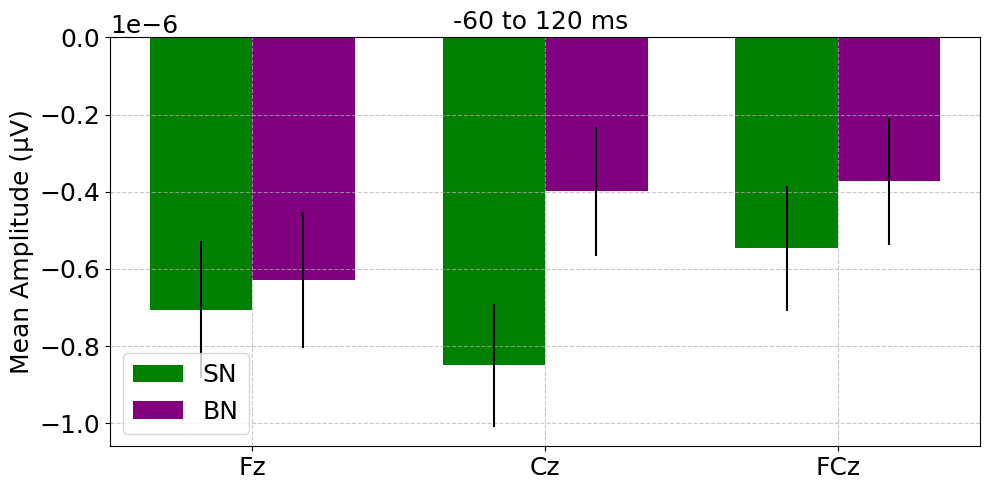

In [ ]:
time_window = (-60, 120)  # MMN typically 100-250ms
channels = picks  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    sn_aligned_sn,sn_aligned_beep , time_window=time_window, channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")

# Visualize
fig, axs = plt.subplots(1, 1, figsize=(10, 5), dpi=100)
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs,title= f'{time_window[0]} to {time_window[1]} ms ')



plt.tight_layout()
plt.show()

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8860\2212644223.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["PN", "BN"])


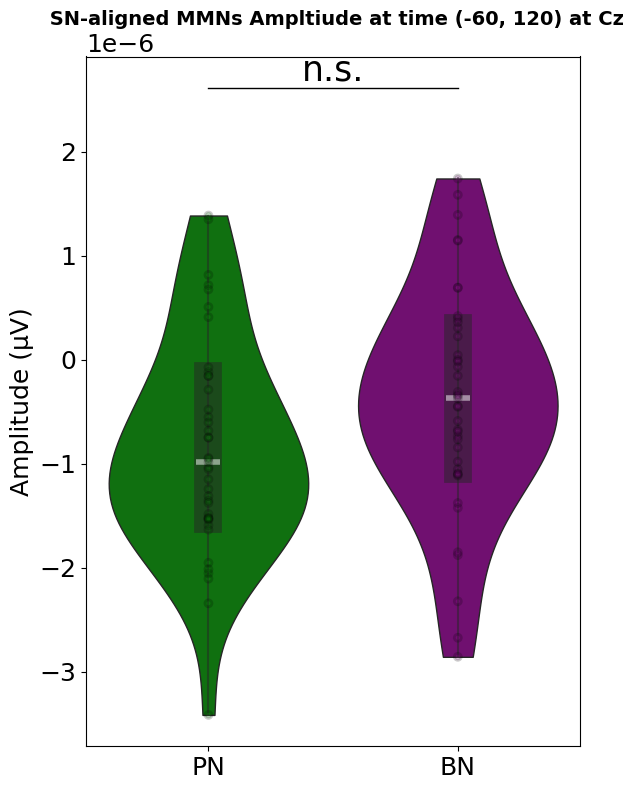

In [ ]:
time_window = (-60, 120)  # MMN typically 100-250ms
channels = ["Cz"]  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    sn_aligned_sn,sn_aligned_beep, time_window=time_window, channels=channels)
# Set up the plot
df = df_convert(PN_amps, BN_amps,label=("PN", "BN"))
fig, ax = plt.subplots(1,1 , figsize=(6,8), )
sns.violinplot(data=df, y="Amplitude", x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y="Amplitude", x="Case",hue="Case", size=5, jitter=False, alpha=0.2, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax)
ax.set_xticklabels(["PN", "BN"])
y_offset = 1.e-09
y_max = max(df['Amplitude']) *1.5
p_value = results['channel_Cz']['p_value']
ax.plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax.text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
plt.title(f" SN-aligned MMNs Ampltiude at time {time_window} at {channels[0]}", fontsize=14, weight='bold')
plt.xlabel("")
plt.ylabel("Amplitude (µV)")

plt.tight_layout()
plt.show()


##### Latency Satiiscal test

Peak Latency Results:
PN: 61.4 ± 47.7 ms
BN: 66.4 ± 64.0 ms
t(40) = -0.585, p = 0.562

Fractional Area Latency Results:
SN: 49.2 ± 34.2 ms
BN: 69.4 ± 46.2 ms
t(40) = -3.427, p = 0.001


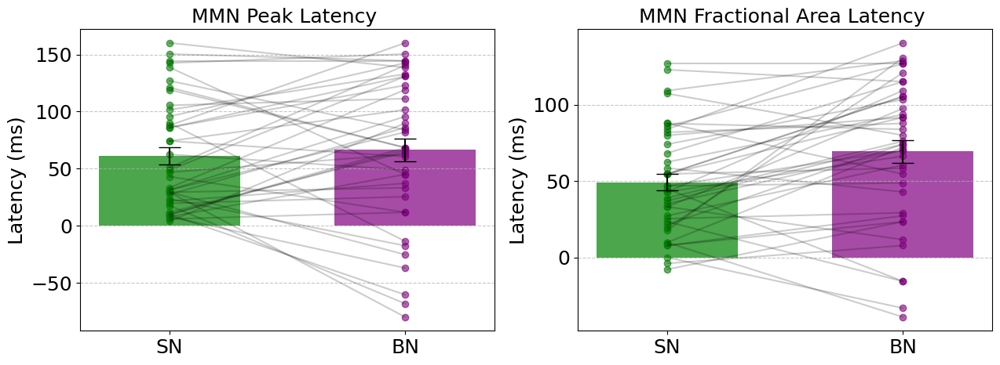

In [ ]:
# Define parameters based on MMN literature
time_window = (-80, 160)  # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

# 1. Peak latency analysis
peak_lat1, peak_lat2, subjects = extract_mmn_latencies(
    sn_aligned_sn,sn_aligned_beep, time_window=time_window, 
    channels=channels, method='peak')
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
peak_results = run_latency_statistical_tests(peak_lat1, peak_lat2)
print("Peak Latency Results:") 
print(f"PN: {peak_results['mean_latency_case1']:.1f} ± {peak_results['std_latency_case1']:.1f} ms")
print(f"BN: {peak_results['mean_latency_case2']:.1f} ± {peak_results['std_latency_case2']:.1f} ms")
print(f"t({peak_results['n_valid']-1}) = {peak_results['t_stat']:.3f}, p = {peak_results['p_value']:.3f}")

# Visualize
peak_fig = visualize_latency_results(peak_lat1, peak_lat2, subjects, "Peak",ax = axs[0],color=["green",'purple'],label=["SN",'BN'])


# 2. Fractional area latency analysis (50%) - more robust to noise
area_lat1, area_lat2, subjects = extract_mmn_latencies(
    sn_aligned_sn,sn_aligned_beep, time_window=time_window, 
    channels=channels, method='fractional_area', fractional_area=0.5)

area_results = run_latency_statistical_tests(area_lat1, area_lat2)
print("\nFractional Area Latency Results:")
print(f"SN: {area_results['mean_latency_case1']:.1f} ± {area_results['std_latency_case1']:.1f} ms")
print(f"BN: {area_results['mean_latency_case2']:.1f} ± {area_results['std_latency_case2']:.1f} ms")
print(f"t({area_results['n_valid']-1}) = {area_results['t_stat']:.3f}, p = {area_results['p_value']:.3f}")

# Visualize
area_fig = visualize_latency_results(area_lat1, area_lat2, subjects, "Fractional Area",ax = axs[1],color=["green",'purple'],label=["SN",'BN'])
plt.show()

In [ ]:
peak_lat1

array([  3.90625 ,  46.875   ,  62.5     , 150.390625,  33.203125,
        27.34375 ,  11.71875 ,  74.21875 ,  74.21875 ,  19.53125 ,
       138.671875,  95.703125,  31.25    ,  42.96875 ,  50.78125 ,
       105.46875 ,  17.578125, 144.53125 ,  87.890625,  29.296875,
       119.140625,   7.8125  , 126.953125,   9.765625,   7.8125  ,
        21.484375,   5.859375, 101.5625  ,  85.9375  ,  31.25    ,
        23.4375  , 160.15625 ,   9.765625,  29.296875, 142.578125,
        89.84375 , 121.09375 ,  48.828125,   9.765625,  85.9375  ,
        29.296875])

In [ ]:
sn_peak_lat = np.array([[peak] for peak in peak_lat1])
bn_peak_lat = np.array([[peak] for peak in peak_lat2])
sn_area_lat = np.array([[area] for area in area_lat1])
bn_area_lat = np.array([[area] for area in area_lat2])

t_stat -1.0303117234869088 with , p_value 0.0014243393493008935


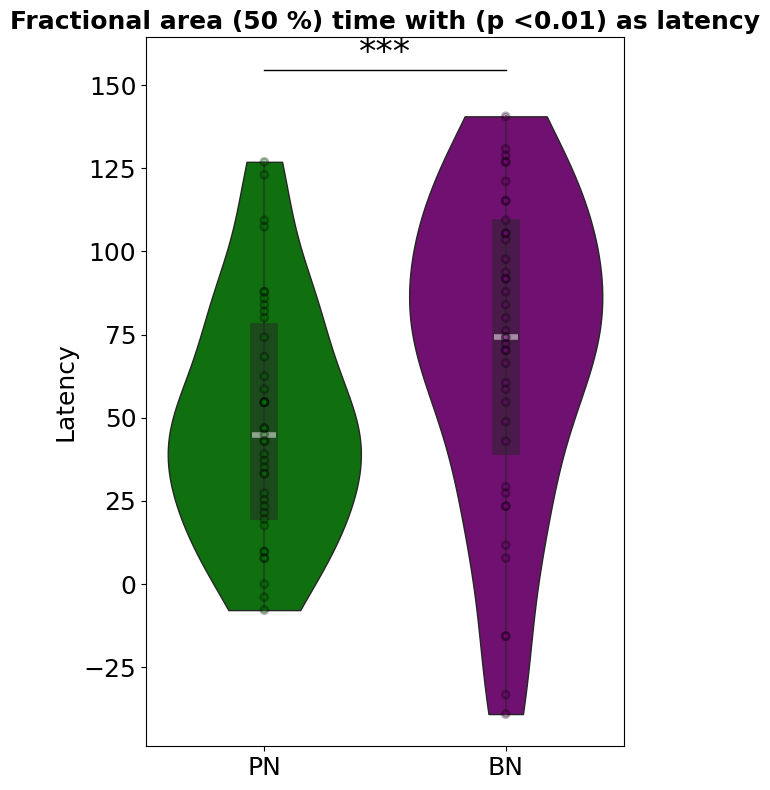

t_stat -1.0303117234869088 with , p_value 0.5619096282870362


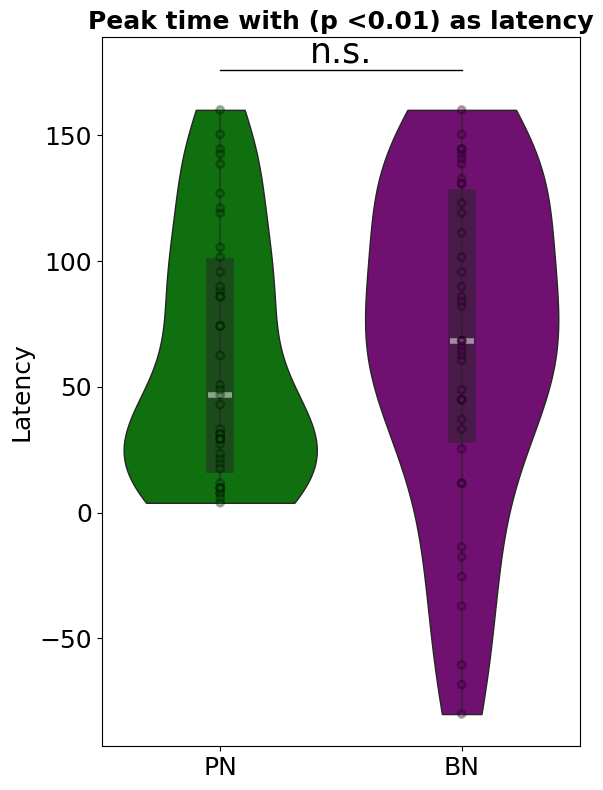

In [ ]:
df_type = "Latency"
# Set up the plot
df = df_convert(sn_area_lat,bn_area_lat ,label=("PN", "BN"),df_type = df_type)

df[df_type] = df[df_type]
fig, ax = plt.subplots(1,1 , figsize=(6,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax)

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
p_value = area_results['p_value']
print(f't_stat {t_stat } with , p_value { p_value}')
ax.plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax.text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
plt.title(f"Fractional area (50 %) time with (p <0.01) as latency", fontsize=18, weight='bold')
plt.xlabel("")
plt.ylabel(df_type)
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()
# Extract Latency
df_type = "Latency"
# Set up the plot
df = df_convert(sn_peak_lat,bn_peak_lat ,label=("PN", "BN"),df_type = df_type)

df[df_type] = df[df_type]
fig, ax = plt.subplots(1,1 , figsize=(6,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax)

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
p_value = peak_results['p_value']
print(f't_stat {t_stat } with , p_value { p_value}')
ax.plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax.text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
plt.title(f"Peak time with (p <0.01) as latency", fontsize=18, weight='bold')
plt.xlabel("")
plt.ylabel(df_type)
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

Peak latency ;- t_stat [-0.58488556] with , p_value [0.56190963]
Fractional area (50 %) latency ;- t_stat -3.4273328513646852 with , p_value 0.0014243393493008935


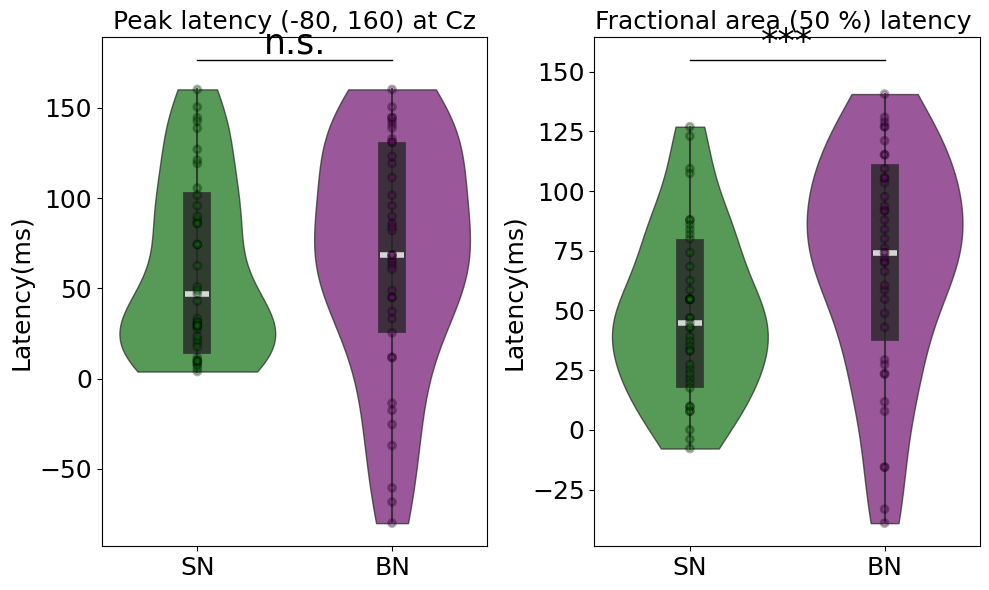

In [ ]:
# Extract Latency
df_type = "Latency"
label=("SN", "BN")

channels =["Cz"]
# Set up the plot
df = df_convert(sn_peak_lat,bn_peak_lat ,label=("SN", "BN"),df_type = df_type)


df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],alpha = 0.7,
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.8),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel(peak_lat1.reshape(-1,1), peak_lat2.reshape(-1,1))
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df = df_convert(sn_area_lat,bn_area_lat ,label=("SN", "BN"),df_type = df_type)
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=["green",'purple'],alpha = 0.7,
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.8),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=["green",'purple'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_rel( area_lat1[~np.isnan(area_lat1)], area_lat2[~np.isnan(area_lat2)])
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (50 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8860\3526742165.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["PN", "BN"])


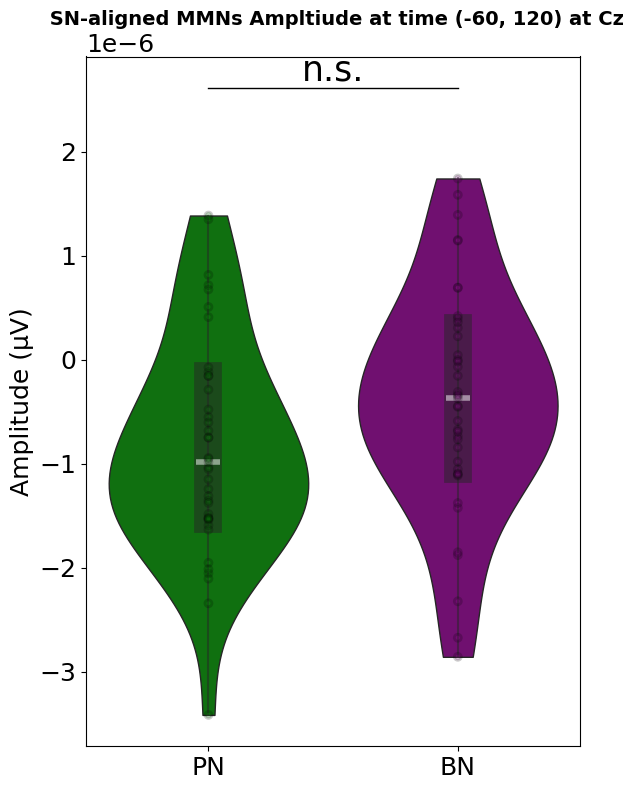

In [ ]:
time_window = (-60, 120)  # MMN typically 100-250ms
channels = ["Cz"]  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    sn_aligned_sn,sn_aligned_beep , time_window=time_window, channels=channels)
# Set up the plot
df = df_convert(PN_amps, BN_amps,label=("PN", "BN"))
fig, ax = plt.subplots(1,1 , figsize=(6,8), )
sns.violinplot(data=df, y="Amplitude", x="Case",hue="Case", inner='box', linewidth=1, palette=["green", "purple"],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y="Amplitude", x="Case",hue="Case", size=5, jitter=False, alpha=0.2, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax)
ax.set_xticklabels(["PN", "BN"])
y_offset = 1.e-09
y_max = max(df['Amplitude']) *1.5
p_value = results['channel_Cz']['p_value']
ax.plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax.text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
plt.title(f" SN-aligned MMNs Ampltiude at time {time_window} at {channels[0]}", fontsize=14, weight='bold')
plt.xlabel("")
plt.ylabel("Amplitude (µV)")

plt.tight_layout()
plt.show()


#### Plot ERP   Beep first time above thresold 

Successfully aligned 41 subjects: ['sub-sd019', 'sub-sd033', 'sub-sd029', 'sub-sd011', 'sub-sd037', 'sub-sd063', 'sub-sd022', 'sub-sd039', 'sub-sd035', 'sub-sd028', 'sub-sd066', 'sub-sd048', 'sub-sd057', 'sub-sd026', 'sub-sd061', 'sub-sd062', 'sub-sd067', 'sub-sd045', 'sub-sd055', 'sub-sd016', 'sub-sd017', 'sub-sd052', 'sub-sd025', 'sub-sd030', 'sub-sd060', 'sub-sd047', 'sub-sd032', 'sub-sd027', 'sub-sd040', 'sub-sd038', 'sub-sd020', 'sub-sd018', 'sub-sd015', 'sub-sd036', 'sub-sd024', 'sub-sd021', 'sub-sd054', 'sub-sd042', 'sub-sd053', 'sub-sd056', 'sub-sd013']
Successfully aligned 41 subjects: ['sub-sd019', 'sub-sd033', 'sub-sd029', 'sub-sd011', 'sub-sd037', 'sub-sd063', 'sub-sd022', 'sub-sd039', 'sub-sd035', 'sub-sd028', 'sub-sd066', 'sub-sd048', 'sub-sd057', 'sub-sd026', 'sub-sd061', 'sub-sd062', 'sub-sd067', 'sub-sd045', 'sub-sd055', 'sub-sd016', 'sub-sd017', 'sub-sd052', 'sub-sd025', 'sub-sd030', 'sub-sd060', 'sub-sd047', 'sub-sd032', 'sub-sd027', 'sub-sd040', 'sub-sd038', 'sub-sd

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8860\872330679.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


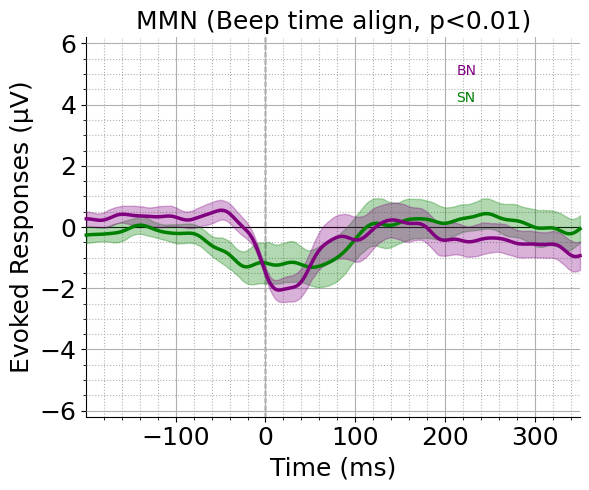

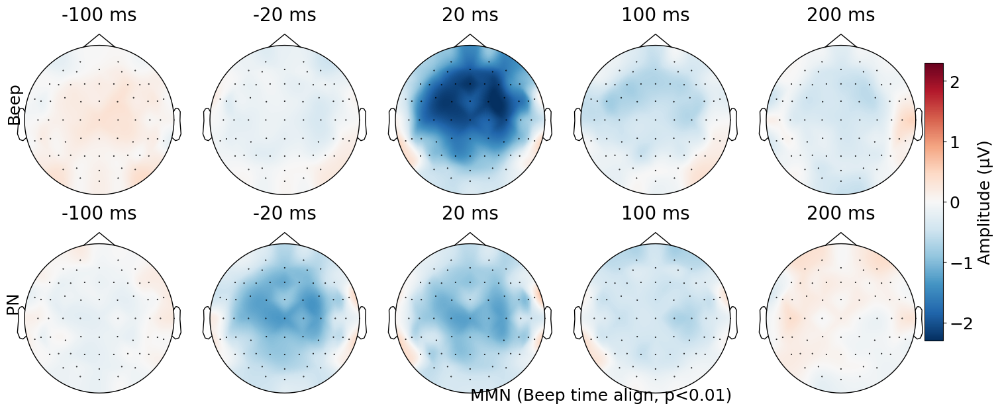

In [ ]:

# Step 1: Align evoked data to threshold times
beep_aligned = align_and_standardize_evokeds(
    BN_MMN_evokeds_dict, 
    combined_result, 
    condition_key='beep'
)

sn_aligned = align_and_standardize_evokeds(
    PN_MMN_evokeds_dict, 
    combined_result, 
    condition_key='beep'
)




# Step 3: Visualize the results
# Define BN vs PN ERPs comparison
MMN_evokeds = {
            'PN': sn_aligned.values() ,
           'BN':beep_aligned.values()  ,
                      }
stylesdict ={"BN": {"linewidth": 2.5,"linestyle":'solid','color': 'purple'},
             'PN': {"linewidth": 2.5,"linestyle":'solid','color': 'green'},
             }
text_labels = [
    (0.90, "BN",'purple'),
    (0.83, f"SN",'green'),
] 
plot_erps(MMN_evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="MMN (Beep time align, p<0.01)",time_range=(-.200,.350))
plt.tight_layout()
plt.show()

evokeds_subset = {}
for cond in MMN_evokeds:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in MMN_evokeds[cond]]
        evokeds_subset[cond]  =evoked_crop 

# Define time points
time_points = [-.1, -.020,.020,.100,.20]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset["BN"]).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average(evokeds_subset["PN"]).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'Beep', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'PN ', fontsize=18   , rotation=90, va='center')

fig.text(0.5, 0.00001, 'MMN (Beep time align, p<0.01)', fontsize=18   )
plt.show()

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8860\1054890265.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, y="Amplitude", x="Case", inner='box', linewidth=1, palette=["green", "purple"],
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8860\1054890265.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=df, y="Amplitude", x="Case", size=5, jitter=False, alpha=0.2, linewidth=2,
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_8860\1054890265.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["PN", "BN"])


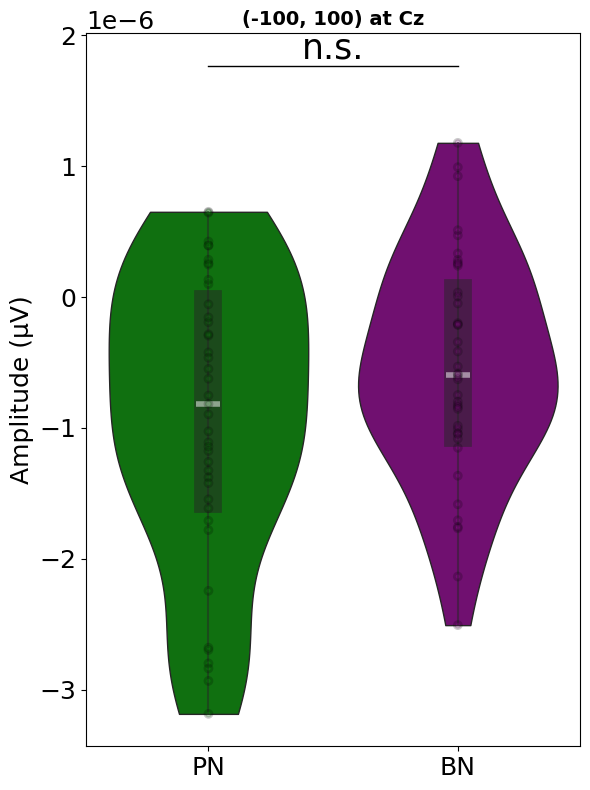

In [ ]:
time_window = (-100, 100)  # MMN typically 100-250ms
channels = ["Cz"]  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    sn_aligned ,beep_aligned , time_window=time_window, channels=channels)
# Set up the plot
df = df_convert(PN_amps, BN_amps,label=("PN", "BN"))
fig, ax = plt.subplots(1,1 , figsize=(6,8), )
sns.violinplot(data=df, y="Amplitude", x="Case", inner='box', linewidth=1, palette=["green", "purple"],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y="Amplitude", x="Case", size=5, jitter=False, alpha=0.2, linewidth=2,
              palette=["green", "purple"], edgecolor='black',dodge=False,ax= ax)
ax.set_xticklabels(["PN", "BN"])
y_offset = 1.e-09
y_max = max(df['Amplitude']) *1.5
p_value = results['channel_Cz']['p_value']
ax.plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax.text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
plt.title(f"{time_window} at {channels[0]}", fontsize=14, weight='bold')
plt.xlabel("")
plt.ylabel("Amplitude (µV)")

plt.tight_layout()
plt.show()


Statistical test results:
overall: t=-1.094, p=0.281
channel_Fz: t=-0.589, p=0.559
channel_Cz: t=-1.742, p=0.089
channel_FCz: t=-0.768, p=0.447
Statistical test results:
overall: t=2.415, p=0.019
channel_Fz: t=2.545, p=0.014
channel_Cz: t=2.240, p=0.029
channel_FCz: t=2.315, p=0.025


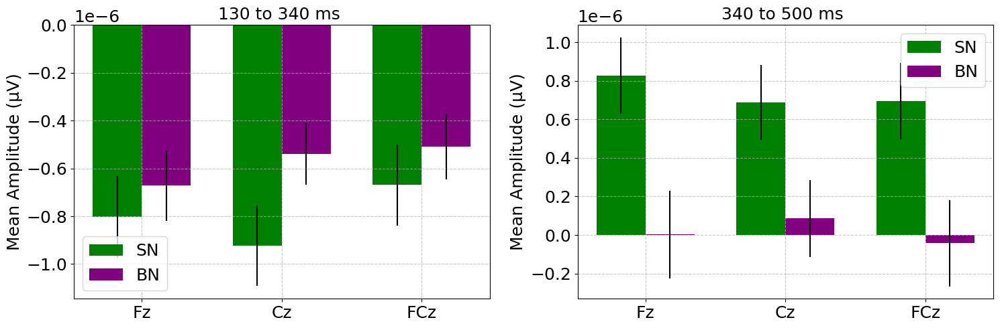

In [ ]:
time_window = (-100, 100)  # MMN typically 100-250ms
channels = picks  # Common MMN channels

# Extract amplitudes
PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    sn_aligned ,beep_aligned , time_window=time_window, channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:")
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")

# Visualize
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[0],title= '130 to 340 ms ')

PN_amps, BN_amps, subjects = extract_mmn_amplitudes(
    PN_MMN_evokeds_dict ,BN_MMN_evokeds_dict , time_window=(340,500), channels=channels
)

# Run statistical tests
results = run_statistical_tests(PN_amps, BN_amps,channels= channels)
print("Statistical test results:") 
for key, data in results.items():
    print(f"{key}: t={data['t_stat']:.3f}, p={data['p_value']:.3f}")
fig = visualize_results(PN_amps, BN_amps, subjects, channel_names=channels,label= ("SN",'BN'),color=("green",'purple'),ax = axs[1],title= '340 to 500 ms ')
plt.tight_layout()
plt.show()


Peak Latency Results:
PN: 30.3 ± 52.2 ms
BN: 31.1 ± 35.9 ms
t(40) = -0.079, p = 0.938

Fractional Area Latency Results:
SN: 18.1 ± 34.9 ms
BN: 28.0 ± 20.0 ms
t(40) = -1.598, p = 0.118


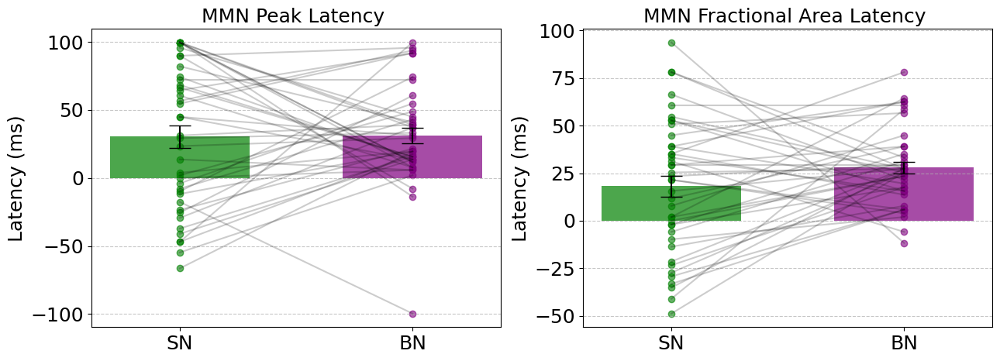

In [ ]:
time_window = (-100, 100)  # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

# 1. Peak latency analysis
peak_lat1, peak_lat2, subjects = extract_mmn_latencies(
    sn_aligned ,beep_aligned, time_window=time_window, 
    channels=channels, method='peak')
fig, axs = plt.subplots(1, 2, figsize=(15, 5), dpi=100)
peak_results = run_latency_statistical_tests(peak_lat1, peak_lat2)
print("Peak Latency Results:") 
print(f"PN: {peak_results['mean_latency_case1']:.1f} ± {peak_results['std_latency_case1']:.1f} ms")
print(f"BN: {peak_results['mean_latency_case2']:.1f} ± {peak_results['std_latency_case2']:.1f} ms")
print(f"t({peak_results['n_valid']-1}) = {peak_results['t_stat']:.3f}, p = {peak_results['p_value']:.3f}")

# Visualize
peak_fig = visualize_latency_results(peak_lat1, peak_lat2, subjects, "Peak",ax = axs[0],color=["green",'purple'],label=["SN",'BN'])


# 2. Fractional area latency analysis (50%) - more robust to noise
area_lat1, area_lat2, subjects = extract_mmn_latencies(
    sn_aligned ,beep_aligned, time_window=time_window, 
    channels=channels, method='fractional_area', fractional_area=0.5)

area_results = run_latency_statistical_tests(area_lat1, area_lat2)
print("\nFractional Area Latency Results:")
print(f"SN: {area_results['mean_latency_case1']:.1f} ± {area_results['std_latency_case1']:.1f} ms")
print(f"BN: {area_results['mean_latency_case2']:.1f} ± {area_results['std_latency_case2']:.1f} ms")
print(f"t({area_results['n_valid']-1}) = {area_results['t_stat']:.3f}, p = {area_results['p_value']:.3f}")

# Visualize
area_fig = visualize_latency_results(area_lat1, area_lat2, subjects, "Fractional Area",ax = axs[1],color=["green",'purple'],label=["SN",'BN'])
plt.show()

# Common Spatial Pattern (CSP)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mne.decoding import CSP
import mne
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis


def apply_csp_to_evoked_data(beep_mmn_dict, sn_mmn_dict, time_window=(0.150, 0.350),
                            n_components=4, n_splits=5):
    """
    Apply Common Spatial Patterns to analyze MMN evoked responses.
    
    Parameters:
    -----------
    beep_mmn_dict : dict
        Dictionary with subject IDs as keys and evoked objects for Beep MMN
    sn_mmn_dict : dict
        Dictionary with subject IDs as keys and evoked objects for SN MMN
    time_window : tuple
        Time window in seconds to focus analysis on (typically when MMN is present)
    n_components : int
        Number of CSP components to extract
    n_splits : int
        Number of cross-validation splits for performance evaluation
        
    Returns:
    --------
    dict
        Dictionary containing CSP patterns, filters, selected electrodes, and scores
    """
    # Get common subjects between conditions
    common_subjects = sorted(set(beep_mmn_dict.keys()) & set(sn_mmn_dict.keys()))
    
    if not common_subjects:
        raise ValueError("No common subjects found between the two conditions")
    
    print(f"Processing {len(common_subjects)} subjects")
    
    # Convert evoked data to a format suitable for CSP
    # We'll extract data from the specified time window
    X = []  # Will hold all data
    y = []  # Will hold corresponding labels
    
    # First, determine common channels across all subjects
    all_channels = set(beep_mmn_dict[common_subjects[0]].ch_names)
    for subject in common_subjects:
        all_channels &= set(beep_mmn_dict[subject].ch_names)
        all_channels &= set(sn_mmn_dict[subject].ch_names)
    
    common_channels = sorted(list(all_channels))
    print(f"Found {len(common_channels)} common channels across all subjects")
    
    for subject in common_subjects:
        # Extract data from beep MMN condition
        beep_evoked = beep_mmn_dict[subject].copy()
        beep_evoked.pick_channels(common_channels)
        beep_data = beep_evoked.crop(tmin=time_window[0], tmax=time_window[1]).data
        
        # Extract data from SN MMN condition
        sn_evoked = sn_mmn_dict[subject].copy()
        sn_evoked.pick_channels(common_channels)
        sn_data = sn_evoked.crop(tmin=time_window[0], tmax=time_window[1]).data
        
        # Add to our dataset
        # We treat each subject's evoked response as a "single trial" for CSP
        X.append(beep_data)
        X.append(sn_data)
        y.extend([0, 1])  # 0 for beep, 1 for SN
    
    # Convert to numpy array with shape (n_samples, n_channels, n_times)
    X = np.array(X)
    y = np.array(y)
    
    # Initialize CSP
    csp = CSP(n_components=n_components, reg=None, log=True, norm_trace=False)
    
    # Apply CSP to get spatial filters
    csp.fit(X, y)
    
    # Get patterns and filters
    patterns = csp.patterns_
    filters = csp.filters_
    
    # Create pipeline for classification
    clf = make_pipeline(CSP(n_components=n_components, reg=None, log=True), 
                       LinearDiscriminantAnalysis())
    
    # Perform cross-validation
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    scores = cross_val_score(clf, X, y, cv=cv)
    
    # Rank electrodes based on their contribution to the patterns
    electrode_importance = rank_electrodes_by_csp_patterns(patterns, common_channels)
    
    # Store results
    results = {
        'patterns': patterns,
        'filters': filters,
        'common_channels': common_channels,
        'electrode_importance': electrode_importance,
        'classification_scores': scores,
        'mean_score': np.mean(scores),
        'std_score': np.std(scores),
    }
    
    return results


def rank_electrodes_by_csp_patterns(patterns, channel_names):
    """
    Rank electrodes by their importance in CSP patterns.
    
    Parameters:
    -----------
    patterns : ndarray
        CSP patterns matrix (channels x components)
    channel_names : list
        Names of channels corresponding to patterns rows
        
    Returns:
    --------
    dict
        Dictionary of channels sorted by importance
    """
    # Calculate importance for each electrode across all patterns
    importance = np.sum(np.abs(patterns), axis=1)
    
    # Create dictionary of channel importances
    channel_importance = {ch: imp for ch, imp in zip(channel_names, importance)}
    
    # Sort by importance (descending)
    sorted_channels = sorted(channel_importance.items(), key=lambda x: x[1], reverse=True)
    
    return sorted_channels


def select_top_electrodes(electrode_importance, n_electrodes=10):
    """
    Select top N electrodes based on importance ranking.
    
    Parameters:
    -----------
    electrode_importance : list of tuples
        List of (channel, importance) tuples, sorted by importance
    n_electrodes : int
        Number of electrodes to select
        
    Returns:
    --------
    list
        Names of the top N electrodes
    """
    return [ch for ch, _ in electrode_importance[:n_electrodes]]


def visualize_csp_patterns(patterns, channel_names, info, n_components=4):
    """
    Visualize CSP patterns as topographic maps.
    
    Parameters:
    -----------
    patterns : ndarray
        CSP patterns matrix
    channel_names : list
        Names of channels corresponding to patterns rows
    info : mne.Info
        Info object containing channel positions
    n_components : int
        Number of components to visualize
    """
    # Create a copy of the info structure with only the channels we used
    info_pick = mne.pick_info(info, [info['ch_names'].index(ch) for ch in channel_names])
    
    # Create evoked object for visualization
    # (this is a trick to use MNE's plotting functions)
    times = np.arange(n_components)
    patterns_data = patterns[:, :n_components]
    
    # Create an evoked object
    evoked = mne.EvokedArray(patterns_data, info_pick, tmin=0)
    
    # Plot topomaps
    fig = evoked.plot_topomap(times=times, show=False,
                             time_format='Component %01d')
    
    return fig


def apply_csp_filters_to_evoked(evoked, filters, channel_names):
    """
    Apply CSP spatial filters to an evoked object.
    
    Parameters:
    -----------
    evoked : mne.Evoked
        Evoked object to filter
    filters : ndarray
        CSP spatial filters
    channel_names : list
        Names of channels corresponding to filter columns
        
    Returns:
    --------
    mne.Evoked
        Filtered evoked object
    """
    evoked_copy = evoked.copy()
    
    # Pick the channels that match our CSP filters
    evoked_copy.pick_channels(channel_names)
    
    # Apply the spatial filters
    filtered_data = np.dot(filters.T, evoked_copy.data)
    
    # Create a new evoked object with the filtered data
    # First, create a simple info object for the CSP components
    n_components = filters.shape[1]
    info = mne.create_info(
        ch_names=[f'CSP{i}' for i in range(n_components)],
        sfreq=evoked.info['sfreq'],
        ch_types=['misc'] * n_components
    )
    
    # Create evoked with filtered data
    filtered_evoked = mne.EvokedArray(filtered_data, info, 
                                     tmin=evoked.times[0],
                                     comment=evoked.comment)
    
    return filtered_evoked


def create_evoked_with_selected_electrodes(evoked, selected_channels):
    """
    Create new evoked object with only selected channels.
    
    Parameters:
    -----------
    evoked : mne.Evoked
        Original evoked object
    selected_channels : list
        Channels to keep
        
    Returns:
    --------
    mne.Evoked
        New evoked object with only selected channels
    """
    # Pick only channels that exist in the original evoked
    existing_channels = [ch for ch in selected_channels if ch in evoked.ch_names]
    
    if not existing_channels:
        raise ValueError("None of the selected channels exist in the evoked object")
    
    # Create a copy with only selected channels
    evoked_selected = evoked.copy().pick_channels(existing_channels)
    
    return evoked_selected


def average_mmn_with_selected_electrodes(mmn_dict, selected_channels):
    """
    Create grand average of MMN responses using only selected channels.
    
    Parameters:
    -----------
    mmn_dict : dict
        Dictionary with subject IDs as keys and evoked objects
    selected_channels : list
        Channels to include in the average
        
    Returns:
    --------
    mne.Evoked
        Grand average evoked object
    dict
        Dictionary with subject IDs and selected-channel evoked objects
    """
    selected_evoked_dict = {}
    
    for subject, evoked in mmn_dict.items():
        try:
            selected_evoked = create_evoked_with_selected_electrodes(evoked, selected_channels)
            selected_evoked_dict[subject] = selected_evoked
        except ValueError:
            print(f"Skipping subject {subject} - no matching channels")
    
    if not selected_evoked_dict:
        raise ValueError("No subjects with selected channels")
    
    # Create grand average
    grand_avg = mne.grand_average(list(selected_evoked_dict.values()))
    
    return grand_avg, selected_evoked_dict


def compare_conditions_with_selected_electrodes(beep_mmn_dict, sn_mmn_dict, selected_channels):
    """
    Compare two MMN conditions using only the selected electrodes.
    
    Parameters:
    -----------
    beep_mmn_dict, sn_mmn_dict : dict
        Dictionaries with subject IDs and evoked objects
    selected_channels : list
        Channels to include in the comparison
    """
    # Create grand averages with selected channels
    beep_avg, _ = average_mmn_with_selected_electrodes(beep_mmn_dict, selected_channels)
    sn_avg, _ = average_mmn_with_selected_electrodes(sn_mmn_dict, selected_channels)
    
    # Plot comparison
    fig, ax = plt.subplots(figsize=(10, 6))
    times = beep_avg.times * 1000  # Convert to ms
    
    # Average across selected channels
    beep_data = np.mean(beep_avg.data, axis=0)
    sn_data = np.mean(sn_avg.data, axis=0)
    
    ax.plot(times, beep_data, 'purple', linewidth=2, label='Beep MMN')
    ax.plot(times, sn_data, 'green', linewidth=2, label='SN MMN')
    
    ax.set_xlabel('Time (ms)')
    ax.set_ylabel('Amplitude (μV)')
    ax.set_title(f'Grand Average MMN with {len(selected_channels)} CSP-selected electrodes')
    ax.legend()
    ax.grid(True, linestyle=':')
    
    plt.tight_layout()
    return fig, ax


Processing 52 subjects
Found 64 common channels across all subjects
Classification accuracy: 0.509 ± 0.042
Top 10 electrodes: ['AF8', 'POz', 'F6', 'T7', 'F3', 'PO4', 'CP3', 'P4', 'FC2', 'AF7']


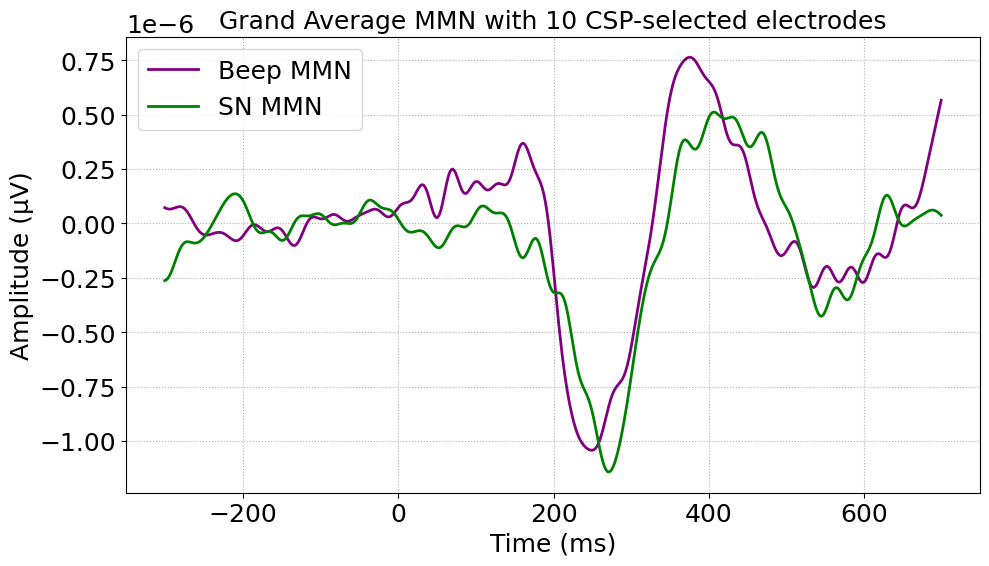

ValueError: shapes (4,63) and (64,513) not aligned: 63 (dim 1) != 64 (dim 0)

In [ ]:
# Example usage with your MMN evoked dictionaries
# Define time window capturing the peak MMN response (adjust based on your data)
time_window = (0.150, 0.400)  # 200-400 ms (based on your ERP plots)

# Apply CSP to find optimal spatial patterns 
csp_results = apply_csp_to_evoked_data(
    BN_MMN_evokeds_dict, 
    PN_MMN_evokeds_dict, 
    time_window=time_window,
    n_components=6  # Number of CSP components to use
)

# Get classification performance
print(f"Classification accuracy: {csp_results['mean_score']:.3f} ± {csp_results['std_score']:.3f}")

# Get top electrodes
top_electrodes = select_top_electrodes(csp_results['electrode_importance'], n_electrodes=10)
print("Top 10 electrodes:", top_electrodes)

# Visualize CSP patterns - use info from one of the subjects
example_subject = list(BN_MMN_evokeds_dict.keys())[0]
info = BN_MMN_evokeds_dict[example_subject].info
# #fig = visualize_csp_patterns(csp_results['patterns'], 
#                          csp_results['common_channels'],
#                          info,
#                          n_components=4)
#plt.show()

# Compare conditions using selected electrodes
fig, ax = compare_conditions_with_selected_electrodes(
    BN_MMN_evokeds_dict, 
    PN_MMN_evokeds_dict, 
    selected_channels=top_electrodes
)
plt.show()

# Apply full CSP transformation to a single subject's data (for visualization)
subject_id = example_subject
filtered_beep = apply_csp_filters_to_evoked(
    BN_MMN_evokeds_dict[subject_id],
    csp_results['filters'][:, :4],  # Use first 4 components
    csp_results['common_channels']
)

# Plot CSP-filtered data
filtered_beep.plot(picks='all')


# Type of audio stimuli

### PN duration base tone type 

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_33556\833630968.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=-0.1, tmax=0.7) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_33556\833630968.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=-0.1, tmax=0.7) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_33556\833630968.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=-0.1, tmax=0.7) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_33556\833630968.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk

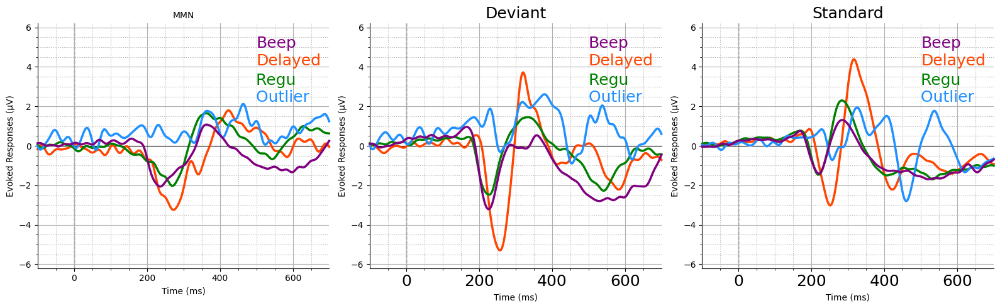

In [ ]:
delayed_tone = ['sub-sd012', 'sub-sd014', 'sub-sd016', 'sub-sd020', 'sub-sd027', 'sub-sd032', 'sub-sd033',
                 'sub-sd036', 'sub-sd038', 'sub-sd044', 'sub-sd051', 'sub-sd055', 'sub-sd067']
regu_tone = ['sub-sd011','sub-sd013', 'sub-sd015', 'sub-sd017', 'sub-sd018', 'sub-sd019', 'sub-sd021', 'sub-sd022', 'sub-sd023',
              'sub-sd024', 'sub-sd025', 'sub-sd026', 'sub-sd028', 'sub-sd029', 'sub-sd030', 'sub-sd031', 'sub-sd035', 'sub-sd037',
                'sub-sd041', 'sub-sd042', 'sub-sd043', 'sub-sd045', 'sub-sd046', 'sub-sd047', 'sub-sd048', 'sub-sd049', 'sub-sd052',
                  'sub-sd053', 'sub-sd054', 'sub-sd056', 'sub-sd057', 'sub-sd058', 'sub-sd060','sub-sd061','sub-sd062', 'sub-sd063', 'sub-sd064',
                    'sub-sd065', 'sub-sd066']


outliar_tone = ['sub-sd034', 'sub-sd039', 'sub-sd040', 'sub-sd050', 'sub-sd059'] 

dur_tone_groups = {
    'delayed_tone': delayed_tone,
    'regu_tone': regu_tone,
    'outliar_tone': outliar_tone,
}
tone_based_PN_MMN_evokes = {key: [] for key in dur_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_MMN_evokeds_dict.items():
    for group_name, subject_list in dur_tone_groups.items():
        if sub in subject_list:
            tone_based_PN_MMN_evokes[group_name].append(evoked)
            break


tone_based_BN_MMN_evokes = {key: [] for key in dur_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_MMN_evokeds_dict.items():
    for group_name, subject_list in dur_tone_groups.items():
        if sub in subject_list:
            tone_based_BN_MMN_evokes[group_name].append(evoked)
            break

tone_based_PN_devi_evokes = {key: [] for key in dur_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_devi_eps_evoked_dict.items():
    for group_name, subject_list in dur_tone_groups.items():
        if sub in subject_list:
            tone_based_PN_devi_evokes[group_name].append(evoked)
            break

tone_based_PN_std_evokes = {key: [] for key in dur_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_sta_eps_evoked_dict.items():
    for group_name, subject_list in dur_tone_groups .items():
        if sub in subject_list:
            tone_based_PN_std_evokes[group_name].append(evoked)
            break
stylesdict ={"delayed_tone": {"linewidth": 2.5,"linestyle":'solid','color' : 'orangered'},
             'regu_tone' : {"linewidth": 2.5,"linestyle":'solid','color' : 'green'},
             'outliar_tone': {"linewidth": 2.5,"linestyle":'solid','color' : 'dodgerblue'},
             "Beep": {"linewidth": 2.5,"linestyle":'solid','color' : 'purple'},
             }
text_labels = [
    (0.90, "Beep",'purple'),
    (0.83, f"Delayed",'orangered'),
    (0.75, f"Regu ",'green'),
    (0.68, f"Outlier ",'dodgerblue')
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = tone_based_PN_MMN_evokes
evokeds["Beep"] = [evk for  sub,evk in BN_MMN_evokeds_dict.items() ]
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="MMN",axs=axs[0])

# Define second ERP comparison
evokeds = tone_based_PN_devi_evokes
evokeds["Beep"] = [evk for  sub,evk in BN_devi_eps_evoked_dict.items() ]
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="Deviant",axs=axs[1])


evokeds = tone_based_PN_std_evokes 
evokeds["Beep"] = [evk for  sub,evk in BN_sta_eps_evoked_dict.items() ]
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="Standard",axs=axs[2])
plt.tight_layout()
plt.show()

### Different PN tone ERPs

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_33556\833630968.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=-0.1, tmax=0.7) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_33556\833630968.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=-0.1, tmax=0.7) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_33556\833630968.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=-0.1, tmax=0.7) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_33556\833630968.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk

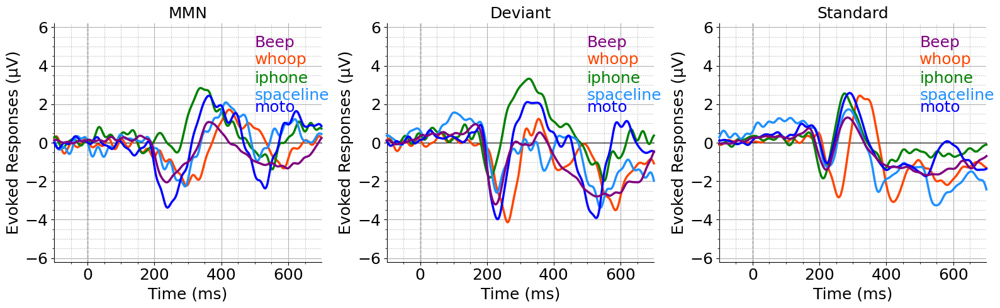

In [ ]:

whoop_tone = ['sub-sd012', 'sub-sd016','sub-sd036', 'sub-sd038' ,'sub-sd051','sub-sd067']
iphonr_tone = [ 'sub-sd019','sub-sd028', 'sub-sd031', 'sub-sd035','sub-sd043', 'sub-sd045','sub-sd052', 'sub-sd065',]
spaceLine_tone = ['sub-sd017', 'sub-sd026', 'sub-sd046', 'sub-sd047','sub-sd054','sub-sd063']
moto_tone = ['sub-sd011','sub-sd013',  'sub-sd018','sub-sd048','sub-sd056', ]


type_tone_groups = {
    'whoop_tone': whoop_tone,
    'iphonr_tone': iphonr_tone,
    'spaceLine_tone': spaceLine_tone,
    'moto_tone' :moto_tone,
}
type_tone_based_PN_MMN_evokes = {key: [] for key in type_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_MMN_evokeds_dict.items():
    for group_name, subject_list in type_tone_groups.items():
        if sub in subject_list:
            type_tone_based_PN_MMN_evokes[group_name].append(evoked)
            break


type_tone_based_BN_MMN_evokes = {key: [] for key in type_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_MMN_evokeds_dict.items():
    for group_name, subject_list in type_tone_groups.items():
        if sub in subject_list:
            type_tone_based_BN_MMN_evokes[group_name].append(evoked)
            break

type_tone_based_PN_devi_evokes = {key: [] for key in type_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_devi_eps_evoked_dict.items():
    for group_name, subject_list in type_tone_groups.items():
        if sub in subject_list:
            type_tone_based_PN_devi_evokes[group_name].append(evoked)
            break

type_tone_based_PN_std_evokes = {key: [] for key in type_tone_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_sta_eps_evoked_dict.items():
    for group_name, subject_list in type_tone_groups.items():
        if sub in subject_list:
            type_tone_based_PN_std_evokes[group_name].append(evoked)
            break
stylesdict ={"whoop_tone": {"linewidth": 2.5,"linestyle":'solid','color' : 'orangered'},
             'iphonr_tone' : {"linewidth": 2.5,"linestyle":'solid','color' : 'green'},
             'spaceLine_tone': {"linewidth": 2.5,"linestyle":'solid','color' : 'dodgerblue'},
             "Beep": {"linewidth": 2.5,"linestyle":'solid','color' : 'purple'},
             "moto_tone": {"linewidth": 2.5,"linestyle":'solid','color' : 'blue'},
             }

type_tone_groups = {
    'whoop_tone': whoop_tone,
    'iphonr_tone': iphonr_tone,
    'spaceLine_tone': spaceLine_tone,
    'moto_tone' :moto_tone,
}
text_labels = [
    (0.90, "Beep",'purple'),
    (0.83, f"whoop",'orangered'),
    (0.75, f"iphone",'green'),
    (0.68, f"spaceline",'dodgerblue'),
    (0.63, f"moto",'blue')
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = type_tone_based_PN_MMN_evokes
evokeds["Beep"] = [evk for  sub,evk in BN_MMN_evokeds_dict.items() ]
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="MMN",axs=axs[0])

# Define second ERP comparison
evokeds = type_tone_based_PN_devi_evokes
evokeds["Beep"] = [evk for  sub,evk in BN_devi_eps_evoked_dict.items() ] 
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="Deviant",axs=axs[1])


evokeds = type_tone_based_PN_std_evokes 
evokeds["Beep"] = [evk for  sub,evk in BN_sta_eps_evoked_dict.items() ] 
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,ci=False,title="Standard",axs=axs[2])
plt.tight_layout()
plt.show()

# Smartphone usage based group

In [ ]:
low_sub_D  = ['sd011', 'sd012', 'sd013', 'sd014', 'sd017', 'sd019', 'sd020', 'sd021', 'sd023', 'sd024', 'sd025', 'sd027', 'sd031',
               'sd032', 'sd043', 'sd044', 'sd045', 'sd046', 'sd047', 'sd048', 'sd052', 'sd053', 'sd057', 'sd060', 'sd061', 'sd063', 'sd064', 'sd065', 'sd067']
low_sub_D = ["sub-"+sub for sub in low_sub_D ]

high_sub_D = ['sd015', 'sd016', 'sd018', 'sd022', 'sd026', 'sd028', 'sd029', 'sd030', 'sd033', 'sd034', 'sd035', 'sd036', 'sd037',
               'sd038', 'sd039', 'sd040', 'sd041', 'sd042', 'sd049', 'sd050', 'sd051', 'sd054', 'sd055', 'sd056', 'sd058', 'sd059', 'sd062', 'sd066']
high_sub_D  = ["sub-"+sub for sub in high_sub_D  ]

### LSU and HSU MMN

In [ ]:
usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}
usage_groups_PN_MMN_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_MMN_evokeds_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_PN_MMN_evokes[group_name].append(evoked)
            break 


usage_groups_BN_MMN_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in BN_MMN_evokeds_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_BN_MMN_evokes[group_name].append(evoked)
            break

usage_groups_PN_devi_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_devi_eps_evoked_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_PN_devi_evokes[group_name].append(evoked)
            break

usage_groups_PN_std_evokes = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_sta_eps_evoked_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
           usage_groups_PN_std_evokes[group_name].append(evoked)
           break

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in evoked_dict[cond]]
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:24: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evo

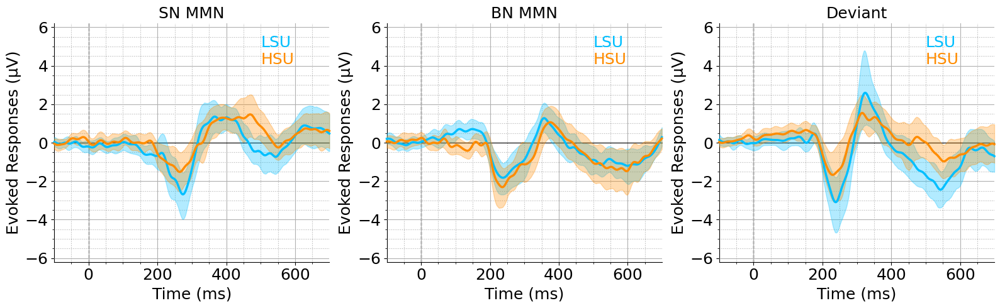

In [ ]:
stylesdict ={"low sub": {"linewidth": 2.5,"linestyle":'solid','color' : 'deepskyblue'}, 
             'high sub' : {"linewidth": 2.5,"linestyle":'solid','color' : 'darkorange'},
             }


text_labels = [
    (0.90, "LSU",'deepskyblue'),
    (0.83, f"HSU",'darkorange'),
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = usage_groups_PN_MMN_evokes
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="SN MMN",axs=axs[0])

# Define second ERP comparison
evokeds = usage_groups_BN_MMN_evokes
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="BN MMN",axs=axs[1])


evokeds = usage_groups_PN_devi_evokes
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="Deviant",axs=axs[2])
plt.tight_layout()
plt.show()

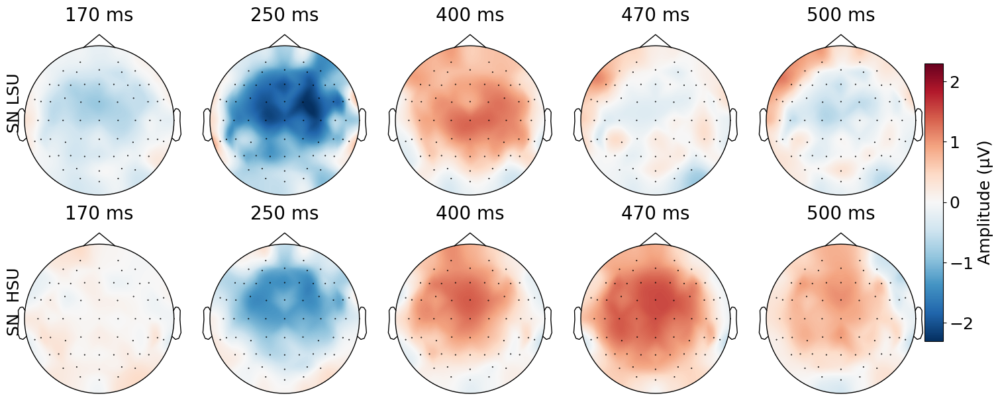

In [ ]:
# Define time points
time_points = [.170, .250,.400,.470,.5,]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(usage_groups_PN_MMN_evokes['low sub']).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average(usage_groups_PN_MMN_evokes['high sub']).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'SN LSU', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'SN  HSU', fontsize=18   , rotation=90, va='center')

plt.show()

#### SN 's Statistical Analysis Mean and Peak Latency 

C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\1239849373.py:31: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_cropped = evoked_copy.crop(tmin=time_window[0], tmax=time_window[1])
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\1239849373.py:31: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_cropped = evoked_copy.crop(tmin=time_window[0], tmax=time_window[1])
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\1239849373.py:31: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_cropped = evoked_copy.crop(tmin=time_window[0], tmax=time_window[1])
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\1239849373.py:31: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.evoked.EvokedArray'>.tmax (0.699219 s)
  evoked_cropped = evoked_copy.crop(tmin=t

 Mean  Amplitude : t_stat [0.76773989] with , p_value [0.44632576]
 Peak Amplitude : t_stat 2.0133063519528096 with , p_value 0.049592458908462


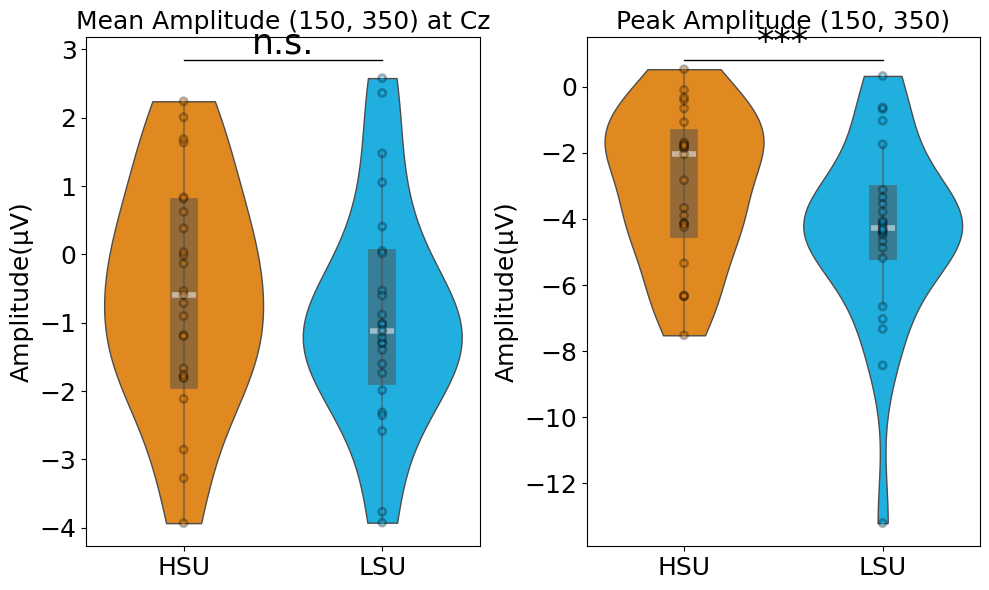

In [ ]:
df_type = "Amplitude"
label=("HSU", "LSU")
time_window = (150, 350)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels
usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}
usage_groups_PN_MMN_evokes = {key: dict() for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in PN_MMN_evokeds_dict.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_PN_MMN_evokes[group_name][sub]=evoked
            break 
HSU_amps_peak = np.array(list(extract_peak_amplitude(usage_groups_PN_MMN_evokes['high sub'],time_window = (.150, .350),polarity='negative',channels=["Cz"]).values()))
LSU_amps_peak =np.array(list(extract_peak_amplitude(usage_groups_PN_MMN_evokes['low sub'],time_window = (.150, 350),polarity='negative',channels=["Cz"]).values()))

usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}

HSU_amps_mean = np.array([ np.mean(usage_groups_PN_MMN_evokes['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_PN_MMN_evokes['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_PN_MMN_evokes['high sub']])
LSU_amps_mean = np.array([ np.mean(usage_groups_PN_MMN_evokes['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_PN_MMN_evokes['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_PN_MMN_evokes['low sub']])

#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_mean.flatten()*1e+6, LSU_amps_mean.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_mean.shape[0], LSU_amps_mean.shape[0]]),

    })
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(HSU_amps_mean, LSU_amps_mean)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_peak.flatten()*1e+6, LSU_amps_peak.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_peak.shape[0], LSU_amps_peak.shape[0]]),

    })

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_ind(HSU_amps_peak, LSU_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

In [ ]:

print(f"HSU_amps_peak : {np.mean(HSU_amps_peak*1e+6):.2f} ± {np.std(HSU_amps_peak*1e+6 ):.2f}")
print(f"LSU_amps_peak : {np.mean(LSU_amps_peak*1e+6):.2f} ± {np.std(LSU_amps_peak*1e+6):.2f}")
PN_amps
print(f"HSU_amps_mean : {np.mean(HSU_amps_mean*1e+6):.5f} ± {np.std(HSU_amps_mean*1e+6 ):.5f}")
print(f"LSU_amps_mean : {np.mean(LSU_amps_mean*1e+6):.5f} ± {np.std(LSU_amps_mean*1e+6 ):.5f}")

HSU_amps_peak : -2.95 ± 2.19
LSU_amps_peak : -4.36 ± 2.69
HSU_amps_mean : -0.56875 ± 1.60393
LSU_amps_mean : -0.91584 ± 1.56064


#### SN's Statistical test latency 

Peak latency ;- t_stat -0.8639747010321975 with , p_value 0.39181148261603727
Fractional area (50 %) latency ;- t_stat 0.6033652711085605 with , p_value 0.5492950497947365


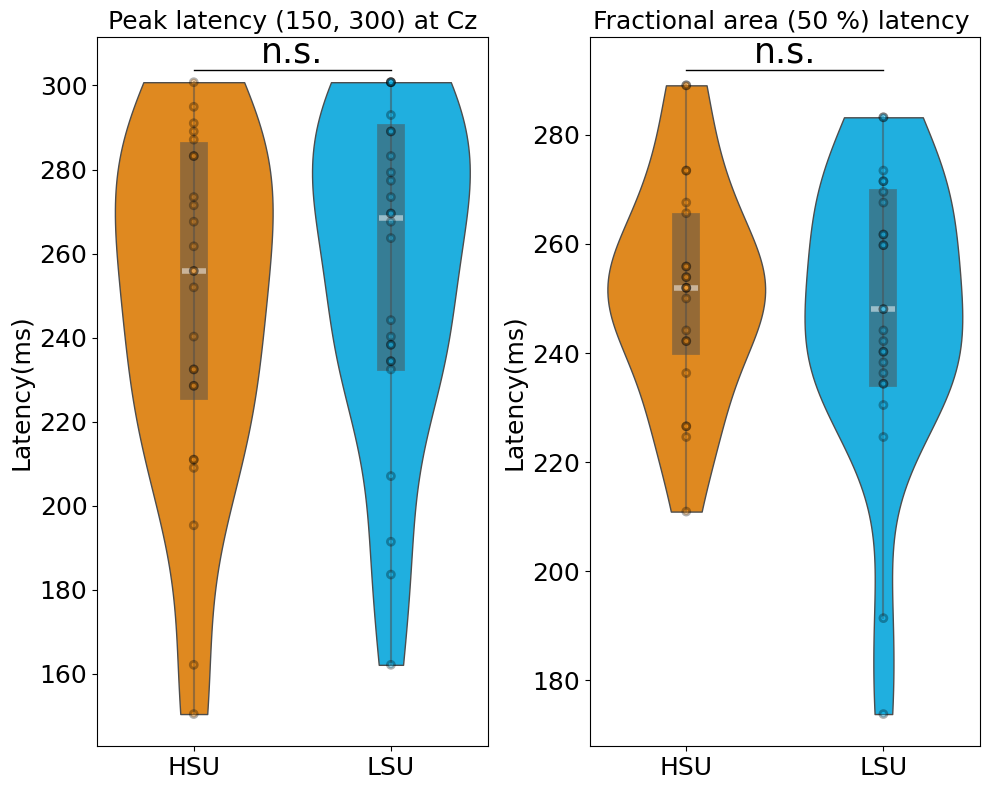

In [ ]:
time_window = (150, 300)   # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

peak_high_lat = unpaired_extract_mmn_latencies(usage_groups_PN_MMN_evokes['high sub'] , time_window=time_window,channels=channels, method='peak')
peak_low_lat = unpaired_extract_mmn_latencies(usage_groups_PN_MMN_evokes['low sub'] , time_window=time_window,channels=channels, method='peak')

area_high_lat = unpaired_extract_mmn_latencies(usage_groups_PN_MMN_evokes['high sub'] , time_window=time_window,channels=channels, method='fractional_area', fractional_area=0.50)
area_low_lat = unpaired_extract_mmn_latencies(usage_groups_PN_MMN_evokes['low sub'] , time_window=time_window,channels=channels, method='fractional_area', fractional_area=0.50)

# Extract Latency
df_type = "Latency"
label=("HSU", "LSU")
# Set up the plot
df  = pd.DataFrame({
        df_type: np.concatenate([peak_high_lat, peak_low_lat ]),
        'Case': np.repeat([label[0], label[1]], [peak_high_lat.shape[0], peak_low_lat.shape[0]]),

    })
df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.01
t_stat, p_value = stats.ttest_ind(peak_high_lat, peak_low_lat)
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df  = pd.DataFrame({
        df_type: np.concatenate([area_high_lat, area_low_lat]),
        'Case': np.repeat([label[0], label[1]], [peak_high_lat.shape[0], peak_low_lat.shape[0]]),

    })
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.01
t_stat, p_value = stats.ttest_ind(area_high_lat[~np.isnan(area_high_lat)], area_low_lat[~np.isnan(area_low_lat)])
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (50 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

In [ ]:

print(f"HSU_amps_peak : {np.mean(peak_high_lat):.2f} ± {np.std(peak_high_lat ):.2f}")
print(f"LSU_amps_peak : {np.mean(peak_low_lat):.2f} ± {np.std(peak_low_lat):.2f}")


print(f"HSU_amps_area : {np.mean(area_high_lat[~np.isnan(area_high_lat)]):.2f} ± {np.std(area_high_lat[~np.isnan(area_high_lat)]):.2f}")
print(f"LSU_amps_area : {np.mean(area_low_lat[~np.isnan(area_low_lat)]):.2f} ± {np.std(area_low_lat[~np.isnan(area_low_lat)]):.2f}")

HSU_amps_peak : 246.72 ± 39.83
LSU_amps_peak : 256.31 ± 37.88
HSU_amps_area : 251.69 ± 19.50
LSU_amps_area : 247.58 ± 25.34


### SN aligned :-   HSU and LSU 

In [ ]:
usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}
usage_groups_sn_aligned_sn = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_aligned_sn.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_sn_aligned_sn[group_name].append(evoked)
            break


usage_groups_sn_aligned_beep = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_aligned_beep.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_sn_aligned_beep[group_name].append(evoked)
            break
sn_aligned_devi = align_and_standardize_evokeds(
    PN_devi_eps_evoked_dict, 
    combined_result, 
    condition_key='sn'
)

usage_groups_sn_aligned_devi = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_aligned_devi .items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_sn_aligned_devi[group_name].append(evoked)
            break

Successfully aligned 32 subjects: ['sub-sd011', 'sub-sd061', 'sub-sd033', 'sub-sd036', 'sub-sd066', 'sub-sd016', 'sub-sd067', 'sub-sd018', 'sub-sd020', 'sub-sd057', 'sub-sd037', 'sub-sd056', 'sub-sd015', 'sub-sd013', 'sub-sd029', 'sub-sd017', 'sub-sd032', 'sub-sd048', 'sub-sd019', 'sub-sd028', 'sub-sd038', 'sub-sd052', 'sub-sd045', 'sub-sd024', 'sub-sd062', 'sub-sd053', 'sub-sd021', 'sub-sd025', 'sub-sd060', 'sub-sd040', 'sub-sd026', 'sub-sd042']


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


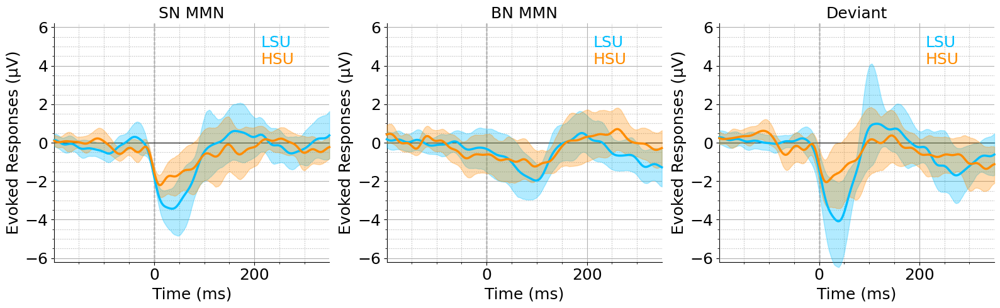

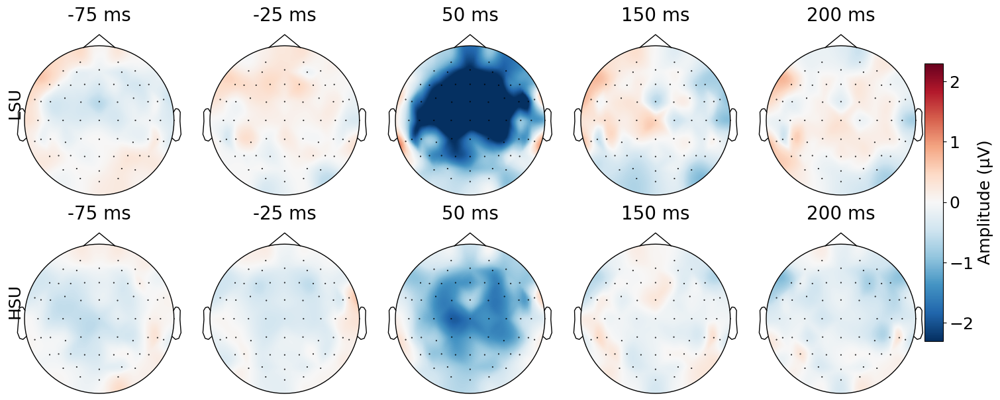

In [ ]:
stylesdict ={"low sub": {"linewidth": 2.5,"linestyle":'solid','color' : 'deepskyblue'}, 
             'high sub' : {"linewidth": 2.5,"linestyle":'solid','color' : 'darkorange'},
             }


text_labels = [
    (0.90, "LSU",'deepskyblue'),
    (0.83, f"HSU",'darkorange'),
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = usage_groups_sn_aligned_sn
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="SN MMN",axs=axs[0],time_range=(-.200,.350))

# Define second ERP comparison
evokeds = usage_groups_sn_aligned_beep
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="BN MMN",axs=axs[1],time_range=(-.200,.350))


evokeds = usage_groups_sn_aligned_devi
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="Deviant",axs=axs[2],time_range=(-.200,.350))
plt.tight_layout()
plt.show()
evokeds_subset = {}
for cond in usage_groups_sn_aligned_sn:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in usage_groups_sn_aligned_sn[cond]]
        evokeds_subset[cond]  =evoked_crop 
# Define time points
time_points = [-0.075,-0.025, .050,.150,.200]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['low sub']).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average(evokeds_subset['high sub']).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'LSU', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'HSU', fontsize=18   , rotation=90, va='center')

plt.show()

#### statistics analysis

##### Mean  & Peak Amplitude analysis

 Mean  Amplitude : t_stat [1.2175434] with , p_value [0.23288809]
 Peak Amplitude : t_stat 1.4338998918418069 with , p_value 0.16194247286155836


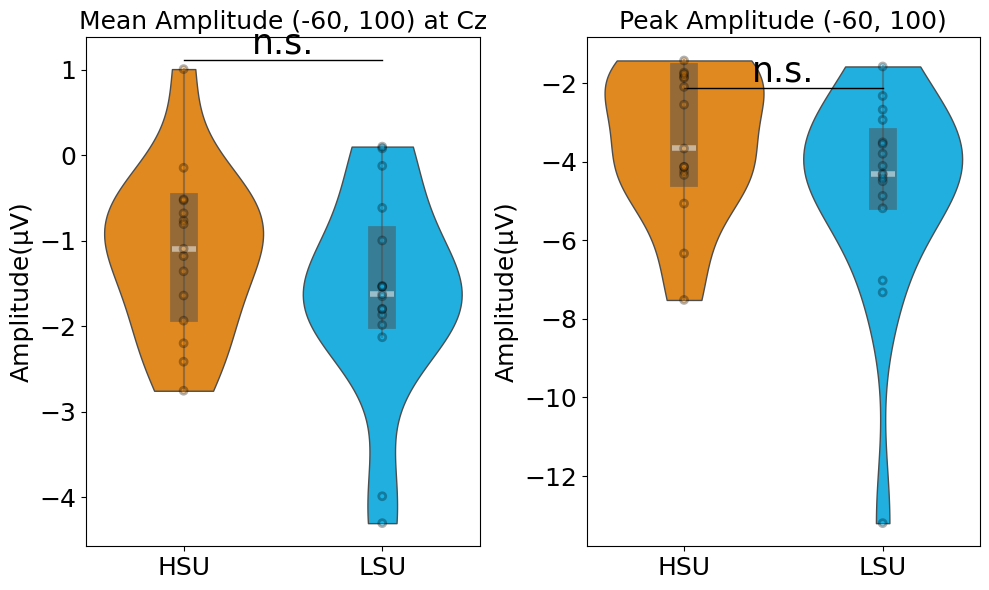

In [ ]:
df_type = "Amplitude"
label=("HSU", "LSU")
time_window = (-60, 100)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels
usage_groups_sn_aligned_sn = {key: dict() for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_aligned_sn.items():
    for group_name, subject_list in usage_groups.items():
        
        if sub in subject_list:
            usage_groups_sn_aligned_sn[group_name][sub] = evoked
            break
HSU_amps_peak = np.array(list(extract_peak_amplitude(usage_groups_sn_aligned_sn['high sub'],time_window = (-.060, .100),channels=["Cz"]).values()))
LSU_amps_peak =np.array(list(extract_peak_amplitude(usage_groups_sn_aligned_sn['low sub'],time_window = (-.060, .100),channels=["Cz"]).values()))

usage_groups = {
    'low sub': low_sub_D,
    'high sub': high_sub_D,
}

HSU_amps_mean = np.array([ np.mean(usage_groups_sn_aligned_sn['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_sn_aligned_sn['high sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_sn_aligned_sn['high sub']])
LSU_amps_mean = np.array([ np.mean(usage_groups_sn_aligned_sn['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_sn_aligned_sn['low sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_sn_aligned_sn['low sub']])

#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_mean.flatten()*1e+6, LSU_amps_mean.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_mean.shape[0], LSU_amps_mean.shape[0]]),

    })
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(HSU_amps_mean, LSU_amps_mean)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_peak.flatten()*1e+6, LSU_amps_peak.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_peak.shape[0], LSU_amps_peak.shape[0]]),

    })

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_ind(HSU_amps_peak, LSU_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

##### Latency analysis

In [ ]:
def unpaired_extract_mmn_latencies(case1_dict, time_window=(100, 300), channels=None, 
                          method='peak', fractional_area=0.50):
    """Extract MMN latencies using specified method."""
    time_axis = None  # Will be determined from the first subject's data
    
    latencies_case1 = []
  
    for subject in case1_dict:
        # Get the MMN evoked data for selected channels
        if channels:
            case1_data = case1_dict[subject].copy().pick_channels(channels)
        else:
            case1_data = case1_dict[subject].copy()
        
        # Extract the time axis if not yet done
        if time_axis is None:
            time_axis = case1_data.times
            
        # Crop to time window of interest
        case1_data = case1_data.copy().crop(tmin=time_window[0]/1000, tmax=time_window[1]/1000)
        
        # Get the data as numpy arrays - average across selected channels
        case1_avg = np.mean(case1_data.data, axis=0) if len(case1_data.data.shape) > 1 else case1_data.data
        
        # Get the time axis for this window
        window_times = case1_data.times
        
        # Extract latency based on the selected method 
        if method == 'peak':
            # Find the peak latency (time of max negative amplitude)
            peak_idx1 = np.argmin(case1_avg)
            lat1 = window_times[peak_idx1] * 1000  # Convert to ms
            
        elif method == 'fractional_area':
            # Fractional area latency (more robust against noise)
            lat1 = get_fractional_area_latency(case1_avg, window_times, fractional_area) * 1000
            
        elif method == 'onset':
            # Onset latency (when amplitude reaches a percentage of peak)
            percent_threshold = 0.50  # Typically 50% of peak amplitude
            lat1 = get_onset_latency(case1_avg, window_times, percent_threshold) * 1000
            
        latencies_case1.append(lat1)
    
    return np.array(latencies_case1)


Peak latency ;- t_stat -0.47552555143710196 with , p_value 0.6378567676112695
Fractional area (50 %) latency ;- t_stat -0.6204920711493092 with , p_value 0.5396194331256996


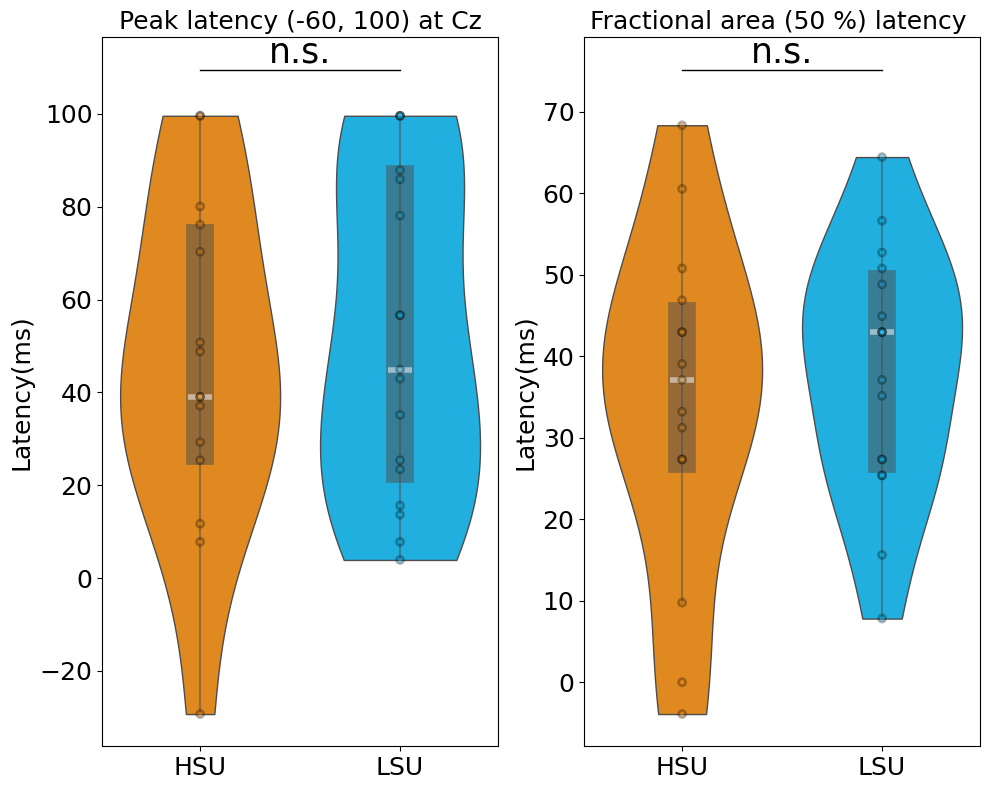

In [ ]:
time_window = (-60, 100)   # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

peak_high_lat = unpaired_extract_mmn_latencies(usage_groups_sn_aligned_sn['high sub'] , time_window=time_window,channels=channels, method='peak')
peak_low_lat = unpaired_extract_mmn_latencies(usage_groups_sn_aligned_sn['low sub'] , time_window=time_window,channels=channels, method='peak')

area_high_lat = unpaired_extract_mmn_latencies(usage_groups_sn_aligned_sn['high sub'] , time_window=time_window,channels=channels, method='fractional_area', fractional_area=0.50)
area_low_lat = unpaired_extract_mmn_latencies(usage_groups_sn_aligned_sn['low sub'] , time_window=time_window,channels=channels, method='fractional_area', fractional_area=0.50)

# Extract Latency
df_type = "Latency"
label=("HSU", "LSU")
# Set up the plot
df  = pd.DataFrame({
        df_type: np.concatenate([peak_high_lat, peak_low_lat ]),
        'Case': np.repeat([label[0], label[1]], [peak_high_lat.shape[0], peak_low_lat.shape[0]]),

    })
df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(peak_high_lat, peak_low_lat)
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df  = pd.DataFrame({
        df_type: np.concatenate([area_high_lat, area_low_lat]),
        'Case': np.repeat([label[0], label[1]], [peak_high_lat.shape[0], peak_low_lat.shape[0]]),

    })
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(area_high_lat[~np.isnan(area_high_lat)], area_low_lat[~np.isnan(area_low_lat)])
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (50 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()

# by demographic

In [ ]:
acd_sub_D  = ['sd011', 'sd012', 'sd013', 'sd014', 'sd015', 'sd016', 'sd017', 'sd018', 'sd019', 'sd020', 'sd021', 'sd022', 'sd023', 'sd024',
                'sd025', 'sd026', 'sd027', 'sd028', 'sd029', 'sd030', 'sd031', 'sd032',
                  'sd034', 'sd035',  'sd043', 'sd044', 'sd045', 'sd046', 'sd047', 'sd048', 'sd049', 'sd050', 'sd051', 'sd052', 'sd053', 'sd054',
                    'sd061', 'sd062', 'sd063', 'sd064', 'sd066', 'sd065', 'sd067']
acd_sub_D = ["sub-"+sub for sub in acd_sub_D]

non_acd_sub_D = ['sd033',  'sd036', 'sd037',
               'sd038', 'sd039', 'sd040', 'sd041', 'sd042','sd055', 'sd056', 'sd058', 'sd059', 'sd057', 'sd060']
non_acd_sub_D  = ["sub-"+sub for sub in non_acd_sub_D]

## SN align MMN plot

In [ ]:
usage_groups = {
    'acd sub': acd_sub_D ,
    'non_acd sub': non_acd_sub_D,
}
usage_groups_sn_aligned_sn = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_aligned_sn.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_sn_aligned_sn[group_name].append(evoked)
            break


usage_groups_sn_aligned_beep = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_aligned_beep.items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_sn_aligned_beep[group_name].append(evoked)
            break
sn_aligned_devi = align_and_standardize_evokeds(
    PN_devi_eps_evoked_dict, 
    combined_result, 
    condition_key='sn'
)

usage_groups_sn_aligned_devi = {key: [] for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_aligned_devi .items():
    for group_name, subject_list in usage_groups.items():
        if sub in subject_list:
            usage_groups_sn_aligned_devi[group_name].append(evoked)
            break

Successfully aligned 32 subjects: ['sub-sd011', 'sub-sd061', 'sub-sd033', 'sub-sd036', 'sub-sd066', 'sub-sd016', 'sub-sd067', 'sub-sd018', 'sub-sd020', 'sub-sd057', 'sub-sd037', 'sub-sd056', 'sub-sd015', 'sub-sd013', 'sub-sd029', 'sub-sd017', 'sub-sd032', 'sub-sd048', 'sub-sd019', 'sub-sd028', 'sub-sd038', 'sub-sd052', 'sub-sd045', 'sub-sd024', 'sub-sd062', 'sub-sd053', 'sub-sd021', 'sub-sd025', 'sub-sd060', 'sub-sd040', 'sub-sd026', 'sub-sd042']


C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(
C:\Users\PRAKASH\AppData\Local\Temp\ipykernel_9200\3481413961.py:34: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(


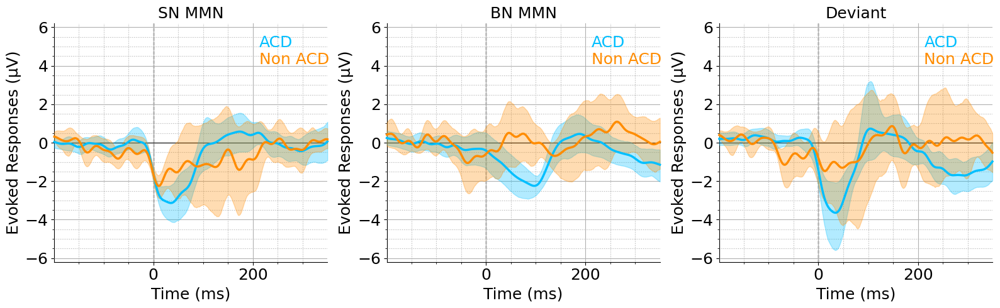

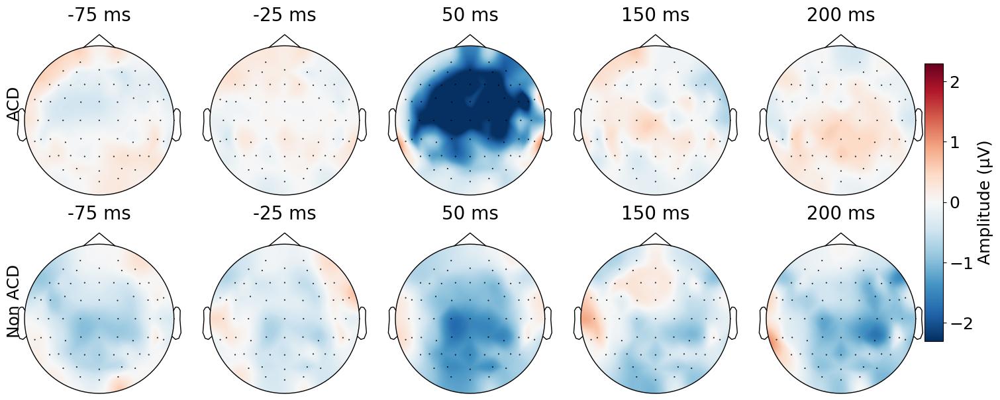

In [ ]:
stylesdict ={'acd sub': {"linewidth": 2.5,"linestyle":'solid','color' : 'deepskyblue'}, 
             'non_acd sub' : {"linewidth": 2.5,"linestyle":'solid','color' : 'darkorange'},
             }


text_labels = [
    (0.90, "ACD",'deepskyblue'),
    (0.83, f"Non ACD",'darkorange'),
]
# Example usage with subplots
fig, axs = plt.subplots(1, 3, figsize=(16, 5), dpi=100)

# Define first ERP comparison
evokeds = usage_groups_sn_aligned_sn
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="SN MMN",axs=axs[0],time_range=(-.200,.350))

# Define second ERP comparison
evokeds = usage_groups_sn_aligned_beep
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="BN MMN",axs=axs[1],time_range=(-.200,.350))


evokeds = usage_groups_sn_aligned_devi
plot_erps(evokeds, picks=[ 'Cz'],
                                   stylesdict=stylesdict,
                                   text_labels=text_labels,title="Deviant",axs=axs[2],time_range=(-.200,.350))
plt.tight_layout()
plt.show()
evokeds_subset = {}
for cond in usage_groups_sn_aligned_sn:
        evoked_crop  = [evk.copy().crop(tmin=time_range[0], tmax=time_range[1]) for evk in usage_groups_sn_aligned_sn[cond]]
        evokeds_subset[cond]  =evoked_crop 
# Define time points
time_points = [-0.075,-0.025, .050,.150,.200]

# Set the color scale range
vlim = (-2.3, 2.3)  # Adjust based on your data

# Create a grid of subplots
fig, axes = plt.subplots(2, len(time_points), figsize=(14, 6), constrained_layout=True)

# To store the last 'im' object for the colorbar
im = None

# Plot topomaps for the first evoked (Personal_MMN_erp)
for i, time in enumerate(time_points):
    mne.grand_average(evokeds_subset['acd sub']).copy().plot_topomap(
        times=[time], axes=axes[0, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    )
    axes[0, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Plot topomaps for the second evoked (B1_MMN_erp)
for i, time in enumerate(time_points):
    im= mne.grand_average(evokeds_subset['non_acd sub']).copy().plot_topomap(
        times=[time], axes=axes[1, i], colorbar=False, vlim=vlim, show=False,contours = 0,
    ) 
    axes[1, i].set_title(f"{time * 1000:.0f} ms",fontsize=20)

# Generate a shared colorbar
cbar_ax = fig.add_axes([0.99, 0.15, 0.02, 0.7])  # Position for the colorbar
norm = mpl.colors.Normalize(vmin=vlim[0], vmax=vlim[1])  # Normalize color scale
cmap = mpl.colormaps['RdBu_r']  # Choose a colormap (like 'RdBu_r')

# Add the colorbar
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
fig.colorbar(sm, cax=cbar_ax, orientation='vertical', label='Amplitude (µV)')

# Add row labels
fig.text(0.0001, 0.75, 'ACD', fontsize=18, rotation=90, va='center')
fig.text(0.0001, 0.25, 'Non ACD', fontsize=18   , rotation=90, va='center')

plt.show()

 Mean  Amplitude : t_stat [-0.88614418] with , p_value [0.38258834]
 Peak Amplitude : t_stat -0.48691756583971185 with , p_value 0.6298555151364245


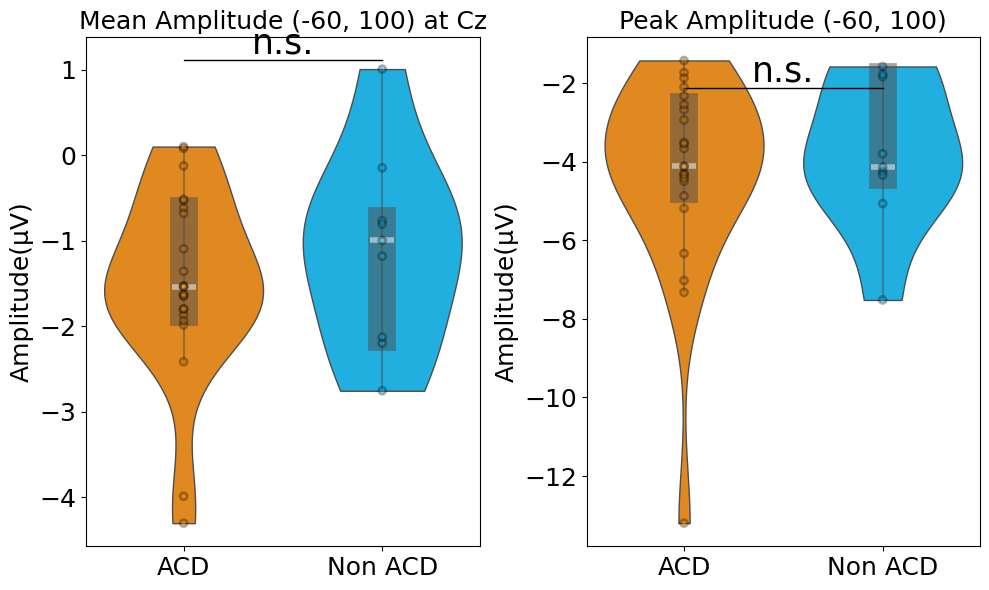

In [ ]:
df_type = "Amplitude"
label=("ACD", "Non ACD")
time_window = (-60, 100)  # MMN typically 100-250ms
channels = [ 'Cz']  # Common MMN channels
usage_groups_sn_aligned_sn = {key: dict() for key in usage_groups}

# Assign evokeds to the appropriate group
for sub, evoked in sn_aligned_sn.items():
    for group_name, subject_list in usage_groups.items():
        
        if sub in subject_list:
            usage_groups_sn_aligned_sn[group_name][sub] = evoked
            break
HSU_amps_peak = np.array(list(extract_peak_amplitude(usage_groups_sn_aligned_sn['acd sub'],time_window = (-.060, .100),channels=["Cz"]).values()))
LSU_amps_peak =np.array(list(extract_peak_amplitude(usage_groups_sn_aligned_sn['non_acd sub'],time_window = (-.060, .100),channels=["Cz"]).values()))

# usage_groups = {
#     'low sub': low_sub_D,
#     'high sub': high_sub_D,
# }

HSU_amps_mean = np.array([ np.mean(usage_groups_sn_aligned_sn['acd sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_sn_aligned_sn['acd sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_sn_aligned_sn['acd sub']])
LSU_amps_mean = np.array([ np.mean(usage_groups_sn_aligned_sn['non_acd sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(picks=channels), axis=1) 
            if channels else  np.mean(usage_groups_sn_aligned_sn['non_acd sub'][subject].copy().crop(tmin=time_window[0]/1000, 
                                                     tmax=time_window[1]/1000).get_data(), axis=1) 
            for subject in usage_groups_sn_aligned_sn['non_acd sub']])

#df = df_convert(HSU_amps, LSU_amps,label=("SN", "BN") )
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_mean.flatten()*1e+6, LSU_amps_mean.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_mean.shape[0], LSU_amps_mean.shape[0]]),

    })
    
fig, ax = plt.subplots(1,2 , figsize=(10,6), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(HSU_amps_mean, LSU_amps_mean)
print(f' Mean  Amplitude : t_stat {t_stat } with , p_value { p_value}')

ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Mean Amplitude {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type+"(µV)" )
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
df  = pd.DataFrame({
        df_type: np.concatenate([HSU_amps_peak.flatten()*1e+6, LSU_amps_peak.flatten()*1e+6]),
        'Case': np.repeat([label[0], label[1]], [HSU_amps_peak.shape[0], LSU_amps_peak.shape[0]]),

    })

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.5
t_stat, p_value = stats.ttest_ind(HSU_amps_peak, LSU_amps_peak)
print(f' Peak Amplitude : t_stat {t_stat } with , p_value { p_value}')
ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Peak Amplitude {time_window}", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type +"(µV)")
#ax.set_xticklabels(["PN", "BN"])
ax[0].ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

Peak latency ;- t_stat -0.6844525639676959 with , p_value 0.4989433770875106
Fractional area (50 %) latency ;- t_stat 0.4030679548073742 with , p_value 0.689756482789633


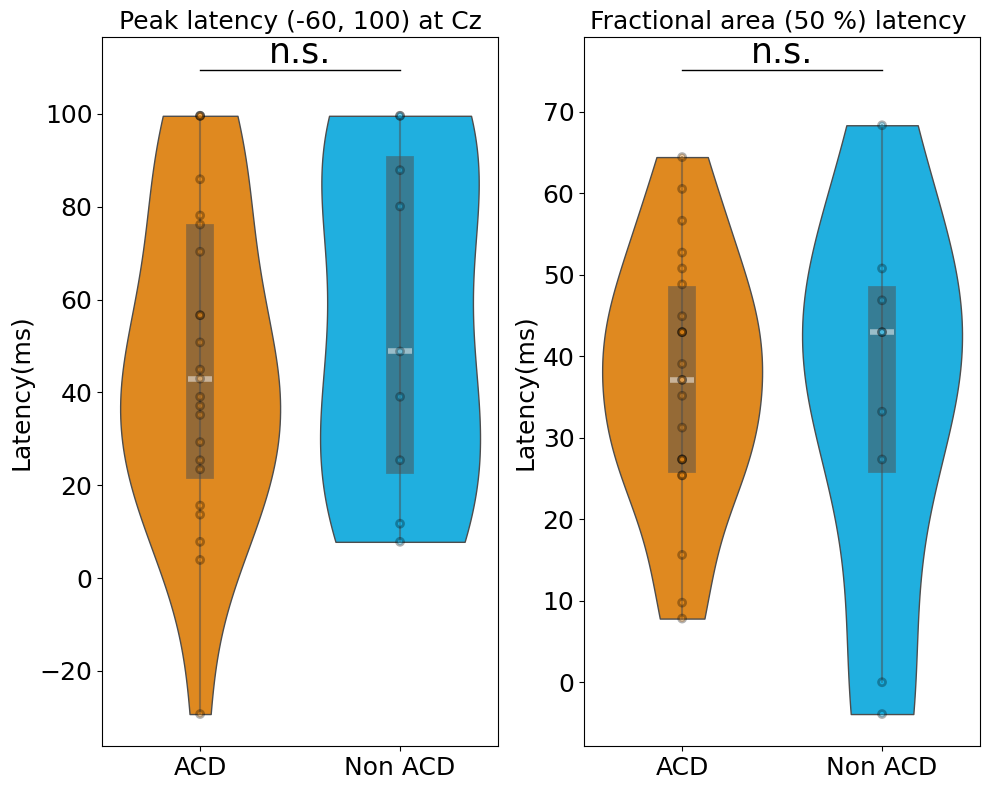

In [ ]:
time_window = (-60, 100)   # ms - typical MMN window
channels =["Cz"] # Typical frontocentral electrodes for MMN

peak_high_lat = unpaired_extract_mmn_latencies(usage_groups_sn_aligned_sn['acd sub'] , time_window=time_window,channels=channels, method='peak')
peak_low_lat = unpaired_extract_mmn_latencies(usage_groups_sn_aligned_sn['non_acd sub'] , time_window=time_window,channels=channels, method='peak')

area_high_lat = unpaired_extract_mmn_latencies(usage_groups_sn_aligned_sn['acd sub'] , time_window=time_window,channels=channels, method='fractional_area', fractional_area=0.50)
area_low_lat = unpaired_extract_mmn_latencies(usage_groups_sn_aligned_sn['non_acd sub'] , time_window=time_window,channels=channels, method='fractional_area', fractional_area=0.50)

# Extract Latency
df_type = "Latency"
label=("ACD", "Non ACD")
# Set up the plot
df  = pd.DataFrame({
        df_type: np.concatenate([peak_high_lat, peak_low_lat ]),
        'Case': np.repeat([label[0], label[1]], [peak_high_lat.shape[0], peak_low_lat.shape[0]]),

    })
df[df_type] = df[df_type]
fig, ax = plt.subplots(1,2 , figsize=(10,8), )
sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[0] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[0])

y_offset = 1.e-09
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(peak_high_lat, peak_low_lat)
print(f'Peak latency ;- t_stat {t_stat } with , p_value { p_value}')
ax[0].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[0].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[0].set_title(f"Peak latency {time_window} at {channels[0]}", fontsize=18)
ax[0].set_xlabel("")
ax[0].set_ylabel(df_type + '(ms)')
#ax.set_xticklabels(["PN", "BN"])


# Fraction area plot 
#df = df_convert(area_high_lat, area_low_lat ,label=("SN", "BN"),df_type = df_type)
df  = pd.DataFrame({
        df_type: np.concatenate([area_high_lat, area_low_lat]),
        'Case': np.repeat([label[0], label[1]], [peak_high_lat.shape[0], peak_low_lat.shape[0]]),

    })
df[df_type] = df[df_type]

sns.violinplot(data=df, y=df_type, x="Case",hue="Case", inner='box', linewidth=1, palette=['darkorange','deepskyblue'],
               inner_kws=dict(box_width=20, whis_width=1.5,alpha = 0.5),ax = ax[1] ,
               cut=0,)
# sns.boxplot(data=df, y="Amplitude", x="Case", width=0.2,boxprops=dict(facecolor='white', edgecolor='black'),
#             whiskerprops=dict(color='black'),
#             capprops=dict(color='black'),
#             medianprops=dict(color='black'),
#             flierprops=dict(marker='o', markersize=2, alpha=0.4, color='black'))
sns.stripplot(data=df, y=df_type, x="Case",hue="Case", size=5, jitter=False, alpha=0.3, linewidth=2,
              palette=['darkorange','deepskyblue'], edgecolor='black',dodge=False,ax= ax[1])

y_offset = 1.e-09 
y_max = max(df[df_type]) *1.1
t_stat, p_value = stats.ttest_ind(area_high_lat[~np.isnan(area_high_lat)], area_low_lat[~np.isnan(area_low_lat)])
print(f'Fractional area (50 %) latency ;- t_stat {t_stat } with , p_value { p_value}')

ax[1].plot([0,1], [y_max, y_max], lw=1, color='black')
star_label = '***' if p_value < 0.05 else 'n.s.'
ax[1].text((0 + 1) / 2, y_max , star_label, ha='center', va='bottom', fontsize=25)
# Final touches
ax[1].set_title(f"Fractional area (50 %) latency ", fontsize=18)
ax[1].set_xlabel("")
ax[1].set_ylabel(df_type + '(ms)'  )
#ax.set_xticklabels(["PN", "BN"])
plt.tight_layout()
plt.show()